# 0 load all

In [ ]:
## load
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-lotfollahi -n1   -gpu "num=1" -M 500000  -o ./merge_log.%J.bsub.out -e ./merge_log.%J.bsub.err -R"select[mem>200000] rusage[mem=200000]" bash /nfs/users/nfs_l/ls34/disease_atlas_v2/1_merge.sh


In [ ]:
## load
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-lotfollahi -n1   -gpu "num=1" -M 200000  -o ./load_v2_log.%J.bsub.out -e ./load_v2_log.%J.bsub.err -R"select[mem>200000] rusage[mem=200000]" bash /nfs/users/nfs_l/ls34/disease_atlas_v2/1_submit_load_all_v2.sh


In [ ]:
## load
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q long -n10 -M 200000  -o ./load_v2_log.%J.bsub.out -e ./load_v2_log.%J.bsub.err -R"select[mem>200000] rusage[mem=200000]" bash /nfs/users/nfs_l/ls34/disease_atlas_v2/1_submit_load_all_v2.sh


In [ ]:
###v3 adult atlas
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm 0_load_all_data3.bsub.out
rm 0_load_all_data3.bsub.err
bsub -G team298 -q long -n10 -M 600000 -o ./0_load_all_data3.%J.bsub.out -e ./0_load_all_data3.%J.bsub.err -R"select[mem>600000] rusage[mem=600000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/0_load_all_data3.sh

## max was 311_000 but might add more data

In [ ]:
## load
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q long -n2 -M 600000  -o ./load_v2_log.%J.bsub.out -e ./load_v2_log.%J.bsub.err -R"select[mem>600000] rusage[mem=600000]" bash /nfs/users/nfs_l/ls34/inflammatory_skin_atlas/disease_atlas_v2/1_submit_load_all_v2.sh


In [3]:
SAVE_PATH_PREQC='/nfs/team298/ls34/disease_atlas/data/all_raw_addedcore_v2.h5ad'
SAVE_PATH_POSTQC='/nfs/team298/ls34/new_disease_atlas/all_raw_addedcore_filteredmidqc.h5ad'

In [1]:
import scanpy as sc
base_dir = '/nfs/team298/ls34/new_disease_atlas/'

In [2]:
adata=sc.read_h5ad(base_dir + 'all_raw_addedcore_filteredmidqc.h5ad')
adata

AnnData object with n_obs × n_vars = 999032 × 36454
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid'
    var: 'mt', 'ribo', 'hb', 'cc_fetal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [3]:
adata.var

,mt,ribo,hb,cc_fetal,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_symbol,,,,,,,,
MIR1302-2HG,False,False,False,False,117,6.541195e-05,99.993459,117.0
FAM138A,False,False,False,False,1,5.590765e-07,99.999944,1.0
OR4F5,False,False,False,False,8,4.472612e-06,99.999553,8.0
AL627309.1,False,False,False,False,9199,5.317936e-03,99.485706,9512.0
AL627309.3,False,False,False,False,22,1.285876e-05,99.998770,23.0
...,...,...,...,...,...,...,...,...
AC141272.1,False,False,False,False,1182,1.058332e-03,99.933917,1893.0
AC023491.2,False,False,False,False,32,1.789045e-05,99.998211,32.0
AC007325.1,False,False,False,False,101,5.702580e-05,99.994353,102.0


In [7]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16,16))
sc.pl.umap(adata,  
       color = ["dataset_id",  ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=30)
# sc.pl.umap(adata,  
#        color = [ "lvl3_annotation"],
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data",
#       legend_fontsize=10)

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

# separate skin from non-skin datasets

In [4]:
adata.obs.dataset_id.value_counts()

dataset_id
GSE282122_GSE282122           805545
Lichen planus_GSE254542        68277
ning_wound                     57035
AA_NY_GSE233906                24284
HS_NY_GSE158955                23342
prurigo_calugura_GSE213849     14726
ARTHRITIS_MOVE_GSE216914        5823
Name: count, dtype: int64

In [5]:
adata.obs.Patient_status.value_counts()

Patient_status
Lichen planus    68277
Healthy          63949
AA               18747
HS               13667
GSM8636326        9505
                 ...  
GSM8636478         658
GSM8636376         557
GSM8636306         358
GSM8636363         327
GSM8636271         280
Name: count, Length: 223, dtype: int64

In [9]:
NONSKIN = ["GSE282122_GSE282122", "ARTHRITIS_MOVE_GSE216914"]
adata_nonskin = adata[adata.obs["dataset_id"].isin(NONSKIN)]
adata_nonskin.obs.dataset_id.value_counts()

dataset_id
GSE282122_GSE282122         805545
ARTHRITIS_MOVE_GSE216914      5823
Name: count, dtype: int64

In [48]:
for COL in adata_columns:
    if COL not in adata_nonskin.obs.columns:
        print(COL)


lvl3_annotation
lvl2_annotation
lvl0_annotation
lvl5_annotation
leiden_res0.1
new_anno8
leiden_res2
leiden_res0.2
lvl5_annotation_original
Site_status_binary
atlas_status_reynolds
disease


In [49]:
adata_nonskin.obs["lvl5_annotation"] = adata_nonskin.obs["dataset_id"] 
adata_nonskin.obs["Location"] = adata_nonskin.obs["dataset_id"] 
adata_nonskin.obs["Site_status_binary"] = adata_nonskin.obs["Site_status"] 



/tmp/ipykernel_645785/2643347782.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_nonskin.obs["lvl5_annotation"] = adata_nonskin.obs["dataset_id"]


In [58]:
adata_nonskin.write('/nfs/team298/ls34/new_disease_atlas/new_data/adata_nonskin_PSA_IBDTAURUS.h5ad')
"""
need to add HLCA, RA dataset, Intestine+Endometrium, IPF, MI...
"""

'\nneed to add HLCA, RA dataset, Intestine+Endometrium, IPF, MI...\n'

In [11]:
NONSKIN = ["GSE282122_GSE282122", "ARTHRITIS_MOVE_GSE216914"]
adata_skin = adata[~adata.obs["dataset_id"].isin(NONSKIN)]
adata_skin.obs.dataset_id.value_counts()


dataset_id
Lichen planus_GSE254542       68277
ning_wound                    57035
AA_NY_GSE233906               24284
HS_NY_GSE158955               23342
prurigo_calugura_GSE213849    14726
Name: count, dtype: int64

In [14]:
adata_skin.shape

(187664, 36454)

In [16]:
adata_skin.write('/nfs/team298/ls34/new_disease_atlas/new_data/adata_skinV2_notintegrated_LP_Wound_AA_HS_PrurigoCalu.h5ad')

In [3]:
adata_skin=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/new_data/adata_skinV2_notintegrated_LP_Wound_AA_HS_PrurigoCalu.h5ad')

In [5]:
adata_aa=adata_skin[adata_skin.obs["dataset_id"]=="AA_NY_GSE233906"]
adata_aa


View of AnnData object with n_obs × n_vars = 24284 × 36454
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid'
    var: 'mt', 'ribo', 'hb', 'cc_fetal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [6]:
adata_aa.write('/nfs/team298/ls34/new_disease_atlas/new_data/adata_skinV2_AAonly.h5ad')

In [25]:
adata_skin_columns=set(adata_skin.obs.columns)

In [31]:
adata_allskin=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_all_6377_genebatch/adata_all_scvi6.h5ad.countsonly.annotated2counts')


In [34]:
adata_allskin.obs.dataset_id.value_counts()

dataset_id
Reynolds                 440287
Huda                     208123
Luc_psoriasis            169257
Ganier                   132806
Keloid                    86546
Dermalsheath_Ahlers       84310
Ma_psoriasis              82394
Church_Healthy            64728
Lupus_Dunlap              45053
AA_Greenleaf              33554
SCCarcinoma_Ji            31319
SSc_Ma                    22285
Ma_Prurigo                20285
DRESS                     20064
Sole-Boldo                19776
Dupuytren's_Dobie         19770
SSc_Tabib                 17828
Boothby_Th2Stroma         15571
Lyme_jiang                14976
Healthy_Weidmann          14759
Localized SSc             11606
HS_Moran                  10471
Keloid_Deng                9851
GA_Wang                    9190
Prurigo_calugareanu        9061
PSMorphoea                 8866
Vitiligo_Shiu              8828
HS_Mariottoni              7155
ImmunotherapyReaction      4753
Takahashi                  4731
Name: count, dtype: int64

In [42]:
adata_columns=set(adata_allskin.obs.columns)
adata_columns

{'Age',
 'Chemistry',
 'GSE',
 'Location',
 'OriginalAnnotation',
 'Patient_status',
 'QC_hi',
 'QC_mid',
 'Sex',
 'Site_status',
 'Site_status_binary',
 'atlas_status_reynolds',
 'barcode',
 'dataset_id',
 'disease',
 'leiden_res0.1',
 'leiden_res0.2',
 'leiden_res2',
 'lvl0_annotation',
 'lvl2_annotation',
 'lvl3_annotation',
 'lvl5_annotation',
 'lvl5_annotation_original',
 'n_genes',
 'n_genes_by_counts',
 'new_anno8',
 'pct_counts_in_top_100_genes',
 'pct_counts_in_top_200_genes',
 'pct_counts_in_top_500_genes',
 'pct_counts_in_top_50_genes',
 'pct_counts_mt',
 'pct_counts_ribo',
 'sample_id',
 'total_counts',
 'total_counts_mt',
 'total_counts_ribo'}

In [35]:
for COL in adata_columns:
    if COL not in adata_skin_columns:
        print(COL)

lvl3_annotation
lvl2_annotation
lvl0_annotation
lvl5_annotation
leiden_res0.1
new_anno8
leiden_res2
leiden_res0.2
lvl5_annotation_original
Site_status_binary
atlas_status_reynolds
disease


# expand nonskin

In [23]:
import os
base_dir  = '/nfs/team298/ls34/new_disease_atlas/new_data/reprocess_public_10x/' 
[x for x in os.listdir(base_dir) if "log" not in x]

['GSE216914_old',
 'README.md',
 'ac9c13da-7134-4d09-8086-d0933cbdba41.h5ad',
 'LICENSE',
 'adata_wound.h5ad',
 'adata_ra_ithink.h5ad',
 'GSE282122',
 'notsureifhealthyrpeated_GSE206123',
 'img',
 'tests',
 'GSE233906',
 'GSE216914',
 'adata_HLCA.h5ad',
 'GSE254542',
 'wounds.zip',
 'adata_raithink.h5ad.zip',
 'GSE213849',
 'adata_HLCA.h5ad.fibroblasts',
 'test_data',
 'adata_arthritis_Tcells.h5ad',
 'scripts',
 'adata_HLCA.h5ad.lymphoid',
 '.git',
 'GSE158955',
 'NingGroup_cellranger_wounds',
 'Dockerfile',
 '.github']

In [22]:
adata_ra = sc.read_h5ad(base_dir +  'adata_ra_ithink.h5ad')

In [27]:
adata_ra

AnnData object with n_obs × n_vars = 36719 × 36391
    obs: 'sample', 'log_counts', 'n_genes', 'mt_frac', 'rb_frac', 'cluster_harmony_k100', 'subtype_fine', 'CD34+', 'HLA-DRAhi', 'DKK3+', 'CD55+ Lining', 'prime_cell_sig', 'HLAhigh Sublining', 'THY1high Sublining', 'THY1+CD34+ Subining', 'THY1+GAS6+Sublining', 'Pelka - CRC_pS13 (Pelka inflammatory CAF)', 'Pelka - CRC_pS02 (Pelka Fibro matrix/ stem cell niche)', 'Pelka - CRC_pS01 (Smooth Muscle)', 'Pelka - CRC_pS03 (ACTA2)', 'Pelka - CRC_pS05 (ISGs)', 'Pelka - CRC_pS08 (Collagens)', 'Pelka - CRC_pS10 (angiogenesis)', 'Pelka - CRC_pS11 (Fibro CCL8)', 'Pelka - CRC_pS12 (prolif)', 'Pelka - CRC_pS16 (Metallothionein)', 'Pelka - CRC_pS17 (Fibro BMP-producing)', 'Pelka - CRC_pS21 (Fos, Jun)', 'Smillie - UC - healthy_Inflammatory Fibs', 'Smillie - UC - healthy_myofibroblasts', 'Smillie - UC - healthy_WNT2B+ RSPO3+', 'Smillie - UC - healthy_WNT2B+ Fos hi', 'Smillie - UC - healthy_WNT2B+ Fos lo 1', 'Smillie - UC - healthy_WNT2B+ Fos lo 2', 'Smill

In [ ]:
adata_ra.obs

In [39]:
for COL in adata_columns:
    if COL not in adata_ra.obs.columns:
        print(COL)

n_genes_by_counts
lvl3_annotation
lvl2_annotation
QC_mid
lvl0_annotation
leiden_res0.1
total_counts_ribo
barcode
pct_counts_in_top_500_genes
Sex
pct_counts_in_top_200_genes
new_anno8
pct_counts_mt
pct_counts_in_top_50_genes
total_counts
pct_counts_ribo
pct_counts_in_top_100_genes
total_counts_mt
leiden_res2
leiden_res0.2
Chemistry
OriginalAnnotation
GSE
lvl5_annotation_original
Age
QC_hi
atlas_status_reynolds
Patient_status
disease


In [40]:
adata_ra.obs["lvl5_annotation"]=adata_ra.obs["subtype_fine"]
adata_ra.obs["sample_id"]=adata_ra.obs["sample"]
adata_ra.obs["DonorID"]=adata_ra.obs["sample"]
adata_ra.obs["dataset_id"]="RA_Smith"
adata_ra.obs["Location"]="Synvoium"
adata_ra.obs["Site_status"]="Lesional"
adata_ra.obs["Site_status_binary"]=adata_ra.obs["Site_status"]
adata_ra.obs["Patient_status"]="RA"
adata_ra.obs["GSE"]="RA_Smith"


In [41]:
adata_ra.write(base_dir +  'adata_ra_processed.h5ad')

# HLCA 

In [ ]:
# SE EBLWO

# Intestine and endometrium 

In [50]:
base_dir2 ='/nfs/team298/ls34/reprocess_public_10x/nonskin/'
[x for x in os.listdir(base_dir2) if "adata" in x]

['adata_external_qc_3172.h5ad',
 'adata_external_qc_0_GSE214695_IBD.h5ad',
 'adata_external_qc_FBSONLY.h5ad.normalised.GSE214695_IBD.HVGS.INTEGRATED',
 'adata_external_qc_0_heart.h5ad',
 'adata_external_qc_IBD.h5ad',
 'adata_external_qc_1343.h5ad',
 'adata_external_qc_0_GSE132771_IPF.h5ad',
 'adata_external_qc_FBSONLY.h5ad.normalised.HVGS',
 'adata_external_qc_FBSONLY.h5ad.normalised.heart.HVGS',
 'adata_external_PLUSSKIN.h5ad',
 'adata_external_qc_FBSONLY.h5ad.normalised',
 'adata_external_qc_IPF.h5ad',
 'adata_external_qc.h5ad',
 'adata_external_qc_FBSONLY.h5ad.normalised.GSE132771_IPF.HVGS',
 'adata_external_qc_FBSONLY_PLUSSKIN.h5ad.normalised.HVGS',
 'adata_skin_intestine_endometrial.h5ad',
 'adata_external_qc_FBSONLY.h5ad.integrated',
 'adata_external_qc_IBD_RA.h5ad',
 'adata_external_qc_FBSONLY.h5ad.normalised.GSE132771_IPF.HVGS.INTEGRATED',
 'adata_external_qc_0.h5ad',
 'adata_external_qc_FBSONLY.h5ad',
 'adata_EXTERNAL_lungipf.h5ad',
 'adata_external_qc_FBSONLY_PLUSSKIN.h5ad.no

# IPF

In [55]:
adata_ipf = sc.read_h5ad(base_dir2 + 'adata_external_qc.h5ad')
adata_ipf


/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 361928 × 37944
    obs: 'sample_id', 'barcode', 'dataset_id', 'n_genes', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'OriginalAnnotation', 'Chemistry', 'scrublet_score', 'scrublet_score_z', 'cluster_scrublet_score', 'bh_pval', 'scrublet_done', 'SampleID2', 'scrublet_binary', 'DonorID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid'
    var: 'ensg_id', 'mt', 'ribo', 'hb', 'cc_fetal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable_nbatches', 'highly_variable'
    obsm: 'gene_expression_encoding'
    layers: 'cellranger'

In [46]:
adata_ipf.obs.dataset_id.value_counts()

dataset_id
heart            212901
GSE132771_IPF    106857
GSE214695_IBD     39196
GSE228982_RA       2974
Name: count, dtype: int64

In [56]:
adata_ipf[adata_ipf.obs["dataset_id"]=="GSE228982_RA"].obs.sample_id.value_counts()

sample_id
GSM7146910    1589
GSM7146914    1385
Name: count, dtype: int64

In [57]:
for COL in adata_columns:
    if COL not in adata_ipf.obs.columns:
        print(COL)

lvl3_annotation
lvl2_annotation
lvl0_annotation
lvl5_annotation
leiden_res0.1
Sex
new_anno8
Site_status
leiden_res2
leiden_res0.2
GSE
lvl5_annotation_original
Age
Site_status_binary
Location
atlas_status_reynolds
Patient_status
disease


In [59]:
adata_ipf = adata_ipf[adata_ipf.obs["dataset_id"]!="GSE228982_RA"]

In [63]:
adata_ipf.obs["Patient_status"]=adata_ipf.obs["dataset_id"]
adata_ipf.obs["Site_status_binary"]="Lesional"
adata_ipf.obs["Site_status"]="Lesional"

adata_ipf.obs["Location"]=adata_ipf.obs["Site_status"]


In [89]:
adata_ipf.write(base_dir2 + 'adata_external_postqc.h5ad')
adata_ipf


AnnData object with n_obs × n_vars = 358954 × 36602
    obs: 'sample_id', 'barcode', 'dataset_id', 'n_genes', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'OriginalAnnotation', 'Chemistry', 'scrublet_score', 'scrublet_score_z', 'cluster_scrublet_score', 'bh_pval', 'scrublet_done', 'SampleID2', 'scrublet_binary', 'DonorID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid', 'Patient_status', 'Site_status_binary', 'Site_status', 'Location'
    var: 'ensg_id', 'mt', 'ribo', 'hb', 'cc_fetal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable_nbatches', 'highly_variable'
    obsm: 'gene_expression_encoding'
    layers: 'cellranger'

# merge all

In [67]:
adata_ipf.var

,ensg_id,mt,ribo,hb,cc_fetal,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable_nbatches,highly_variable
gene_symbol,,,,,,,,,,,
TSPAN6,ENSG00000000003,False,False,False,False,10311,0.023571,98.120218,12929.0,35.0,True
TNMD,ENSG00000000005,False,False,False,False,316,0.000645,99.942391,354.0,12.0,False
DPM1,ENSG00000000419,False,False,False,False,86284,0.208798,84.269700,114530.0,12.0,False
SCYL3,ENSG00000000457,False,False,False,False,32526,0.069470,94.070236,38106.0,29.0,True
C1orf112,ENSG00000000460,False,False,False,True,21691,0.046964,96.045548,25761.0,45.0,True
...,...,...,...,...,...,...,...,...,...,...,...
CRIPAK,ENSG00000288380,False,False,False,False,8792,0.016579,98.397144,9094.0,23.0,False
AL109627.1,ENSG00000288398,False,False,False,False,1237,0.002288,99.774484,1255.0,17.0,False
AC024558.2,ENSG00000288436,False,False,False,False,20603,0.046576,96.243900,25548.0,13.0,False


In [69]:
del(adata_ra.var["gene_name"])

In [74]:
adata_nonskin.var

,mt,ribo,hb,cc_fetal,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_symbol,,,,,,,,
MIR1302-2HG,False,False,False,False,117,6.541195e-05,99.993459,117.0
FAM138A,False,False,False,False,1,5.590765e-07,99.999944,1.0
OR4F5,False,False,False,False,8,4.472612e-06,99.999553,8.0
AL627309.1,False,False,False,False,9199,5.317936e-03,99.485706,9512.0
AL627309.3,False,False,False,False,22,1.285876e-05,99.998770,23.0
...,...,...,...,...,...,...,...,...
AC141272.1,False,False,False,False,1182,1.058332e-03,99.933917,1893.0
AC023491.2,False,False,False,False,32,1.789045e-05,99.998211,32.0
AC007325.1,False,False,False,False,101,5.702580e-05,99.994353,102.0


In [79]:
adata_ra.obs_names_make_unique()
adata_nonskin.obs_names_make_unique()
adata_ipf.obs_names_make_unique()

 

In [83]:
adata_ra.var

,gene_ids,feature_types,genome,mt_gene_mask,n_counts,rb_gene_mask,bad_gene_mask,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,mean,std
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,False,1,False,False,False,0.000007,-0.238887,-0.674735,0,False,0.000006,0.001116
FAM138A,ENSG00000237613,Gene Expression,GRCh38,False,0,False,False,False,0.000000,0.000000,0.000000,0,False,0.000000,1.000000
OR4F5,ENSG00000186092,Gene Expression,GRCh38,False,0,False,False,False,0.000000,0.000000,0.000000,0,False,0.000000,1.000000
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,220,False,False,False,0.046907,2.395819,-0.006649,0,False,0.011210,0.169402
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,7,False,False,False,0.001458,1.697694,-0.744086,0,False,0.000336,0.029312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC141272.1,ENSG00000277836,Gene Expression,GRCh38,False,0,False,False,False,0.000000,0.000000,0.000000,0,False,0.000000,1.000000
AC023491.2,ENSG00000278633,Gene Expression,GRCh38,False,2,False,False,False,0.000059,0.116092,-0.343854,0,False,0.000030,0.005745
AC007325.1,ENSG00000276017,Gene Expression,GRCh38,False,16,False,False,True,0.004922,2.246377,0.731050,1,False,0.000757,0.046951
AC007325.4,ENSG00000278817,Gene Expression,GRCh38,False,119,False,False,False,0.078922,2.900281,-0.017348,0,False,0.006298,0.128821


In [82]:
adata_ipf.var

,ensg_id,mt,ribo,hb,cc_fetal,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable_nbatches,highly_variable
gene_symbol,,,,,,,,,,,
TSPAN6,ENSG00000000003,False,False,False,False,10311,0.023571,98.120218,12929.0,35.0,True
TNMD,ENSG00000000005,False,False,False,False,316,0.000645,99.942391,354.0,12.0,False
DPM1,ENSG00000000419,False,False,False,False,86284,0.208798,84.269700,114530.0,12.0,False
SCYL3,ENSG00000000457,False,False,False,False,32526,0.069470,94.070236,38106.0,29.0,True
C1orf112,ENSG00000000460,False,False,False,True,21691,0.046964,96.045548,25761.0,45.0,True
...,...,...,...,...,...,...,...,...,...,...,...
CRIPAK,ENSG00000288380,False,False,False,False,8792,0.016579,98.397144,9094.0,23.0,False
AL109627.1,ENSG00000288398,False,False,False,False,1237,0.002288,99.774484,1255.0,17.0,False
AC024558.2,ENSG00000288436,False,False,False,False,20603,0.046576,96.243900,25548.0,13.0,False


In [81]:
adata_nonskin.var

,mt,ribo,hb,cc_fetal,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_symbol,,,,,,,,
MIR1302-2HG,False,False,False,False,117,6.541195e-05,99.993459,117.0
FAM138A,False,False,False,False,1,5.590765e-07,99.999944,1.0
OR4F5,False,False,False,False,8,4.472612e-06,99.999553,8.0
AL627309.1,False,False,False,False,9199,5.317936e-03,99.485706,9512.0
AL627309.3,False,False,False,False,22,1.285876e-05,99.998770,23.0
...,...,...,...,...,...,...,...,...
AC141272.1,False,False,False,False,1182,1.058332e-03,99.933917,1893.0
AC023491.2,False,False,False,False,32,1.789045e-05,99.998211,32.0
AC007325.1,False,False,False,False,101,5.702580e-05,99.994353,102.0


In [86]:
print(len(adata_ipf.var_names), len(set(adata_ipf.var_names)))
print(len(adata_nonskin.var_names), len(set(adata_nonskin.var_names)))
print(len(adata_ra.var_names), len(set(adata_ra.var_names)))

37944 36602
36454 36454
36391 36391


In [88]:
adata_ipf = adata_ipf[:, ~adata_ipf.var_names.duplicated()].copy()

In [98]:
adata_ra

AnnData object with n_obs × n_vars = 36719 × 36391
    obs: 'sample', 'log_counts', 'n_genes', 'mt_frac', 'rb_frac', 'cluster_harmony_k100', 'subtype_fine', 'CD34+', 'HLA-DRAhi', 'DKK3+', 'CD55+ Lining', 'prime_cell_sig', 'HLAhigh Sublining', 'THY1high Sublining', 'THY1+CD34+ Subining', 'THY1+GAS6+Sublining', 'Pelka - CRC_pS13 (Pelka inflammatory CAF)', 'Pelka - CRC_pS02 (Pelka Fibro matrix/ stem cell niche)', 'Pelka - CRC_pS01 (Smooth Muscle)', 'Pelka - CRC_pS03 (ACTA2)', 'Pelka - CRC_pS05 (ISGs)', 'Pelka - CRC_pS08 (Collagens)', 'Pelka - CRC_pS10 (angiogenesis)', 'Pelka - CRC_pS11 (Fibro CCL8)', 'Pelka - CRC_pS12 (prolif)', 'Pelka - CRC_pS16 (Metallothionein)', 'Pelka - CRC_pS17 (Fibro BMP-producing)', 'Pelka - CRC_pS21 (Fos, Jun)', 'Smillie - UC - healthy_Inflammatory Fibs', 'Smillie - UC - healthy_myofibroblasts', 'Smillie - UC - healthy_WNT2B+ RSPO3+', 'Smillie - UC - healthy_WNT2B+ Fos hi', 'Smillie - UC - healthy_WNT2B+ Fos lo 1', 'Smillie - UC - healthy_WNT2B+ Fos lo 2', 'Smill

In [99]:
adata_ra.X=adata_ra.layers["count"].copy()
del(adata_ra.layers["count"])

In [100]:
import anndata as ad
adata_all = ad.concat([adata_ipf, adata_nonskin, adata_ra])

In [105]:
del(adata_all.obs["n_genes"])

In [106]:
adata_all.write('/nfs/team298/ls34/new_disease_atlas/new_data/adata_all_external_2025.h5ad')



# Merge w HLCA

In [ ]:
2

In [1]:
import scanpy as sc
base_dir3 = '/nfs/team298/ls34/new_disease_atlas/new_data/reprocess_public_10x/'
adata_HLCA = sc.read_h5ad(base_dir3 +  'adata_HLCA.h5ad')
adata_HLCA

AnnData object with n_obs × n_vars = 2282447 × 56239
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

In [2]:
import pickle
with open('/lustre/scratch126/cellgen/team298/ls34/gene_ensgids_dictionaries.pkl', 'rb') as file:
    dictionaries = pickle.load(file)
    gene_dict = dictionaries['gene_dict']
    del(dictionaries)

In [3]:
adata_HLCA.var["ensg_id"] = adata_HLCA.var.index


In [4]:
adata_HLCA.var["gene_symbol"] = adata_HLCA.var.index.map(gene_dict)


In [5]:
adata_HLCA.var_names = adata_HLCA.var["gene_symbol"] 
del(adata_HLCA.var["gene_symbol"] ) 

In [16]:
# Convert 'gene_symbol' column to strings explicitly
adata_HLCA.var_names = adata_HLCA.var_names.astype(str)
 
adata_HLCA.var

""
gene_symbol
A1BG
A1BG-AS1
A1CF
A2M
A2M-AS1
...
RAB1B
STC1
STXBP1


In [8]:
adata_HLCA.obs.head(8)

,suspension_type,donor_id,is_primary_data,assay_ontology_term_id,cell_type_ontology_term_id,development_stage_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,tissue_ontology_term_id,organism_ontology_term_id,...,tissue_type,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid
CGATGTAAGTTACGGG_SC10,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0009899,CL:0000583,HsapDv:0000149,PATO:0000461,HANCESTRO:0008,UBERON:0008946,NCBITaxon:9606,...,tissue,alveolar macrophage,10x 3' v2,normal,Homo sapiens,male,lung parenchyma,Asian,55-year-old human stage,LL;0n*@mx8
cc05p_CATGCCTGTGTGCCTG_carraro_csmc,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0009899,unknown,unknown,PATO:0000461,unknown,UBERON:0002048,NCBITaxon:9606,...,tissue,unknown,10x 3' v2,normal,Homo sapiens,unknown,lung,unknown,unknown,)rNf~Q0&BX
ATTCTACCAAGGTTCT_HD68,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0011025,CL:0002144,HsapDv:0000135,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,tissue,capillary endothelial cell,10x 5' v1,normal,Homo sapiens,male,lung parenchyma,European,41-year-old human stage,5%kv|ie@!5
D062_TGACCCTTCAAACCCA-sub_wang_sub_batch3,nucleus,homosapiens_None_2023_None_sikkemalisa_002_d10...,False,EFO:0009922,CL:4028004,HsapDv:0000082,PATO:0000461,unknown,UBERON:0002048,NCBITaxon:9606,...,tissue,alveolar type 1 fibroblast cell,10x 3' v3,normal,Homo sapiens,male,lung,unknown,newborn human stage,Jq?*-$kHDp
muc9826_GTCGTGAGAGGA_mayr,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0008722,CL:0002145,HsapDv:0000151,MONDO:0002771,unknown,UBERON:0002048,NCBITaxon:9606,...,tissue,ciliated columnar cell of tracheobronchial tree,Drop-seq,pulmonary fibrosis,Homo sapiens,male,lung,unknown,57-year-old human stage,m35M8pyQm_
P1_2_TGCTGCTAGCTCCTCT,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,False,EFO:0009899,CL:0000583,HsapDv:0000169,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,tissue,alveolar macrophage,10x 3' v2,normal,Homo sapiens,male,lung parenchyma,European,75-year-old human stage,Vf*$A^fe9?
scrBT1428_CCACGGATCGCATGGC_lambrechts,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0030003,CL:0000625,unknown,MONDO:0005097,unknown,UBERON:0002048,NCBITaxon:9606,...,tissue,"CD8-positive, alpha-beta T cell",10x 3' transcription profiling,squamous cell lung carcinoma,Homo sapiens,unknown,lung,unknown,unknown,kok@4pR6O8
CTGATAGTCTTAGAGC_F01367,cell,homosapiens_None_2023_None_sikkemalisa_002_d10...,True,EFO:0011025,CL:1001568,HsapDv:0000153,PATO:0000461,HANCESTRO:0005,UBERON:0008946,NCBITaxon:9606,...,tissue,pulmonary artery endothelial cell,10x 5' v1,normal,Homo sapiens,male,lung parenchyma,European,59-year-old human stage,N&yk@nHmmo


In [9]:
adata_HLCA.obs["ann_level_5"].value_counts()

ann_level_5
Unknown                          623313
None                             418277
Multiciliated (non-nasal)        113074
Monocyte-derived Mph              88248
Goblet (nasal)                    72359
Club (nasal)                      35644
Club (non-nasal)                  14722
Alveolar Mph CCL3+                11192
pre-TB secretory                  11124
Interstitial Mph perivascular      8317
Multiciliated (nasal)              5038
Alveolar Mph proliferating         4832
SMG serous (bronchial)             2775
SMG serous (nasal)                 2504
Goblet (bronchial)                 2257
AT0                                1815
Alveolar Mph MT-positive           1444
Goblet (subsegmental)              1190
Name: count, dtype: int64

In [10]:
adata_HLCA.obs.columns

Index(['suspension_type', 'donor_id', 'is_primary_data',
       'assay_ontology_term_id', 'cell_type_ontology_term_id',
       'development_stage_ontology_term_id', 'disease_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id',
       'organism_ontology_term_id', 'sex_ontology_term_id', '3'_or_5'', 'BMI',
       'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score',
       'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1',
       'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5',
       'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen',
       'log10_total_counts', 'lung_condition', 'mixed_ancestry',
       'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3',
       'original_ann_level_4', 'original_ann_level_5',
       'original_ann_nonharmonized', 'reannotation_type', 'sample',
       'scanvi_label', 'sequencing_platform', 'smoking_status', 'study',
       'su

In [7]:
adata_HLCA.obs["lvl5_annotation"]=adata_HLCA.obs["cell_type"]
adata_HLCA.obs["lvl0_annotation"]=adata_HLCA.obs["ann_level_2"]

adata_HLCA.obs["sample_id"]=adata_HLCA.obs["sample"]
adata_HLCA.obs["DonorID"]=adata_HLCA.obs["donor_id"]
adata_HLCA.obs["dataset_id"]="HLCA"
adata_HLCA.obs["Location"]=adata_HLCA.obs["tissue"]
adata_HLCA.obs["Site_status"]=adata_HLCA.obs["disease"]
adata_HLCA.obs["Site_status_binary"]=adata_HLCA.obs["disease"]
adata_HLCA.obs["Patient_status"]=adata_HLCA.obs["disease"]
adata_HLCA.obs["GSE"]="HLCA"


In [8]:
adata_columns = set(['Age',
 'Chemistry',
 'GSE',
 'Location',
 'OriginalAnnotation',
 'Patient_status',
 'QC_hi',
 'QC_mid',
 'Sex',
 'Site_status',
 'Site_status_binary',
 'atlas_status_reynolds',
 'barcode',
 'dataset_id',
 'disease',
 'leiden_res0.1',
 'leiden_res0.2',
 'leiden_res2',
 'lvl0_annotation',
 'lvl2_annotation',
 'lvl3_annotation',
 'lvl5_annotation',
 'lvl5_annotation_original',
 'n_genes',
 'n_genes_by_counts',
 'new_anno8',
 'pct_counts_in_top_100_genes',
 'pct_counts_in_top_200_genes',
 'pct_counts_in_top_500_genes',
 'pct_counts_in_top_50_genes',
 'pct_counts_mt',
 'pct_counts_ribo',
 'sample_id',
 'total_counts',
 'total_counts_mt',
 'total_counts_ribo'])

In [13]:
for COL in adata_columns:
    if COL not in adata_HLCA.obs.columns:
        print(COL)

Age
OriginalAnnotation
atlas_status_reynolds
barcode
n_genes
total_counts_ribo
QC_mid
leiden_res0.2
pct_counts_in_top_50_genes
lvl3_annotation
new_anno8
pct_counts_in_top_500_genes
pct_counts_mt
Chemistry
leiden_res0.1
leiden_res2
total_counts_mt
pct_counts_in_top_100_genes
lvl2_annotation
QC_hi
lvl5_annotation_original
Sex
n_genes_by_counts
pct_counts_ribo
pct_counts_in_top_200_genes


In [10]:
adata_HLCA

AnnData object with n_obs × n_vars = 2282447 × 56239
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

In [12]:
del(adata_HLCA.var)

In [13]:
adata_HLCA.var

""
gene_symbol
A1BG
A1BG-AS1
A1CF
A2M
A2M-AS1
...
RAB1B
STC1
STXBP1


In [18]:
base_dir3 = '/nfs/team298/ls34/new_disease_atlas/new_data/reprocess_public_10x/'
adata_HLCA.write(base_dir3 +  'adata_HLCA.h5ad.processed')


# added some columns so start here

In [1]:
import scanpy as sc


In [3]:
base_dir3 = '/nfs/team298/ls34/new_disease_atlas/new_data/reprocess_public_10x/'
adata_HLCA=sc.read_h5ad(base_dir3 +  'adata_HLCA.h5ad.processed')


/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
unique_var_index = ~adata_HLCA.var.index.duplicated(keep='first')
adata_HLCA = adata_HLCA[:, unique_var_index]





In [5]:
assert adata_HLCA.var.index.is_unique, "var.index is still not unique!"


In [6]:
adata_HLCA.shape

(2282447, 33946)

In [7]:
base_dir3 = '/nfs/team298/ls34/new_disease_atlas/new_data/reprocess_public_10x/'
adata_HLCA.write(base_dir3 +  'adata_HLCA.h5ad.processed')


In [8]:
import gc

# Delete the object
del adata_HLCA

# Force garbage collection
gc.collect()

4728

In [9]:
stop

NameError: name 'stop' is not defined

In [10]:
base_dir2 ='/nfs/team298/ls34/reprocess_public_10x/nonskin/'
adata_endometrium = sc.read_h5ad(base_dir2 +  'adata_skin_intestine_endometrial.h5ad')
adata_endometrium

AnnData object with n_obs × n_vars = 529226 × 17713
    obs: 'n_genes', 'Age', 'Site_status', 'DonorID', 'test12', 'Mapping'

In [11]:
# for COL in adata_columns:
#     if COL not in adata_endometrium.obs.columns:
#         print(COL)

NameError: name 'adata_columns' is not defined

In [ ]:
adata_endometrium.obs.columns

In [ ]:
adata_endometrium.obs

In [12]:
adata_endometrium.obs["lvl5_annotation"]=adata_endometrium.obs["test12"]
adata_endometrium.obs["lvl0_annotation"]=adata_endometrium.obs["test12"]
adata_endometrium.obs["sample_id"]=adata_endometrium.obs["DonorID"]
#adata_endometrium.obs["DonorID"]=adata_endometrium.obs["donor_id"]
adata_endometrium.obs["dataset_id"]=adata_endometrium.obs["Mapping"]
adata_endometrium.obs["Location"]=adata_endometrium.obs["Mapping"]
#adata_endometrium.obs["Site_status"]=adata_endometrium.obs["disease"]
adata_endometrium.obs["Site_status_binary"]=adata_endometrium.obs["Site_status"]
adata_endometrium.obs["Patient_status"]=adata_endometrium.obs["Site_status"]
adata_endometrium.obs["GSE"]="Mapping"

del(adata_endometrium.obs["n_genes"])

In [ ]:
# adata_HLCA.var 

In [ ]:
# adata_HLCA.var

In [13]:
adata_endometrium.var

""
A1BG
A2M
A4GALT
AAAS
AACS
...
ZXDC
ZYG11A
ZYG11B
ZYX


In [14]:
base_dir2 ='/nfs/team298/ls34/reprocess_public_10x/nonskin/'
adata_endometrium .write(base_dir2 +  'adata_skin_intestine_endometrial.h5ad.processed')
adata_endometrium

AnnData object with n_obs × n_vars = 529226 × 17713
    obs: 'Age', 'Site_status', 'DonorID', 'test12', 'Mapping', 'lvl5_annotation', 'lvl0_annotation', 'sample_id', 'dataset_id', 'Location', 'Site_status_binary', 'Patient_status', 'GSE'

In [ ]:
# import gc

# # Delete the object
# del adata_endometrium

# # Force garbage collection
# gc.collect()

# re-run all

In [15]:
import scanpy as sc
base_dir3 = '/nfs/team298/ls34/new_disease_atlas/new_data/reprocess_public_10x/'
adata_HLCA=sc.read_h5ad(base_dir3 +  'adata_HLCA.h5ad.processed')
adata_HLCA

AnnData object with n_obs × n_vars = 2282447 × 33946
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 

In [ ]:
# base_dir2 ='/nfs/team298/ls34/reprocess_public_10x/nonskin/'
# adata_endometrium=sc.read_h5ad(base_dir2 +  'adata_skin_intestine_endometrial.h5ad.processed')
# adata_endometrium

In [16]:
import anndata as ad
adata_hlca_endometrium = ad.concat([adata_endometrium, adata_HLCA])

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/anndata/_core/merge.py:1357: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [18]:
import gc

# Delete the object
del adata_HLCA
del adata_endometrium

# Force garbage collection
gc.collect()

1763

In [19]:
adata_hlca_endometrium.write('/nfs/team298/ls34/new_disease_atlas/new_data/endometrium_WHLCA.h5ad')

In [1]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/new_data/endometrium_WHLCA.h5ad')
adata.obs.lvl5_annotation.value_counts()

lvl5_annotation
unknown                            623313
alveolar macrophage                276291
type II pneumocyte                 156713
respiratory basal cell             119037
CD8-positive, alpha-beta T cell    113641
                                    ...  
myofibroblast (RSPO2+)                151
hematopoietic stem cell                61
mLTo                                   47
Mesothelium (PRG4+)                    25
Stromal 2 (CH25H+)                      5
Name: count, Length: 96, dtype: int64

# Merge final

In [1]:
import scanpy as sc
adata_hlca_endometrium=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/new_data/endometrium_WHLCA.h5ad')
adata_hlca_endometrium.var


""
A1BG
A2M
A4GALT
AAAS
AACS
...
ZXDB
ZXDC
ZYG11A
ZYG11B


In [2]:
8

8

In [3]:
adata_all=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/new_data/adata_all_external_2025.h5ad')


In [ ]:
import anndata as ad
adata_all = ad.concat([adata_all, adata_hlca_endometrium])


In [ ]:
adata_all.write('/nfs/team298/ls34/new_disease_atlas/new_data/adata_all_external_2025_WHLCA.h5ad')

In [ ]:
adata_all.var

In [ ]:
stop

# RUN INTEGRIATION WITHA LL

In [ ]:
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-lotfollahi -n1 -M 700000 -gpu "num=1"  -o ./EXTERNAL_LOG.%J.bsub.out -e ./EXTERNAL_LOG.%J.bsub.err -R"select[mem>700000] rusage[mem=700000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_Map_EXTERNAL.sh


In [ ]:
cd /nfs/team298/ls34cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-lotfollahi -n1 -M 700000 -gpu "num=1"  -o ./EXTERNAL_LOG.%J.bsub.out -e ./EXTERNAL_LOG.%J.bsub.err -R"select[mem>700000] rusage[mem=700000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_Map_EXTERNAL.sh
/new_disease_atlas/
bsub -G team298 -q gpu-normal -n1 -M 700000 -gpu "num=1"  -o ./EXTERNAL_LOG.%J.bsub.out -e ./EXTERNAL_LOG.%J.bsub.err -R"select[mem>700000] rusage[mem=700000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_Map_EXTERNAL.sh



In [1]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/adata_EXTERNAL_OTHERTISSUES_and_Atlas.h5ad')
adata

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 5646917 × 17143
    obs: 'sample_id', 'dataset_id', 'Site_status', 'Patient_status', 'Location', 'lvl5_annotation', 'Site_status_binary', 'Mapping_status2'

In [2]:
adata.var

""
TSPAN6
TNMD
DPM1
SCYL3
C1orf112
...
AC083837.1
AL009176.1
AC068282.1
HIST1H3C


In [7]:
adata.X

<5646917x17143 sparse matrix of type '<class 'numpy.float64'>'
	with 9779952487 stored elements in Compressed Sparse Row format>

In [5]:
adata.obs["Mapping_status2"].value_counts()

Mapping_status2
EXTERNAL_OTHERTISSUES    4018714
Atlas                    1628203
Name: count, dtype: int64

In [9]:
adata.shape

(5646917, 17143)

In [3]:
print(f"adata shape: {adata.shape}")
print(f"Nonzero elements in adata.X: {adata.X.nnz if hasattr(adata.X, 'nnz') else (adata.X != 0).sum()}")

adata shape: (5646917, 17143)
Nonzero elements in adata.X: 9779952487


In [ ]:
sc.pp.filter_genes(adata, min_counts=1)

In [ ]:
sc.pp.filter_genes(adata, min_counts=1)

In [ ]:
adata.shape

In [3]:
adata.obs["sample_id"].value_counts()

sample_id
SRS9768413          35781
ADSKI_HS13767523    31212
SRS9768411          31037
SRS9768410          26143
ADSKI_HS13767522    24889
                    ...  
GSM6697706              8
F01869                  8
GSM6697712              6
GSM7932814              2
GSM6697709              1
Name: count, Length: 1636, dtype: int64

In [10]:
adata = adata[adata.X.sum(axis=1) > 0]  # Remove empty cells


In [ ]:
adata = adata[:, adata.X.sum(axis=0) > 0]  # Remove empty genes

In [ ]:
adata.shape

In [ ]:
import scanpy as sc
adata=.write('/nfs/team298/ls34/new_disease_atlas/adata_EXTERNAL_OTHERTISSUES_and_Atlas.h5ad')
adata

In [2]:
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-lotfollahi -n1 -M 700000 -gpu "num=1"  -o ./EXTERNAL_LOG.%J.bsub.out -e ./EXTERNAL_LOG.%J.bsub.err -R"select[mem>700000] rusage[mem=700000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_Map_EXTERNAL.sh


AnnData object with n_obs × n_vars = 5646917 × 17143
    obs: 'sample_id', 'dataset_id', 'Site_status', 'Patient_status', 'Location', 'lvl5_annotation', 'Site_status_binary', 'Mapping_status2'

# merge AAsmm

In [9]:
import os
file_path = '/nfs/team298/ls34/disease_atlas/mrvi/adata_AA_vitiligo.h5ad'
adata=sc.read_h5ad(file_path)
adata_i = adata[adata.obs["Patient_status"].isin(["AA", "Vitiligo"])]
adata_i  #. write(file_path)


View of AnnData object with n_obs × n_vars = 47031 × 36601
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'lvl3_annotation', 'lvl2_annotation', 'lvl0_annotation', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid', 'leiden_res0.2', 'leiden_res2', 'lvl5_annotation', 'lvl5_annotation_original'
    var: 'ensg_id', 'mt', 'ribo', 'hb', 'cc_fetal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable_nbatches', 'highly_variable'
    uns: 'leiden_res0.2', 'leiden_res2', 'log1p', 'neighbor_20', 'umap'
    obsm: 'X_scvi', 'X_umap'
    layers: 'counts'
    obsp: 'neighbor_20_connectivities', 'neighbor_20_distances'

In [10]:

adata_aa=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/new_data/adata_skinV2_AAonly.h5ad')


In [11]:
for x in adata_aa.obs.columns:
    if x not in adata_i.obs.columns:
        print(x)

In [12]:
for x in adata_i.obs.columns:
    if x not in  adata_aa.obs.columns:
        print(x)

lvl3_annotation
lvl2_annotation
lvl0_annotation
leiden_res0.2
leiden_res2
lvl5_annotation
lvl5_annotation_original


In [13]:
adata_i.obs["lvl5_annotation"]="AA_v1"

/tmp/ipykernel_3642428/4250960708.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["lvl5_annotation"]="AA_v1"


In [14]:
import anndata as ad
adata=ad.concat([adata_aa, adata_i])

In [15]:
adata.sampl

AnnData object with n_obs × n_vars = 71315 × 36454
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid'

In [19]:
adata.obs.sample_id.value_counts()

sample_id
GSM6532921    9022
GSM6532919    6699
GSM6532922    6212
GSM6532920    5641
GSM7438945    5440
GSM6165465    4617
GSM7438943    4538
GSM6165462    3489
GSM7438941    3303
GSM7438947    3169
GSM6165463    3044
GSM6165464    2839
GSM7438942    2434
GSM7438946    2368
GSM7438948    1926
GSM6165460    1656
GSM6165459    1525
GSM7438944    1106
GSM6165461     941
GSM6165458     491
GSM6165466     353
GSM6165469     315
GSM6165467     187
Name: count, dtype: int64

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/new_data/adata_skinV2_AAonly_plusAAv1_vitiligo.h5ad')


# Map arhtritis (lymphoid only)

In [ ]:
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-lotfollahi -n1 -M 300000 -gpu "num=1"  -o ./MAP_ARTHRITIS_LYMPHOID_LOG.%J.bsub.out -e ./MAP_ARTHRITIS_LYMPHOID_LOG.%J.bsub.err -R"select[mem>300000] rusage[mem=300000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_Map_ARTHRITIS_LYMPHOIDONLY.sh




In [ ]:
cd /nfs/team298/ls34/new_disease_atlas/
bsub -G team298 -q gpu-normal -n1 -M 600000 -gpu "num=1"  -o ./AA_LOG.%J.bsub.out -e ./AA_LOG.%J.bsub.err -R"select[mem>600000] rusage[mem=600000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_Map_AA_V2.sh


In [ ]:
'/nfs/team298/ls34/disease_atlas/mrvi/adata_AA_vitiligo.h5ad'


In [ ]:
###v3 adult atlas
cd /nfs/team298/ls34/new_disease_atlas/
#rm 0_load_all_data4.bsub.out
#rm 0_load_all_data4.bsub.err
bsub -G team298 -q normal -n4 -M 500000 -o ./0_load_all_data3.bsub.out -e ./0_load_all_data3.bsub.err -R"select[mem>500000] rusage[mem=500000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/0_load_all_data3.sh

## max was 311_000 but might add more data

In [ ]:
# import scanpy as sc
# adata=sc.read_h5ad("/nfs/team298/ls34/adult_skin/preintegration_data/all_noma2.h5ad")
# adata.obs.dataset_id.value_counts()

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm 0_load_all_data.bsub.out
rm 0_load_all_data.bsub.err
bsub -G team298 -q normal -n4 -M 400000 -o ./0_load_all_data.bsub.out -e ./0_load_all_data.bsub.err -R"select[mem>400000] rusage[mem=400000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/0_load_all_data.sh

## max was 311_000 but might add more data



In [ ]:
###v2
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm 0_load_all_data2.bsub.out
rm 0_load_all_data2.bsub.err
bsub -G team298 -q normal -n4 -M 400000 -o ./0_load_all_data2.bsub.out -e ./0_load_all_data2.bsub.err -R"select[mem>400000] rusage[mem=400000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/0_load_all_data2.sh

## max was 311_000 but might add more data

In [ ]:
### outputs '/nfs/team298/ls34/disease_atlas/data/all_raw_addedcore_filteredmidqc.h5ad'

In [ ]:
import scanpy as sc
adata = sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/all_raw_addedcore_filteredmidqc.h5ad')
adata


In [ ]:
adata.obs

In [ ]:
adata.var

# 1 run scvi4 = integrate all

In [ ]:
### second run 
cd /nfs/team298/ls34/new_disease_atlas/
rm ./1_scvi4_all2.bsub.err
rm ./1_scvi4_all2.bsub.out
 
bsub -G team298 -q gpu-huge -n1 -M 500000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi4_all2.%J.bsub.out -e ./1_scvi4_all2.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash ~/fibroblast_atlas/1_scvi4_all_new.sh

bsub -G team298 -q gpu-lotfollahi -n1 -M 500000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi4_all2.%J.bsub.out -e ./1_scvi4_all2.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash ~/fibroblast_atlas/1_scvi4_all_new.sh

#max 444 000

In [ ]:
### first run (had error in code so did 3000 genes)
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./1_scvi4_all2.bsub.err
rm ./1_scvi4_all2.bsub.out
 
bsub -G team298 -q gpu-normal -n4 -M 160000 -gpu "mode=exclusive_process:num=4"  -o ./1_scvi4_all3.bsub.out -e ./1_scvi4_all3.bsub.err -R"select[mem>320000] rusage[mem=320000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi4_all.sh

### second run 
cd /nfs/team298/ls34/new_disease_atlas/
rm ./1_scvi4_all2.bsub.err
rm ./1_scvi4_all2.bsub.out
 
bsub -G team298 -q gpu-huge -n1 -M 400000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi4_all2.bsub.out -e ./1_scvi4_all2.bsub.err -R"select[mem>400000] rusage[mem=400000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi4_all.sh

bsub -G team298 -q gpu-normal -n1 -M 400000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi4_all2.bsub.out -e ./1_scvi4_all2.bsub.err -R"select[mem>400000] rusage[mem=400000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi4_all.sh




In [ ]:
### optional = run mrvi as well

In [ ]:
### run mrvi 
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./1_scvi4_mrvi.bsub.err
rm ./1_scvi4_mrvi.bsub.out
 
bsub -G team298 -q gpu-normal -n2 -M 160000 -gpu "mode=exclusive_process:num=2"  -o ./1_scvi4_mrvi.bsub.out -e ./1_scvi4_mrvi.bsub.err -R"select[mem>320000] rusage[mem=320000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi4_mrvi.sh


In [ ]:
### change neighbors and leiden cluster the mrvi output
cd /nfs/team298/ls34/disease_atlas/mrvi/

bsub -G team298 -q normal -n15 -M 200000 -o ./1_scvi4_annotate.bsub.out -e ./1_scvi4_annotate.bsub.err -R"select[mem>200000] rusage[mem=200000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi4_all_annotate.sh

# Look at scvi4 output (lesional + nonlesional, scvi integration)

In [ ]:
import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
#[x for x in os.listdir(base_dir) if x.startswith('scvi4_all_SCVI')]


In [ ]:
adata_scvi4_removedjunk.h5ad 

adata_mrvi_all_scvi4_v4.h5ad

# Exclude normalixed and reintegrate healthy only

In [ ]:
### run mrvi 
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./1_scvi4_mrvi.bsub.err
rm ./1_scvi4_mrvi.bsub.out
 
bsub -G team298 -q normal -n8 -M 500000 -o ./1_scvi222_mrvi.bsub.out -e ./1_scvi222_mrvi.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_neighbors.sh


In [ ]:
### run mrvi 
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./1_scvi4_mrvi.bsub.err
rm ./1_scvi4_mrvi.bsub.out
 
bsub -G team298 -q normal -n1 -M 400000 -o ./1_scvi222_mrvi.bsub.out -e ./1_scvi222_mrvi.bsub.err -R"select[mem>400000] rusage[mem=400000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_neighbors.sh


In [ ]:
9

In [ ]:
adata_filename = 'adata_mrvi_all_scvi4_v4.h5ad'
adata=sc.read_h5ad(base_dir + adata_filename)
adata
#adata=adata[adata.obs["dataset_id"] != "Atopic dermatitis_He"]


In [ ]:
adata.X[:5,:5].A

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
6

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16,16))
sc.pl.umap(adata,  
       color = ["leiden_res0.2",  ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=30)
sc.pl.umap(adata,  
       color = [ "lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
2

In [ ]:
adata.obs["test"]=[x if x=="43" else "Other" for x in adata.obs["leiden_res2"] ]
sc.pl.umap(adata,  
       color = [ "test"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata[adata.obs["leiden_res2"]=="62"].obs["dataset_id"].value_counts()

In [ ]:
2

In [ ]:
del(adata.layers["counts"])


In [ ]:
adata = adata[adata.obs["leiden_res2"]!="32"]
adata = adata[adata.obs["leiden_res2"]!="43"]
adata.shape



In [ ]:

adata = adata[adata.obs["leiden_res2"]!="61"].copy()


In [ ]:
adata.obs.dataset_id.nunique()


In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
# adata_fIilename = 'adata_scvi4_removedjunk.h5ad'
# adata.write(base_dir + adata_filename)



In [ ]:

adata_filename = 'adata_scvi4_removedjunk.h5ad.counts'
adata.write(base_dir + adata_filename)



In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
adata_i = adata[(adata.obs["leiden_res0.2"]=="22")|
               (adata.obs["leiden_res0.2"]=="23")|
                (adata.obs["leiden_res0.2"]=="22")
               ]
adata.shape

adata_filename = 'adata_scvi4_removedjunk.h5ad'
adata.write(base_dir + adata_filename)

adata = adata[adata.obs["leiden_res0.2"]!="9"]
adata.shape

import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
[x for x in os.listdir(base_dir) if x.startswith('scvi4_all_SCVI')]
adata_filename = 'adata_mrvi_all_scvi4_v4.h5ad'
adata=sc.read_h5ad(base_dir + adata_filename)
adata
#adata=adata[adata.obs["dataset_id"] != "Atopic dermatitis_He"]



In [ ]:
import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
adata_filename = 'adata_scvi4_removedjunk.h5ad.counts.HVGs'
adata=sc.read_h5ad(base_dir + adata_filename)
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = ["lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      #legend_loc="on data",
      legend_fontsize=10)

In [ ]:
FILE_NAME='/nfs/team298/ls34/disease_atlas/mrvi/adata_glial.h5ad'
adata.write(FILE_NAME)

In [ ]:

adata_filename = 'adata_scvi4_removedjunk_LC_MigDC_only.h5ad'
adata.write(base_dir + adata_filename)


In [ ]:
adata_i = adata[adata.obs["leiden_res0.2"]=="7"]
adata.shape



In [ ]:

adata_filename = 'adata_scvi4_Schwannrelated.h5ad'
adata_i.write(base_dir + adata_filename)


In [ ]:
import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
[x for x in os.listdir(base_dir) if x.startswith('scvi4_all_SCVI')]
adata_filename = 'adata_scvi4_removedjunk.h5ad'
adata=sc.read_h5ad(base_dir + adata_filename)


In [ ]:
"""
mrvi
import scanpy as sc
import os
import numpy as np

base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
[x for x in os.listdir(base_dir) if x.startswith('adata_mrvi')]

"""

In [ ]:
# #adata_filename = 'adata_scvi4all_2798.h5ad'
# adata_filename="/nfs/team298/ls34/disease_atlas/mrvi/adata_mrvi_all_scvi4_clustered.h5ad"
# adata=sc.read_h5ad(adata_filename)
# adata=adata[adata.obs["dataset_id"] != "Atopic dermatitis_He"]


In [ ]:
rename_dict={"PostRx": "Lesional"}
adata.obs["Site_status_binary"]= adata.obs["Site_status"].map(rename_dict).fillna(adata.obs["Site_status"])
adata.obs.Site_status_binary.value_counts()

In [ ]:
adata[adata.obs["sample_id"]=="GSM7157924"].obs.sample_id.value_counts()

In [ ]:
adata

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
adata[adata.obs["GSE"]=="GSE229279"].obs.sample_id.value_counts()

In [ ]:
newdi = {"F": "Female",
        "f": "Female",
"M": "Male",
"Mixed_lupus": "Mixed",
"M_uncertain": "M_uncertain",
"F_uncertain": "F_uncertain"} 
adata.obs["Sex_original"]=adata.obs["Sex"]
adata.obs["Sex"] = adata.obs["Sex"].map(newdi).fillna("Missing")
adata.obs["Sex"].value_counts()



In [ ]:
import numpy as np

conditions = [
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] != "Eczema") & (adata.obs["Patient_status"] != "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] != "Reynolds"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] != "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] != "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] != "Reynolds")
]

choices = [
    "Nonlesional atlas",
    "Eczema_nonlesional",
    "Psoriasis_nonlesional",
    "Psoriasis_lesional",
    "Eczema_lesional",
    "Eczema_nonlesional_other",
    "Psoriasis_nonlesional_other",
    "Psoriasis_lesional_other",
    "Eczema_lesional_other"
]

adata.obs["atlas_status_reynolds"] = np.select(conditions, choices, default=np.nan)


import numpy as np

conditions = [
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] != "Eczema") & (adata.obs["Patient_status"] != "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Eczema"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Eczema")
]

choices = [
    "Nonlesional atlas",
    "Eczema_nonlesional",
    "Psoriasis_nonlesional",
    "Psoriasis_lesional",
    "Eczema_lesional"
]

adata.obs["atlas_status"] = np.select(conditions, choices, default=np.nan)

adata.obs["Site_status_binary"] = ["Nonlesional" if x=="Nonlesional" else "Lesional" for x in adata.obs["Site_status"]]
import numpy as np
adata.obs["Site_status2"] = np.where(
    adata.obs["Patient_status"] == "Healthy", "Healthy", 
    np.where(
        adata.obs["Site_status_binary"] == "Nonlesional", "Nonlesional", 
        "Lesional"
    )
)

import numpy as np

# Create the new column based on the specified conditions
adata.obs["Patient_status2"] = np.where(adata.obs["Site_status_binary"] == "Nonlesional", 
                                        "Nonlesional", 
                                        adata.obs["Patient_status"])

# Verify the new column
adata.obs["Patient_status2"].value_counts()

In [ ]:
adata.obs["Sex"].value_counts()


In [ ]:
adata_filename = 'adata_scvi4_removedjunk.h5ad'
adata.write(base_dir + adata_filename, 
           compression="gzip")


In [ ]:
base_dir + adata_filename

In [ ]:
# Define custom colors
custom_colors = {
    "Nonlesional": "#b0e0f0",  # Light blue
    "Lesional":  "#FFB6C1",   #FFB6C1",  # Light red
  #  "Other": "#D3D3D3"  # Light grey
}

# Ensure 'fb_vs_other2' is a categorical column
adata.obs["Site_status_binary"] = adata.obs["Site_status_binary"].astype("category")

# Map colors to the categories in 'fb_vs_other2'
adata.uns['Site_status_binary_colors'] = [custom_colors[category] for category in adata.obs['Site_status_binary'].cat.categories]


sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = ["Site_status_binary"],
      s=2, vmax=5, vmin=-10,
      #legend_loc="on data",
      legend_fontsize=10)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = ["Site_status_binary", "lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata.shape

In [ ]:
import scanpy as sc
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
adata_filename = 'adata_all_scvi5.h5ad.countsonly'
adata=sc.read_h5ad(base_dir + adata_filename)
adata
adata = adata[adata.obs["Patient_status"].isin(["Psoriasis", "Eczema"])]
adata = adata[~adata.obs["dataset_id"].str.startswith("Psoriasis_Kim")]
adata.obs.dataset_id.value_counts()
"""
TO DO: MAP OVER LABELS
"""
adata.write('/nfs/team298/ls34/disease_atlas/mrvi/adata_AD_psoriasis.h5ad.countsonly')

In [ ]:
adata.obs["Patient_status"].value_counts()


In [ ]:
adata = adata[adata.obs["Patient_status"].isin(["Psoriasis", "Eczema"])]


In [ ]:
2

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
adata = adata[~adata.obs["dataset_id"].str.startswith("Psoriasis_Kim")]
adata.obs.dataset_id.value_counts()
adata.write('/nfs/team298/ls34/disease_atlas/mrvi/adata_AD_psoriasis.h5ad.countsonly')

In [ ]:
adata_ia data

In [ ]:
adata.write('/nfs/team298/ls34/disease_atlas/mrvi/adata_AD_psoriasis.h5ad.countsonly')

In [ ]:
import scanpy as sc
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
adata_filename = 'adata_scvi4_removedjunk.h5ad.counts'
adata=sc.read_h5ad(base_dir + adata_filename)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = ["Site_status_binary", "lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
1

# scvi5 (=like scvi4 but junk removed

In [ ]:
### second run 
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 640000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>640000] rusage[mem=640000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all.sh

### crashes but adds ".HVG"

In [ ]:
import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
#[x for x in os.listdir(base_dir) if x.startswith('scvi4_all_SCVI')]
#adata_filename = 'adata_all_scvi5.h5ad'
#adata_filename = 'adata_all_scvi5.h5ad.countsonly'
adata_filename='adata_scvi4_removedjunk.h5ad.counts'
adata=sc.read_h5ad(base_dir + adata_filename)
adata.X[:5,:5].A


# healtyn only

In [ ]:
adata

In [ ]:
### second run 
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 350000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>350000] rusage[mem=350000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_healthy.sh



In [ ]:
import os
import scanpy as sc
base_dir='/nfs/team298/ls34/new_disease_atlas/'
FILE_NAME =  'model_scanvi5_healthy_8401'
#FILE_NAME ='model_scanvi5_healthy_6009'
os.listdir(base_dir + FILE_NAME)



In [ ]:
adata = sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation", "leiden_res0.2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res1"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# adata.obs["test"] = [x if x.startswith("Psoriasis_Kim") else "Other" for x in adata.obs["dataset_id"]]
# sc.pl.umap(adata,  
#        color = [ "test"],
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data",
#       legend_fontsize=10)

In [ ]:
adata = adata[~adata.obs["leiden_res1"].isin([#"45","35"
    "12" ,])]#.unique()]
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)



In [ ]:
# import pandas as pd
# #adata_subset.uns['log1p']['base'] = None
# sc.tl.rank_genes_groups(adata, 'leiden_res1', method='t-test', key_added="de_leiden");
# df2 = pd.DataFrame(adata.uns['de_leiden']['names'])

# file_path = BASE_DIR + "df2.csv"

# # Save the DataFrame to a CSV file
# df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers
# df2.iloc[:, ].head(5)


In [ ]:

# select_pop = list(df2.columns)[53-1]
# genes0= df2[select_pop][:100]
# genes1= df2[select_pop][100:200]
# genes2= df2[select_pop][200:300]
# genes3= df2[select_pop][300:400]
# genes4= df2[select_pop][400:500]
# genes5= df2[select_pop][500:600]

# genes6= df2[select_pop][600:700]
# genes7= df2[select_pop][700:800]
# genes8= df2[select_pop][800:900]
# genes9= df2[select_pop][900:1000]
# genes10= df2[select_pop][1000:1100]
# genes11= df2[select_pop][1100:1200]
#     #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
#     #result_dict[column] = values

# # Display the resulting dictionary
# #print(result_dict)
# sc.pl.dotplot(
#     adata,
#     genes0,
#     groupby='leiden_res1',
#    standard_scale="var",
#     dendrogram=False)
# sc.pl.dotplot(
#     adata,
#     genes1,
#     groupby='leiden_res1',
#    standard_scale="var",
#     dendrogram=False)
# # sc.pl.dotplot(
# #     adata,
# #     genes2,
# #     groupby='leiden_res1',
# #    standard_scale="var",
# #     dendrogram=False)

In [ ]:
adata_i  = adata[adata.obs["leiden_res1"].isin(["5", "27", "2", "7"])]
adata_i.shape

In [ ]:

import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata_i, 'leiden_res1', method='t-test', key_added="de_leiden");
df3= pd.DataFrame(adata_i.uns['de_leiden']['names'])

# file_path = BASE_DIR + "df2.csv"

# # Save the DataFrame to a CSV file
# df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers
df3.iloc[:, ].head(5)


In [ ]:

select_pop = list(df3.columns)[-1]
genes0= df3[select_pop][:100]
genes1= df3[select_pop][100:200]
genes2= df3[select_pop][200:300]
genes3= df3[select_pop][300:400]
genes4= df3[select_pop][400:500]
genes5= df3[select_pop][500:600]

 
# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata_i,
    genes0,
    groupby='leiden_res1',
   #standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    genes1,
    groupby='leiden_res1',
   #standard_scale="var",
    dendrogram=False)
# sc.pl.dotplot(
#     adata,
#     genes2,
#     groupby='leiden_res1',
#    standard_scale="var",
#     dendrogram=False)

In [ ]:
GENES = ["SLC35F1", "LGALS1", "MFAP4", "SERPING1", "PLAC9", "COL3A1", "WIF1", "AQP1", "F10", "MGP"]
sc.pl.dotplot(
    adata,
    GENES,
    groupby='lvl5_annotation',
   #standard_scale="var",
    dendrogram=False)

In [ ]:
GENES = ["ETS2", "SVIL", "DSC3", "CXADR", "CA12", "ITGA6", "S100A14", "AQP3"]
sc.pl.dotplot(
    adata,
    GENES,
    groupby='lvl5_annotation',
   #standard_scale="var",
    dendrogram=False)

In [ ]:
adata[adata.obs["leiden_res1"] =="49"].obs.dataset_id.value_counts()

In [ ]:
select_pop = list(df2.columns)[35]
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata,
    genes0,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    genes1,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)
# sc.pl.dotplot(
#     adata,
#     genes2,
#     groupby='leiden_res1',
#    standard_scale="var",
#     dendrogram=False)

In [ ]:
adata = adata[~adata.obs["leiden_res1"].isin(["49","35", "53"])] 

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)



In [ ]:
adata.write( '/nfs/team298/ls34/new_disease_atlas/model_scanvi5_healthy_8401/adata_all_scvi5.h5ad.countsonly_notrash' )
adata

In [ ]:
adata=adata[adata.obs["leiden_res1"]!="44"]

In [ ]:
adata.write( '/nfs/team298/ls34/new_disease_atlas/model_scanvi5_healthy_8401/adata_all_scvi5.h5ad.countsonly_notrash' )
adata

In [ ]:
9

# re-run without trash

In [ ]:
### no trash run 
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 350000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>350000] rusage[mem=350000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_healthy_notrash.sh



In [ ]:
### no trash run 
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 500000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_healthy_notrash.sh



In [ ]:

adata.obs.Site_status.value_counts()

In [ ]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scanvi5_healthy_5106'
os.listdir(base_dir + FILE_NAME)




In [ ]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scanvi5_nonlesional_5577'
os.listdir(base_dir + FILE_NAME)



In [ ]:

import scanpy as sc
adata=sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
adata

In [ ]:
#adata.write('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_healthy_5968/adata_all_scvi5_labelled.h5ad.countsonly')

In [ ]:
"""
scVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation",],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)


In [ ]:
import pandas as pd

# Create an empty dictionary to store the result
result_dict = {}

# Iterate over unique values in adata.obs["leiden_res2"]
for group in adata.obs["leiden_res2"].unique():
    # Filter the data for the current group
    group_data = adata.obs[adata.obs["leiden_res2"] == group]
    
    # Get value counts for "lvl5_annotation"
    value_counts = group_data["lvl5_annotation"].value_counts()
    
    # Get the most frequent label
    most_frequent = value_counts.idxmax()
    
    # Check if the most frequent label is 'New/unlabelled/excluded'
    if most_frequent == 'New/unlabelled/excluded':
        # Get the second most frequent label (if it exists)
        second_most_frequent = value_counts.index[1] if len(value_counts) > 1 else 'No valid label'
        result_dict[group] = second_most_frequent
    else:
        # Use the most frequent label
        result_dict[group] = most_frequent

# Display the result
print(result_dict)
RENAME=result_dict

In [ ]:
RENAME['31']

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
# RENAME2 = {'35': 'KC2/3_cycling',
#  '5': 'KC3',
#  '44': 'Bcell',
#  '29': 'KC4',
#  '37': 'Bcell',
#  '17': 'KC_Sebocyte_inner',
#  '31': 'Bcell',
#  '22': 'KC1',
#  '12': 'VE3_SELPhi',
#  '20': 'F4: DS_DPEP1+',
#  '48': 'F1: Superficial',
#  '25': 'LE',
#  '16': 'Melanocyte',
#  '18': 'Pericyte2_CASQ2+',
#  '42': 'F2/3: Stroma_PPARG+',
#  '39': 'VE1_ADAMTS6_Art',
#  '57': 'F5: RAMP1+',
#  '21': 'Bcell',
#  '10': 'Pericyte1_CCL19+',
#  '62': 'VE3_SELP_CD36+PPARG+',
#  '43': 'KC3',
#  '52': 'Bcell',
#  '11': 'F3: FRC-like',
#  '54': 'F5: NGFR+',
#  '0': 'F1: Superficial',
#  '33': 'LC_SLC18A2+',
#  '34': 'F4: TNN+COCH+',
#  '38': 'Treg',
#  '59': 'nmSchwann',
#  '4': 'F2: Universal',
#  '27': 'Tc_ZNF683+/γδ',
#  '8': 'Th',
#  '40': 'ILC1_3',
#  '64': 'Tnaive/Tcm',
#  '26': 'Treg_LRRC32',
#  '55': 'NK',
#  '47': 'Tc',
#  '1': 'Th',
#  '36': 'Bcell',
#  '50': 'cDC1',
#  '6': 'cDC2: IL1B+',
#  '30': 'Tc_IFNGhi',
#  '69': 'Bcell',
#  '56': 'MigDC',
#  '45': 'Mast cell',
#  '49': 'ILC1_NK',
#  '65': 'F4: DP_HHIP+',
#  '41': 'Tc',
#  '13': 'Bcell',
#  '9': 'KC1',
#  '24': 'KC3',
#  '2': 'F2/3: Stroma_PPARG+',
#  '71': 'Bcell',
#  '73': 'mSchwann',
#  '58': 'Smooth muscle',
#  '60': 'Th',
#  '14': 'Mac2_CCL14hi',
#  '46': 'MacTREM2_CX3CR1+',
#  '15': 'VE3_SELPhi',
#  '70': 'Satellite muscle',
#  '67': 'Plasma cell',
#  '3': 'VE2',
#  '61': 'Bcell',
#  '51': 'Mono',
#  '74': 'Bcell',
#  '72': 'pDC',
#  '63': 'Mono CD16+',
#  '7': 'F2: Universal',
#  '23': 'Pericyte2_CASQ2+',
#  '68': 'Bcell',
#  '28': 'Mac1',
#  '32': 'LC_CCR7+',
#  '19': 'MoDC',
#  '66': 'MoDC',
#  '53': 'Cartilage'}

In [ ]:
adata.obs["lvl5_annotation_original"]=adata.obs["lvl5_annotation"]


In [ ]:
adata.obs["lvl5_annotation"]=adata.obs["leiden_res2"].map(RENAME) #.fillna(adata.obs["lvl5_annotation"])

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "lvl5_annotation", "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata[adata.obs["lvl5_annotation"]=="ILC2"]

In [ ]:
"""
SCANVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", "leiden_res0.2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res1"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata  = adata[~adata.obs["leiden_res1"].isin(["45"])]


In [ ]:
{x:x for x in adata.obs["lvl5_annotation"].unique()}

In [ ]:
RENAME = {'New/unlabelled/excluded': 'New/unlabelled/excluded',
 'Tc_ZNF683+/γδ': 'T/ILC',
 'F1: Superficial': 'Fibroblast',
 'Th':  'T/ILC',
 'ILC1_3':   'T/ILC',
 'Pericyte1_CCL19+': 'Pericyte',
 'VE3_SELPhi': 'VE',
 'Tnaive/Tcm':  'T/ILC',
 'Treg_LRRC32':  'T/ILC',
 'NK': 'T/ILC',
 'F2/3: Stroma_PPARG+': 'Fibroblast',
 'nmSchwann': 'Schwann',
 'F3: FRC-like': 'Fibroblast',
 'Tc':  'T/ILC',
 'VE3_SELP_CD36+PPARG+': 'VE',
 'VE1_ADAMTS6_Art': 'VE',
 'Sweat gland channel outer': 'Sweat gland',
 'F4: DS_DPEP1+': 'Fibroblast',
 'Treg':  'T/ILC',
 'LE': 'LE',
 'F4: TNN+COCH+': 'Fibroblast',
 'Pericyte2_CASQ2+': 'Pericyte',
 'cDC1': 'Myeloid',
 'Tc_IFNGhi': 'T/ILC',
 'F5: NGFR+': 'Fibroblast',
 'F2: Universal': 'Fibroblast',
 'MigDC': 'Myeloid',
 'ILC1_NK':  'T/ILC',
 'Melanocyte': 'Melanocyte',
 'F4: DP_HHIP+': 'Fibroblast',
 'F5: RAMP1+': 'Fibroblast',
 'KC3': 'KC',
 'KC1': 'KC',
 'KC4': 'KC',
 'KC2/3_cycling': 'KC',
 'KC2': 'KC',
 'KCinflamm_basal': 'KC',
 'KCinflamm_int': 'KC',
 'F_Fascia': 'Fibroblast',
 'cDC2: IL1B+': 'Myeloid',
 'KC_SC: LGR6+ACTA2+': 'Sweat gland',
 'KC5': 'KC',
 'mSchwann': 'Schwann',
 'LC_SLC18A2+': 'Myeloid',
 'Smooth muscle': 'Muscle',
 'Mast cell': 'Mast cell',
 'ILC2':  'T/ILC',
 'KC_HF: ORS/CL': 'KC_HF',
 'KC_Sebocyte_inner': 'KC_Sebocyte',
 'KC_Sebocyte_basal': 'KC_Sebocyte',
 'KC_HF: Basal_LGR5+': 'KC_HF',
 'Sweat gland': 'Sweat gland',
 'Sweat gland channel inner': 'Sweat gland',
 'Mac2_CCL14hi':'Myeloid',
 'Merkel cell': 'Merkel cell',
 'Plasma cell': 'Bcell/Plasma cell',
 'VE2': 'VE',
 'KC_HF: Basal_NPNT+': 'KC_HF',
 'Bcell': 'Bcell/Plasma cell',
 'Tc_IL13':  'T/ILC',
 'Mono CD16+': 'Myeloid',
 'pDC': 'Myeloid',
 'Mono': 'Myeloid',
 'KC_HF: IRS+HS': 'KC_HF',
 'MacTREM2_CX3CR1+': 'Myeloid',
 'ILC2_inflammatory':  'T/ILC',
 'cDC2: MMP12+': 'Myeloid',
 'Tr1':  'T/ILC',
 'Mac1':'Myeloid',
 'LC_CCR7+':'Myeloid',
 'MoDC': 'Myeloid',
 'Satellite muscle': 'Satellite muscle',
 'F6: Inflammatory myofibroblast': 'Fibroblast',
 'Cartilage': 'Cartilage',
 'KCinflamm_late': 'KC',
 'Adipocyte': 'Adipocyte',
 'KCinflamm_cycling': 'KC',
 'AXL+SIGLEC6+ DC': 'AXL+SIGLEC6+ DC',
 'Tc_IL17': 'T/ILC',
 'Neutrophil': 'Neutrophil',
 'Skeletal muscle': 'Muscle'}

adata.obs["lvl0_annotation"] = adata.obs["lvl5_annotation"].map(RENAME) 

In [ ]:
"""
SCANVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl0_annotation", "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
 

In [ ]:
base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly'

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/adata_all_scvi5.h5ad.countsonly')

# Redo without trash

In [ ]:
### no trash run 
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 200000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>200000] rusage[mem=200000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_healthy_notrash.sh



In [ ]:
### no trash run  # more memory if nonlesional
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 500000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_healthy_notrash.sh



In [ ]:
adata.obs.lvl5_annotation.value_counts()

In [ ]:
# import os
# base_dir='/nfs/team298/ls34/new_disease_atlas/'
# #FILE_NAME =  'model_scanvi5_healthy_8401'
# FILE_NAME ='model_scanvi5_healthy_5999'
# os.listdir(base_dir + FILE_NAME)

In [ ]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scvi5_healthy_7665'
os.listdir(base_dir + FILE_NAME)

In [ ]:
# import os
# base_dir='/nfs/team298/ls34/new_disease_atlas/'
# #FILE_NAME =  'model_scanvi5_healthy_8401'
# FILE_NAME ='model_scanvi5_healthy_2527'
# os.listdir(base_dir + FILE_NAME)

In [ ]:
base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly'

In [ ]:
import scanpy as sc
adata=sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
adata


In [ ]:
"""
scanVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", "lvl3_annotation", #"leiden_res0.2"
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)



In [ ]:
EXCLUDE = ["44", "24", "52", "17", "13" ]
adata = adata[~adata.obs["leiden_res2"].isin(EXCLUDE)]
adata

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/adata_healthy_notstar_nokcstar.h5ad')


In [ ]:
adata.layers["counts"]=adata.X.copy()

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/adata_healthy_notstar_nokcstar.h5ad')


In [ ]:
KEEP = ["42", "43", "52", "13", "24", "17","56", "4", "47", "61", "0", "3", "48", "23", "15", "44"]
adata_i = adata[adata.obs["leiden_res2"].isin(KEEP)]

"""
scanVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [ "lvl5_annotation", "lvl3_annotation", #"leiden_res0.2"
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata_i[adata_i.obs["leiden_res2"]=="56"].obs["Location"].value_counts()

In [ ]:
adata_i[adata_i.obs["leiden_res2"]=="61"].obs["dataset_id"].value_counts()

In [ ]:
adata_i[adata_i.obs["leiden_res2"]=="56"].obs["dataset_id"].value_counts()

In [ ]:
adata[adata.obs["lvl5_annotation"]=="Merkel cell"].obs.dataset_id.value_counts()

In [ ]:
import numpy as np

adata.obs["lvl5_annotation"] = np.where(
    adata.obs["leiden_res1"] == "28", 
    "KC_myeloid", 
    np.where(
        adata.obs["leiden_res1"] == "26", 
        "?Apocrine", 
        adata.obs["lvl5_annotation"]
    )
)

In [ ]:
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata_i, 'leiden_res2', method='t-test', key_added="de_leiden");
df2 = pd.DataFrame(adata_i.uns['de_leiden']['names'])

#file_path = BASE_DIR + "df2.csv"

# Save the DataFrame to a CSV file
#df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers
df2.iloc[:, ].head(5)


In [ ]:
adata_i[adata_i.obs["leiden_res2"]=="17"].obs["dataset_id"].value_counts()

In [ ]:
for i,x in enumerate(df2.columns):
    print(i, x)

In [ ]:
select_pop = list(df2.columns)[-2]
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata_i,
    genes0,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    genes1,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)


In [ ]:
#CATEGORY = f'leiden_res{RESOLUTION}'
kc_markers={
 'KC1-2': ['COL17A1', 'KRT15', "WNT3", "WNT4"],
 #   "KRT9": ["KRT9"],
 #'KC2': ['BNC1', 'NOP14'],
 'KC3': ['KRT1', 'KRT10', "MYCL", "DSG1"],
 'KC4': ['KRT2', 'DSC1', 'IVL', 'SPINK5', 'KLK7',  "CNFN", "ALOX12", "SLC5A1" ,"SEPTIN5", "ZNF750", "CLDN23", "TJP3"
         ],
 'KC5': ["CDSN","ARG1",'FLG',"KLK5" , "KLK6",  "KPRP", 'LOR', 'PSORS1C2', 'LCE1B', "IL37",  ],
    # "KC6": ['SMPD3', 'CTSH'],
            "Cycling": ['UBE2C', 'MKI67', "TOP2A",# "BIRC5",
                                #  "MYBL2", "TPX2"
                                  ], 
    
 'DiseaseKC': ['S100A8',
  'S100A9',
  'KRT6A',
  'KRT6B',
  'KRT6C',
  'OAS1',  'SERPINB4','AKR1B10', "CLEC7A",# "TLR3", "TLR5", 
              # "STAT1", 'STAT2', 'IRF7',
               "CGAS", 
              ],
# 'DiseaseKC basal': ['RTP4',"MX1",],
  "DiseaseKC int": [ "TCN1", "S100A12", "PLA2G3" ], 
 'DiseaseKC late': [
  'S100A7A',
  'SPRR2A',
  'GPX3',"DEFB4A", "CCL20"
 #"SERPINB11",
 ],
    "IFN_RESPONSE":  ["OAS1", "OAS2", "OAS3", #"IFI27",
                      "IFI6",  "IFI44",
                "MX1", #"NMI", 
                      "XAF1", "IFI44L", "LTB4R2",
               "TRIM22", "IFIT3", "APOL1", "IFIT1",
            
               ] ,
   # "LAG3+": ["LAG3", "KRT31", "TRNP1"],
    #"Psoriasis specific":   'IFI6',  'MX1',  'KYNU',
            "KC_HF": ["LHX2", "RARRES2", "CYP27A1"],
             'KC_HF: Basal': ["KRT15", "CD200", 'NPNT'],
                "KC_HF: NPNT+": ['PCDH20', #'SERPINF1', 
                                 'FBLN2',
                                 #"WIF1"
                                ],
             'KC_HF: LGR5+': ['LGR5', 'GLI2', "CNTN6", "GREM1", 'IL31RA'],
 'KC_HF: ORS/CL': ['KRT75', 'PARM1', "CBLN2", "SERPINA3", "ADGRB1"],
 'KC_HF: inner': ['KRT85', 'KRT35', 'KRT25', 'PADI3', 'TCHH', "HOXC13", "LEF1", "DLX2",
                 "SHH",  'MSI1',
  'MYCN',

  #'SOX11',
                 ],

    'Sebocyte': ['MGST1', 'PPARG', 'GATA6', "AR", "NR1H3",  "PTN", "CCL19", #"CCL22",
                 "VCAM1"],
    "Sebocyte_basal": ["TINAGL1",  "DLK2",  "CDH22" , "NNAT", "NR1H3"],
    "Sebocyte_inner":   [  "LIPG", "CCDC61"],
     'Channel_general': [ 'RUNX3', 'CCN3', "MYLPF", #"FGF7"
                        ],
        
    "Channel_outer":  [ "PTGFR", "ITGB2", "TG", "ADRB2"],
            "Channel_inner": [ "CFTR",  "CRHR1", "GPR12"],
    
 'Sweat_gland': ["PPARGC1A",'KRT7', 'KRT19','DCD', #"SLC12A2",
                 "PPP1R1B", "AQP5"], 
    
                               
 'LGR6+': ['LGR6', 'PCP4', 'ACTA2', 'TAGLN', 'MYH11', 'CHRM3', 'STAC2', 'MPPED2','KCNQ5',
          'LTBP2', 'IGFBP2', 'TGFB1I1','MCAM','KCNMB1', 'SMOC2', 'JAM3', "CD200", "FBLN2"],
 #"Gland": [ ],
    #"KC*": ['ZNF581', 'HILPDA', 'ANG', "DIABLO"],
               
   # "Merkel": ["ATOH1", "KRT20"],
  #  "ADIPO:": ["CEACAM1", "ADIPOQ", "CD36"]

}
sc.pl.dotplot(
    adata_i,
    kc_markers,
    groupby="leiden_res2",
    standard_scale="var",
    dendrogram=False,
) 
 

# Nonlesional

In [ ]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scanvi5_nonlesional_6375'
os.listdir(base_dir + FILE_NAME)




In [ ]:
2

In [ ]:
import scanpy as sc
adata=sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
adata

In [ ]:
"""
scanVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", "lvl3_annotation", #"leiden_res0.2"
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
# # EXCLUDE = ["44", "24", "52", "17", "13", ]
# # adata = adata[~adata.obs["leiden_res2"].isin(EXCLUDE)]
# # adata

# how can i rename values where adata.obs["leiden_res2"]=="44" to have the value adata.obs["lvl5_annotation"]="Mac_T_doublet"
# how can i rename values where adata.obs["leiden_res2"]=="45" to have the value adata.obs["lvl5_annotation"]="Stress1"
# how can i rename values where adata.obs["leiden_res2"]=="82" to have the value adata.obs["lvl5_annotation"]="Stress2"
# how can i rename values where adata.obs["leiden_res2"]=="52" to have the value adata.obs["lvl5_annotation"]="MigDC"
# how can i rename values where adata.obs["leiden_res2"]=="55" to have the value adata.obs["lvl5_annotation"]="melanocyte_kc_doublet"
# how can i rename values where adata.obs["leiden_res2"]=="64" to have the value adata.obs["lvl5_annotation"]="Vasc_mural_doublet"
# how can i rename values where adata.obs["leiden_res2"]=="72" to have the value adata.obs["lvl5_annotation"]="Fascia2?"
# how can i rename values where adata.obs["leiden_res2"]=="73" to have the value adata.obs["lvl5_annotation"]="T_VE_doublet"
# how can i rename values where adata.obs["leiden_res2"]=="73" to have the value adata.obs["lvl5_annotation"]="T_VE_doublet"
 



In [ ]:
# Create a mapping dictionary for leiden_res2 to lvl5_annotation
mapping = {
    "44": "Mac_T_doublet",
    "45": "Stress1",
    "82": "Stress2",
    "52": "MigDC",
    "55": "melanocyte_kc_doublet",
    "64": "Vasc_mural_doublet",
    "72": "Fascia2?",
    "73": "T_VE_doublet",
    "16": "KC*",
"56": "KC*",
"22": "KC*",
"51": "KC*",
"28": "KC*",
    "5": "F*",
    "59": "F*",
    "32": "Pericyte*",
    
}

# Update the lvl5_annotation column based on the mapping
adata.obs["lvl5_annotation"] = adata.obs["leiden_res2"].map(mapping).fillna(adata.obs["lvl5_annotation"])
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/adata_nonlesional_markedstar.h5ad')

# Re-do nonlesional

In [ ]:
### no trash run  # more memory if nonlesional
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 300000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>300000] rusage[mem=300000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_nonlesional.sh



In [ ]:
adata

In [ ]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scanvi5_nonlesional_6375'
os.listdir(base_dir + FILE_NAME)

In [ ]:
import scanpy as sc
adata=sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "leiden_res2", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
# this is fascia
adata[adata.obs["leiden_res2"]=="71"].obs.dataset_id.value_counts()

In [ ]:
# reynolds only
adata[adata.obs["leiden_res2"]=="22"].obs.dataset_id.value_counts()




In [ ]:
# reynolds only but high in HS ...
adata[adata.obs["leiden_res2"]=="15"].obs.dataset_id.value_counts()




In [ ]:
#merkel or adipo
adata[adata.obs["leiden_res2"]=="80"].obs.dataset_id.value_counts()




In [ ]:
#merkel or adipo
adata[adata.obs["leiden_res2"]=="81"].obs.dataset_id.value_counts()

In [ ]:
#?modc
adata[adata.obs["leiden_res2"]=="62"].obs.dataset_id.value_counts()



In [ ]:
# ? polarised Tc
adata[adata.obs["leiden_res2"]=="52"].obs.lvl5_annotation.value_counts()



In [ ]:
# ? polarised Tc
adata[adata.obs["leiden_res2"]=="52"].obs.dataset_id.value_counts()

In [ ]:
# ? polarised Tc
adata[adata.obs["leiden_res2"]=="52"].obs.Patient_status.value_counts()

In [ ]:
# F*
adata[adata.obs["leiden_res2"]=="64"].obs.sample_id.value_counts()


In [ ]:
# F*
adata[adata.obs["leiden_res2"]=="64"].obs.dataset_id.value_counts()

In [ ]:
# F*
adata[adata.obs["lvl5_annotation"]=="KC*"].obs.dataset_id.value_counts()

In [ ]:
# F*
adata[adata.obs["lvl5_annotation"]=="Pericyte*"].obs.dataset_id.value_counts()

In [ ]:
import pandas as pd

# Create a DataFrame with counts of lvl5_annotation values within each leiden_res2 cluster
cluster_lvl5_counts = (
    adata.obs.groupby(["leiden_res2", "lvl5_annotation"])
    .size()
    .unstack(fill_value=0)
)

# Calculate proportions for each lvl5_annotation within each cluster
cluster_lvl5_proportions = cluster_lvl5_counts.div(cluster_lvl5_counts.sum(axis=1), axis=0)

# Define a function to select the annotation for each cluster
def select_lvl4_annotation(proportions_row):
    # Sort the annotations by their proportions in descending order
    sorted_annotations = proportions_row.sort_values(ascending=False)
    
    # Get the top annotation
    top_annotation = sorted_annotations.index[0]
    
    # If the top annotation starts with "New", take the second highest
    if top_annotation.startswith("New") and len(sorted_annotations) > 1:
        return sorted_annotations.index[1]
    else:
        return top_annotation

# Apply the function to each cluster to determine the lvl4_annotation
lvl4_annotations = cluster_lvl5_proportions.apply(select_lvl4_annotation, axis=1)

# Map the lvl4_annotations back to the original adata.obs["leiden_res2"]
adata.obs["lvl4_annotation"] = adata.obs["leiden_res2"].map(lvl4_annotations)



In [ ]:
# Add the new categories to lvl4_annotation
new_categories = [
    "Myeloid_T_doublet", 
    "Fascia", 
    "Mac1/macstress", 
    "?merkel", 
    "lowq/Tc_il?", 
    "F*_perikeloid",
    "?Adipocyte",
]
adata.obs["lvl4_annotation"] = adata.obs["lvl4_annotation"].cat.add_categories(new_categories)

# Assign the new values based on leiden_res2
adata.obs.loc[adata.obs["leiden_res2"] == "62", "lvl4_annotation"] = "Myeloid_T_doublet"
adata.obs.loc[adata.obs["leiden_res2"] == "71", "lvl4_annotation"] = "Fascia"
adata.obs.loc[adata.obs["leiden_res2"] == "22", "lvl4_annotation"] = "Mac1/macstress"

adata.obs.loc[adata.obs["leiden_res2"] == "64", "lvl4_annotation"] = "F*_perikeloid"

In [ ]:
adata.obs.loc[adata.obs["leiden_res2"] == "79", "lvl4_annotation"] = "lowq/Tc_il?"


In [ ]:
# Add the new categories to lvl4_annotation
new_categories = [
   "ILC-like/Tc_il/lowq"
]
adata.obs["lvl4_annotation"] = adata.obs["lvl4_annotation"].cat.add_categories(new_categories)

adata.obs.loc[adata.obs["leiden_res2"] == "52", "lvl4_annotation"] = "ILC-like/Tc_il/lowq"


In [ ]:
adata.obs.loc[adata.obs["leiden_res2"] == "80", "lvl4_annotation"] = "?Adipocyte"
adata.obs.loc[adata.obs["leiden_res2"] == "81", "lvl4_annotation"] = "?merkel" 


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl4_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl4_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "leiden_res2", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
select_pop = list(df2.columns)[64]
print(select_pop)
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata,
    genes0,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    genes1,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    ["PTGES", "ARSG", "ALDOA", "BNIP3", "HILPDA", "SLC16A3", "ISG20", "IFITM1", "IL15RA"],
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)



In [ ]:
mac_markers={ 'Monocyte': ['CD14', 'VCAN', 'S100A8',# 'S100A9', 
              'S100A12', "FCN1",'MEFV'], #"FCGR3A"
 #'Monocyte1': ['SERPINB2', 'MTF1', 'PTGER2'],
 #'Monocyte2': ['FCGR1A', 'SYT1', 'ASGR1', 'PRAM1', 'CCR2'],
# 'Mono_KC': ['KRT16', 'EGFR'],
 'Macrophage': ['C1QA', 'C1QC',  'CD163', 'CCL4', "STAB1",'MARCO', ],
      'Macro1': ['SLAMF9', 'TNFRSF6B',#"CXCL5", #"IL24"
                # "CCL24"
                ],

 'Macro2': ['MRC1','F13A1', "LYVE1","IGF1", "CCL13", 'CCL14', "CD209"],
# 'T': ['CD3E', 'CD96', 'TRBC1'],
# 'Macro_NEU4/LRRC32': ['CCL4L2', 'CCRL2', 'ACHE', 'NEU4', 'IL23A', 'CD40'],
# 'TREM2+ADAMDEC1+': ['TREM2', 'ADAMDEC1', 'CXCL5', 'EPHB2', 'STAC', 'FAM20C'],
 'CX3CR1+MAC': ['TREM2', 'SPP1', 'CX3CR1', 'ADRB1', 
              # "KCNQ3"#"UNC5B", "GPR34", "SMAD7",  "CD72", "TGFBR1", 
             "AXL",#  "CD9",
                "LPL", "ADRB1",
                "P2RY12"
               ],
             'AXL+SIGLEC6+': ['AXL', 'SIGLEC6', 'NUMBL', 'IFI27', 'CXCR3', 'PLXNA4', 'KDR', "SELL"],

 'cDC1': ['CLEC9A', 'XCR1', "ENPP1", "PPY", "CD8A"],
 'cDC2': ['CLEC10A', 'CD1B', 'CD1C', "CD163", 'CD1E', # 'CD5', 
          #'SPIB', 'TNFSF4', 'TSPAN2'
         ],
 'cDC2B_subtype_IL1B': ['IL1B',"EREG", #'CROCC',
                   ],
             'cDC2B_subtype_MMP12': ['MMP12', "CST6", "GGT5", "CARD9",  "ALOX15", "CXCL9",#'CROCC',
                   ],
              'MoDC': [ 'THBS1',  'C1QTNF1', "INHBA", "TNFRSF4"],

 'LC': ['CD207','FCGBP', "EPCAM", 'CD1A', "SLC18A2", "TMEM45A", "IL22RA2","NMU" #"CLEC4A"
       ],
 'Migrating': ['CCR7', 'LAMP3',  ], 
 'MigDC': ['LY75', "CD200",  "BATF3",'SLCO5A1', 'WNT5B', 'ADAM12', "ACHE",
           "CD274", "PDCD1LG2", "IL12B", "IL15", "TNFSF4", "PVR", "RAMP1" , "EBI3", "CCL22", "CCL17", "ICOSLG",
          "TREML1"],  #'ST8SIA1', 'CCL19', "CCL17", "CCL22",
         
     #"TFPI", "SERINC2", #"IL10",
          #'LILRA1', 'LILRA2'
 'pDC': ['CLEC4C',  #'IL3RA', 'TNFRSF21', 
         'LILRA4', 'PTCRA', 'IGKJ5', 'LAMP5', "P2RY6", "ITGAE",  "PTGDS"],
 'Neutrophil': ['CXCL8', 'FCGR3B', "OSM", #KCNJ15, ADGRG3
               ],
                      #(adata.obs[CATEGORY]== "Neutrophil")]
              "Mast cell": [#"HPGDS", "KIT", "HPGD",
                    "HDC", #"GATA2",   
                    "TPSAB1", "TPSB2", "MS4A2","MRGPRX2",
                              "CALB2", "ALDH1A1" #"CAVIN2", "HEY1"
                ],
            #"OTHER": ["SECISBP2L"],
            }

sc.pl.dotplot(adata_i, 
              mac_markers,
              groupby=CATEGORY, 
              dendrogram=False, 
                standard_scale="var")
 


In [ ]:
CATEGORY="lvl4_annotation"

ALL_T = {'Conventional': ['CD3D', "CD4", "CD8A"],
              'Treg': ['FOXP3', 'TIGIT', 'CTLA4', ],
         "Activated_Treg": ["LRRC32", "IL1R1","IL1R2",'TRAF3',  "ITGAV",
                            #'CMSS1', 'LRRC32',
                            'F5',# "TOX"
                           'ZNF331', 'JMY', 'ELL2','NR4A3','NR4A1','BICDL1',

                           ],
              'TR1': ['EOMES', 'IL10', 'LAG3', 'HAVCR2', "PDCD1", 'FOXB1'],
 'Naive/Tcm': ['SELL', 'CCR7', 'S1PR1', 'TCF7', "PAK2"],
 'Th': ['CD40LG', "MCAM", "CCR6", "BACH2"],
 'CD8A+ cytotoxic T cells': ['CD8A', 'GZMK', 'IFNG', 'TNFSF9',"CXCR3",# "MCOLN1"
                            ],
         "Cytotoxic": [ "NKG7","CCL5","GZMA",  ],
         "Tissue-residency\n markers": ["ITGAE",  'ZNF683', "ENTPD1",  "RBPJ"],
'IL22': ['IL22', 'IL13', 'PDLIM4', #'KRT7',
         "NBAS",  'CCL1', "CCL17", "AREG", "CCR8", "CCR10"],
 'T_17': [ 'IL17A', 'IL17F', 'CXCL13', 'IL26', "IL21", 'CCL20', 'CTSH', "IL23R","ITGA1", 
         "CCR6","RORC", 'TNFRSF8', "ADAM12", "IL1R1", "IL12RB2"],
         #"Memory": ["CD69",],
              'Gamma-delta': ["FXYD2", "TRGC2", 'TRDV1','TRGV4',  "EMP1",
                             "NSG1", #"LINC02446","CD9", 
                              "MPZL2", "KLRC2"], #'TRGC2', 
             "Innate": ["KLRB1", "KIT", "KLRC1", "KLRC2", 'KLRC3', "TYROBP", "FCER1G",],
               
               "NK": [ "TBX21",#
                      "NCR1",#'NMUR1', "NMU",
                      "B3GAT1", 
                      "PTGDS",
                      "CX3CR1", # 
                      "CCL4L2", #
                    #
                      "PRSS23", "CD160", #
                      "KLRF1", "KLRG1","S100B",
                             
                      #"CD160", "PLEK", "NMUR1", "IL12RB1", "FGFBP2", "FCGR3A", "GZMH","AKR1C3","FGR", "CD38", 
                     # "LAIR2", "SPON2", "S1PR5","FCRL6","PRF1", 
                              ],
                      "NK+ILC1": ["KLRD1","NCAM1", "PRF1"  #"IL15",
                                 ],
   'ILC1_NK': [ "IRF8",# 'GZMK', "IGFBP4",  "TCF7"
               #"IL18", 
               "ADGRG3", #"CXCR3",
              ],
               "ILC1/3": [ "XCL1", "XCL2", "CSF2", "KRT86" ],

               "ILC3": ["ID3", #"ZNF683",
                        "ZBTB46", "TNFSF4", "SPINK2", "RAMP1", "MB", "KLRF2", "TMPRSS11E", #"CAMK1", "PECAM1"
                       ], #'TNF', "CCR8", "CD9"],

                "ILC2+3": ["IL9R", "TNFSF11"],
 'ILC2': ['GATA3',  "PTGDR2", "TNFRSF25",# "BCL11B", "MAF", 
          #"CALCRL", "HPGDS" ,  "S1PR1",
         ],
      'ILC2_inflammatory': [ "CRLF2", "IL17RB", "IL1RL1" , #"IL4", "IL13",'TNFRSF9',
                            "IL18R1", "PPARG",
                            "PTGS2", #"NBAS",# "PDLIM5", "MCAM", 
                            "PLA2G4A", "IL4", "IL31",
                           "ICOS", "NRROS"
                           ],
         "Cycling": ['UBE2C', 'MKI67', "TOP2A",# "BIRC5",
                                #  "MYBL2", "TPX2"
                                  ], 
               }


sc.pl.dotplot(adata, 
              ALL_T,
              groupby=CATEGORY,
              dendrogram=False, 
                standard_scale="var")

 


In [ ]:
MISC_IMMUNE_SHORT = {        "Melanocyte": ["DCT", "MLANA", "PMEL", "SOX2",],
    "Schwann": ["MPZ",],
           "myelinating Schwann\n(mSchwann)": ['NFASC', 'NCMAP', 'MBP', 'PRX', "SFRP5","EGR2",
                                            "CLDN19", "GPR37L1"],
           
           "nonmyelinating Schwann\n(nmSchwann)": ['NGFR', 'SCN7A',   "PCDH20", 
                                                        'L1CAM', 'NCAM1'],

        "Cartilage": ["ACAN", "COL2A1"],
        "Adipocyte": ["ADIPOQ",  "FABP4", "PLIN1", "CIDEC"],
            "Merkel cell": ["ATOH1", "KRT20", "POU2F3",  ],
                     "Chemokines": ["IL11", "IL17B", "IL34", "IL16", "IL15", "IL17D", "CXCL12", "CXCL16", "CCL2",]


 #   "Plasma+Bcell": ["CD79A", "TNFRSF13C", "POU2AF1"  ],
  #      "Plasma": ["JCHAIN","MZB1","DERL3", "SPAG4", "CD38", ],
   #             "Bcell": ["MS4A1",  "CXCR5", "SHISA8", "CD19", "FCRL1"],
           #    "PDC": [ "MAP1A", "PTCRA" , "IL3RA", "P2RY6", "PTCRA",  "LILRA4", "RHEX", "SCT"],
      
    
    

               
      #  "Plasma_in_immuneonc": ["MZB1", "CENPV", "CXCL13", "RORC", "MCEMP1", "AIRE"]

               
}

sc.pl.dotplot(
    adata,
    MISC_IMMUNE_SHORT,
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
) 


In [ ]:
sc.pl.dotplot(
    adata,
    MISC_IMMUNE_SHORT,
    groupby=CATEGORY,
    standard_scale="var",
    dendrogram=False,
) 


In [ ]:
# import pandas as pd
# #adata_subset.uns['log1p']['base'] = None
# sc.tl.rank_genes_groups(adata, 'leiden_res2', method='t-test', key_added="de_leiden");
# df2 = pd.DataFrame(adata.uns['de_leiden']['names'])

# #file_path = BASE_DIR + "df2.csv"

# # Save the DataFrame to a CSV file
# #df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers
# df2.iloc[:, ].head(5)


In [ ]:
adata.obs["lvl5_annotation"].value_counts()

In [ ]:
adata.obs["lvl5_annotation_original"]=adata.obs["lvl5_annotation"]

In [ ]:
# Get the unique categories from lvl4_annotation where lvl5_annotation starts with "New"
new_categories = adata.obs.loc[
    adata.obs["lvl5_annotation"].str.startswith("New"), "lvl4_annotation"
].unique()

# Filter out categories that already exist in lvl5_annotation
existing_categories = set(adata.obs["lvl5_annotation"].cat.categories)
categories_to_add = [cat for cat in new_categories if cat not in existing_categories]

# Add the filtered new categories to lvl5_annotation
adata.obs["lvl5_annotation"] = adata.obs["lvl5_annotation"].cat.add_categories(categories_to_add)

# Update lvl5_annotation with lvl4_annotation for cells where lvl5_annotation starts with "New"
adata.obs.loc[
    adata.obs["lvl5_annotation"].str.startswith("New"), "lvl5_annotation"
] = (
    adata.obs.loc[
        adata.obs["lvl5_annotation"].str.startswith("New"), "lvl4_annotation"
    ]
    .astype(str)  # Ensure the values being assigned are plain strings
)

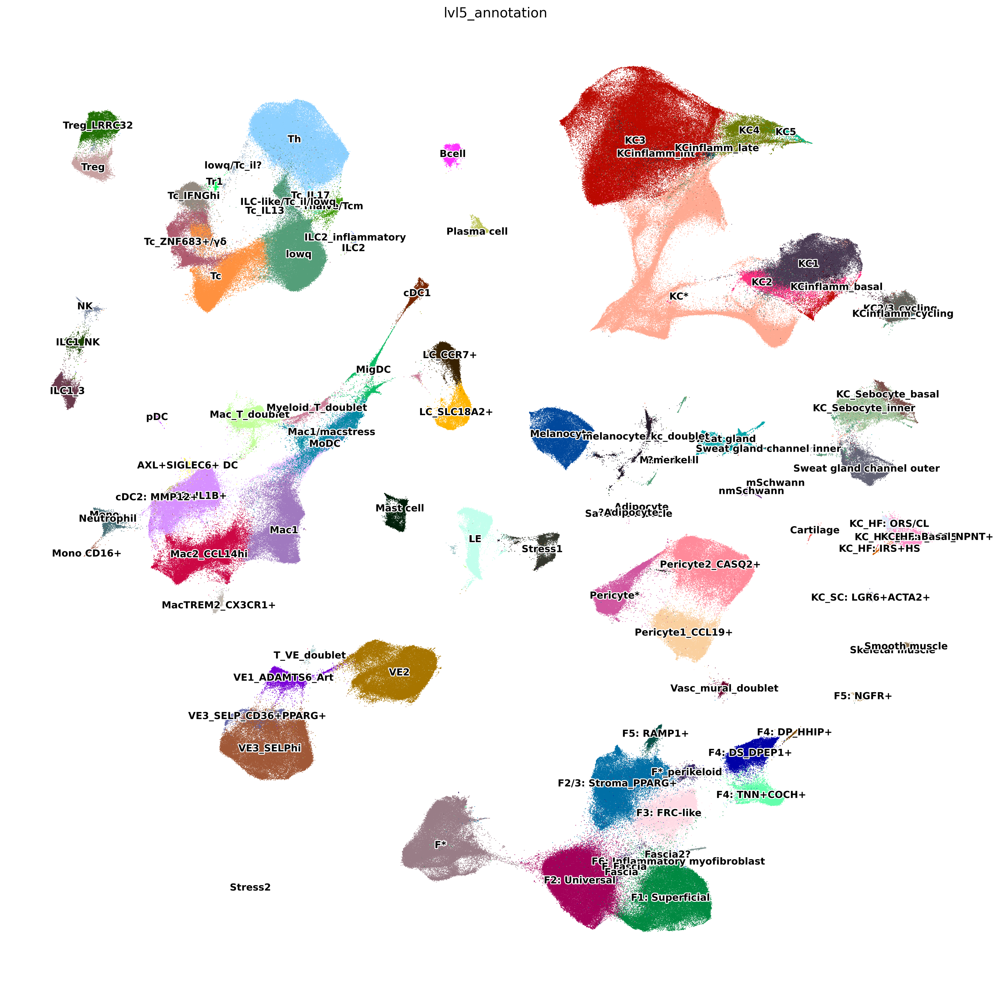

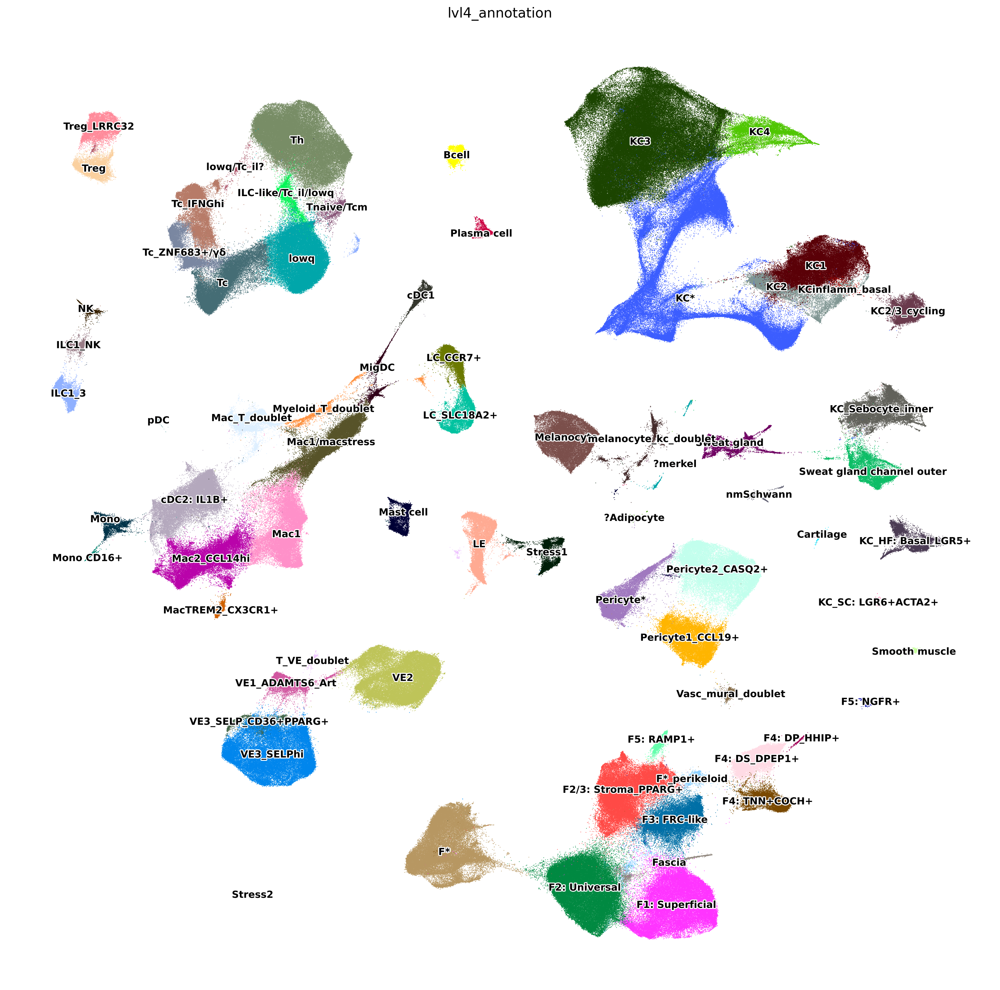

In [7]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl4_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
adata.write(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly.annotated')
adata

In [5]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scanvi5_nonlesional_6375'
os.listdir(base_dir + FILE_NAME)
base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly.annotated'

'/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_6375/adata_all_scvi5.h5ad.countsonly.annotated'

In [6]:
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_6375/adata_all_scvi5.h5ad.countsonly.annotated')

In [ ]:
adata

In [ ]:
adata.write('/nfs/team298/ls34/gold_adatas/adultskin/adata_skin_withjunk.h5ad')

In [ ]:
""" 
now run disease-all
"""

In [ ]:
2

In [ ]:
import scanpy as sc
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/adata_all_scvi5.h5ad.countsonly'
# adata_filename = 'adata_all_scvi5.h5ad.countsonly'
adata=sc.read_h5ad(base_dir)
adata

In [ ]:
import pickle
save_path = "/nfs/team298/ls34/labels_lvl5_annotation.pkl"
with open(save_path, 'rb') as file:
    label_dict = pickle.load(file)

In [ ]:

adata.obs['lvl5_annotation'] = adata.obs.index.map(label_dict).fillna("New/unlabelled/excluded")
adata.obs["lvl5_annotation_original"] = adata.obs['lvl5_annotation'] 

In [ ]:
adata = adata[adata.obs["Patient_status"].isin(["Psoriasis", "Eczema"])]
adata = adata[~adata.obs["dataset_id"].str.startswith("Psoriasis_Kim")]

In [ ]:

import scanpy as sc
base_dir='/nfs/team298/ls34/new_disease_atlas/adata_ad_psoriasis_only.h5ad'
adata.write(base_dir)
adata

In [ ]:
returnhere

In [ ]:
### w disease
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 450000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi6_all.%J.bsub.out -e ./1_scvi6_all.%J.bsub.err -R"select[mem>450000] rusage[mem=450000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi6_add_disease.sh



In [ ]:
### w disease
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-lotfollahi -n1 -M 450000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi6_all.%J.bsub.out -e ./1_scvi6_all.%J.bsub.err -R"select[mem>450000] rusage[mem=450000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi6_add_disease.sh



In [ ]:
### w disease
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-lotfollahi -n1 -M 450000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi6_all.%J.bsub.out -e ./1_scvi6_all.%J.bsub.err -R"select[mem>450000] rusage[mem=450000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi6_add_disease_incnonlesional.sh



In [ ]:
import os
#base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
adata_path = '/nfs/team298/ls34/new_disease_atlas/adata_healthy_plus_ad_psoriasis.h5ad'

#FILE_NAME ='model_scvi5_all_1994'
#os.listdir(adata_path)
import scanpy as sc
adata=sc.read_h5ad(adata_path)
adata

In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
adata.obs.Site_status.value_counts()

In [ ]:
adata

In [ ]:
adata.obs["disease"].value_counts()

In [ ]:
adata = ad.concat([adata2, adata_nl], label="disease", keys=["healthy", "nonlesional"])
adata_path = '/nfs/team298/ls34/new_disease_atlas/adata_healthy_plus_ad_psoriasis.h5ad'
adata.write(adata_path)


In [ ]:
import scanpy as sc
base_dir='/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_6375/'

adata_filename = 'adata_all_scvi5.h5ad.countsonly.annotated'
adata_nl=sc.read_h5ad(base_dir + adata_filename)
adata_nl


In [ ]:
import scanpy as sc
adata2 = sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/adata_ad_psoriasis_only.h5ad')
adata2

In [ ]:
adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/mrvi/adata_AA_vitiligo.h5ad')
adata

In [ ]:
adata_nl.obs.Patient_status.value_counts()

In [ ]:
adata_nl[adata_nl.obs.Patient_status=="AA"].obs.Site_status.value_counts()

In [ ]:
adata[adata.obs.Patient_status=="AA"].obs.Site_status.value_counts()

In [ ]:
adata2 = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/mrvi/adata_AD_psoriasis.h5ad')
adata2

# disease data

In [ ]:
import scanpy as sc
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/model_scanvi5_all_6377_gene/'
os.listdir(base_dir)



In [ ]:
adata=sc.read_h5ad(base_dir +  'adata_all_scvi6.h5ad.countsonly')
adata


In [ ]:
base_dir +  'adata_all_scvi6.h5ad.countsonly2'

In [ ]:
adata.obs["lvl5_a

In [ ]:
adata.write(base_dir +  'adata_all_scvi6.h5ad.countsonly2.highq')

In [ ]:
"""
scanvi vesrsion
"""

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "leiden_res2", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.pl.umap(adata,  
       color = [ "disease", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
# """
# scanvi vesrsion
# """

# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# sc.pl.umap(adata,  
#        color = [ "lvl5_annotation", 
#                ],
                
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data", legend_fontoutline=2,
#       legend_fontsize=10)
# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# sc.pl.umap(adata,  
#        color = [ "leiden_res2", 
#                ],
                
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data", legend_fontoutline=2,
#       legend_fontsize=10)

In [ ]:
KEEP = ["70", "84", "77", "63", "55"]
adata_ii =adata[adata.obs['leiden_res2'].isin(KEEP)]  

In [ ]:
KEEP = ["70", "84", "77", "63", "55"]
adata_i =adata[adata.obs['leiden_res2'].isin(KEEP)]  

In [ ]:
KEEP = ["39", "75", "71", "21", "5", "79", "76", "66", "70", "81", "48", "1"]
adata_i =adata[adata.obs['leiden_res2'].isin(KEEP)]  

In [ ]:
# sc.pl.umap(adata,  
#        color = [ "QC_hi", "QC_mid", 
#                ],
                
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data", legend_fontoutline=2,
#       legend_fontsize=10)

In [ ]:
# """
# scanvi vesrsion
# """

# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# sc.pl.umap(adata,  
#        color = [ "lvl5_annotation", 
#                ],
                
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data", legend_fontoutline=2,
#       legend_fontsize=10)


In [ ]:
# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# sc.pl.umap(adata,  
#        color = [ "leiden_res2", 
#                ],
                
#       s=2, vmax=5, vmin=-10,
#       legend_loc="on data", legend_fontoutline=2,
#       legend_fontsize=10)

In [ ]:
adata.obs.loc[adata.obs["leiden_res2"] == "9", "lvl5_annotation"] = "F*"
adata.obs.loc[adata.obs["leiden_res2"] == "26", "lvl5_annotation"] = "F*"
adata.obs.loc[adata.obs["leiden_res2"] == "35", "lvl5_annotation"] = "Pericyte*"
adata.obs.loc[adata.obs["leiden_res2"] == "81", "lvl5_annotation"] = "TMEM198_FGF10_Stress"
adata.obs.loc[adata.obs["leiden_res2"] == "76", "lvl5_annotation"] = "Stress5"
adata.obs.loc[adata.obs["leiden_res2"] == "75", "lvl5_annotation"] = "Stress5"
adata.obs.loc[adata.obs["leiden_res2"] == "70", "lvl5_annotation"] = "ve-like-singledonor"
adata.obs.loc[adata.obs["leiden_res2"] == "48", "lvl5_annotation"] = "stress4"

In [ ]:
adata[adata.obs['leiden_res2']=="34"].obs["dataset_id"].value_counts()


In [ ]:
adata[adata.obs['leiden_res2']=="34"].obs["sample_id"].value_counts()

In [ ]:
"""
scanvi vesrsion
"""

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [ "leiden_res2", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
adata.obs.loc[adata.obs["leiden_res2"] == "55", "lvl5_annotation"] = "Sweat gland"
adata.obs.loc[adata.obs["leiden_res2"] == "63", "lvl5_annotation"] = "melanocyte_kc_doublet"
adata.obs.loc[adata.obs["leiden_res2"] == "63", "lvl5_annotation"] = "lowq"

In [ ]:
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata_i, 'leiden_res2', method='t-test', key_added="de_leiden");
df2 = pd.DataFrame(adata_i.uns['de_leiden']['names'])

#file_path = BASE_DIR + "df2.csv"

# Save the DataFrame to a CSV file
#df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers
df2.iloc[:, ].head(5)


In [ ]:
for i,x in enumerate(df2.columns):
    print(i,x)

In [ ]:
# All categories including both new and existing ones
new_categories = [
    #"KC_cDC2_doublet", 
    #"F1_Single_donor", 
    #"Mac1/macstress", 
    #"?merkel", 
    #"lowq/Tc_il?", 
    #"F*_perikeloid",
    #"?Adipocyte",
    "TMEM198_FGF10",
    "TMEM198_FGF10_Stress",
    "Stress5",
    "ve-like-singledonor",
    "stress4"
]

# Add the new categories to the lvl5_annotation column
adata_i.obs["lvl5_annotation"] = adata_i.obs["lvl5_annotation"].cat.add_categories(new_categories)

# Now assign values based on leiden_res2
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "71", "lvl5_annotation"] = "F1_Single_donor"
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "79", "lvl5_annotation"] = "TMEM198_FGF10"
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "81", "lvl5_annotation"] = "TMEM198_FGF10_Stress"
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "76", "lvl5_annotation"] = "Stress5"
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "75", "lvl5_annotation"] = "Stress5"
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "70", "lvl5_annotation"] = "ve-like-singledonor"
adata_i.obs.loc[adata_i.obs["leiden_res2"] == "48", "lvl5_annotation"] = "stress4"

In [ ]:
"55": "Sweat",
"63": "Melanocyte_doublet",
"77": "Lowq/erythroid"

In [ ]:
# All categories including both new and existing ones
new_categories = [
    "KC_cDC2_doublet", 
    "F1_Single_donor", 
    #"Mac1/macstress", 
    #"?merkel", 
    #"lowq/Tc_il?", 
    #"F*_perikeloid",
    #"?Adipocyte",
    "TMEM198_FGF10",
    "TMEM198_FGF10_Stress",
    "Stress5",
    "ve-like-singledonor",
    "stress4"
]

# Filter out categories that are already in the current "lvl5_annotation"
existing_categories = adata.obs["lvl5_annotation"].cat.categories
new_categories_to_add = [cat for cat in new_categories if cat not in existing_categories]

# Add the new categories (only those not already present)
if new_categories_to_add:
    adata.obs["lvl5_annotation"] = adata.obs["lvl5_annotation"].cat.add_categories(new_categories_to_add)

# Now assign values based on leiden_res2
adata.obs.loc[adata.obs["leiden_res2"] == "61", "lvl5_annotation"] = "KC_cDC2_doublet"
adata.obs.loc[adata.obs["leiden_res2"] == "71", "lvl5_annotation"] = "F1_Single_donor"
adata.obs.loc[adata.obs["leiden_res2"] == "79", "lvl5_annotation"] = "TMEM198_FGF10"
adata.obs.loc[adata.obs["leiden_res2"] == "81", "lvl5_annotation"] = "TMEM198_FGF10_Stress"
adata.obs.loc[adata.obs["leiden_res2"] == "76", "lvl5_annotation"] = "Stress5"
adata.obs.loc[adata.obs["leiden_res2"] == "75", "lvl5_annotation"] = "Stress5"
adata.obs.loc[adata.obs["leiden_res2"] == "70", "lvl5_annotation"] = "ve-like-singledonor"
adata.obs.loc[adata.obs["leiden_res2"] == "48", "lvl5_annotation"] = "stress4"

In [ ]:
select_pop = list(df2.columns)[-1
                              ]
print(select_pop)
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata_i,
    genes0,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    genes1,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    ["PTGES", "ARSG", "ALDOA", "BNIP3", "HILPDA", "SLC16A3", "ISG20", "IFITM1", "IL15RA"],
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)




In [ ]:

"84": ""

In [ ]:
adata[adata.obs["leiden_res2"]=="55"].obs["lvl5_annotation"].value_counts()

In [ ]:
sc.pl.dotplot(
    adata_i,
    genes0,
    groupby='lvl5_annotation',
   standard_scale="var",
    dendrogram=False)


In [ ]:
adata_i[adata_i.obs['leiden_res2']=="63"].obs["dataset_id"].value_counts()


In [ ]:
adata_i[adata_i.obs['leiden_res2']=="63"].obs["sample_id"].value_counts()

In [ ]:
# CATEGORY="lvl3_annotation"
FBS = {'F1': ['APCDD1',
  'COL18A1',
  'COL23A1',
  'COL13A1',
  'COMP',
  'NKD2',
  'RSPO1',
  'AXIN2',
  'WIF1',
  'SFRP2'],
                    "Activated F1": [ 'CRABP1',
  'TNFRSF21',
  'CXCL1'],
                   'F1+F6:My_Inf': ['WNT5A', 'COL7A1'],
 'F2: Universal': ['CD34',
  'PI16',
  'DPP4',
  'MFAP5',
  'PCOLCE2',
  'CTHRC1', 
  'SLPI',
  'CD70',
  'LGR5'],
 'F2/3: Bridge': ['CXCL12',
  'APOE',
  'EFEMP1',
  'APOC1',
  'C7',
  'PLA2G2A',
  'PPARG',
  'MYOC',
  'GDF10'],
 'F3': ['CCL19',
  'CD74',
  'CH25H',
  'TNFSF13B',
  'IL33',
  'IRF8',
  'IL15',
  'VCAM1',
  'HLA-DRA',
  'HLA-DRB1'],
          "Activated F3": ["ADAMDEC1", "CXCL9", "CXCL10"],
 'F4': ['ASPN'],
 'F4: DS_DPEP1+': ['COL11A1', 'MEF2C', 'DPEP1', 'MYL4'],
 'F4: TNN+COCH+': ['TNN',
  'COCH',
  'CRABP1',
  'COL24A1',
  'RSPO4',
  'SLITRK6',
  'NRG3',
  'MKX',
  'TNMD'],
 'F4: DP_HHIP+': ['CORIN',
  'BMP7',
  'WNT5A',
  'LEF1',
  'HHIP',
  'RSPO3',
  'INHBA',
  'PTCH1'],
 'F5': ['SCN7A', 'FMO2', 'FGFBP2', 'OLFML2A'],
 'F5+: RAMP1': ['RAMP1', 'RELN', 'PLEKHA6', 'IGFBP2', 'SFRP1'],
 'F5: NGFR+': ['EBF2', 'NGFR', 'SFRP4', 'ITGA6', 'CDH19', 'CLDN1'],
'F6: Myofibroblast inflammatory': ['CXCL8',
  'CXCL5',
  'CXCL6',
  'CXCL13',
  'IL11',
  'IL24',
  'MMP1',
  'MMP3',
  'IL7R',
  'INHBA',
  'CSF3',
  'TDO2',
  'WWC1',
  'CHI3L1',
  'STAT4',
  'CCL5',
  'CCL3',
  'CCL11'],
 'F6 (both)': ['WNT2', 'COL10A1', 'LAMP5'],
         
         }
sc.pl.dotplot(
    adata_i,
    FBS,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)


In [ ]:
sc.pl.dotplot(
    adata_i,
    ["WNT5A", "WNT5B", "COL7A1", "SFRP4" ,"HOXA13",],
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)


In [ ]:
adata_i[adata_i.obs['leiden_res2']=="70"].obs["dataset_id"].value_counts()


In [ ]:
adata_i[adata_i.obs['leiden_res2']=="70"].obs["sample_id"].value_counts()

In [ ]:
MISC_IMMUNE_SHORT = {        "Melanocyte": ["DCT", "MLANA", "PMEL", "SOX2",],
    "Schwann": ["MPZ",],
           "myelinating Schwann\n(mSchwann)": ['NFASC', 'NCMAP', 'MBP', 'PRX', "SFRP5","EGR2",
                                            "CLDN19", "GPR37L1"],
           
           "nonmyelinating Schwann\n(nmSchwann)": ['NGFR', 'SCN7A',   "PCDH20", 
                                                        'L1CAM', 'NCAM1'],

        "Cartilage": ["ACAN", "COL2A1"],
        "Adipocyte": ["ADIPOQ",  "FABP4", "PLIN1", "CIDEC"],
            "Merkel cell": ["ATOH1", "KRT20", "POU2F3",  ],
                     "Chemokines": ["IL11", "IL17B", "IL34", "IL16", "IL15", "IL17D", "CXCL12", "CXCL16", "CCL2",]


 #   "Plasma+Bcell": ["CD79A", "TNFRSF13C", "POU2AF1"  ],
  #      "Plasma": ["JCHAIN","MZB1","DERL3", "SPAG4", "CD38", ],
   #             "Bcell": ["MS4A1",  "CXCR5", "SHISA8", "CD19", "FCRL1"],
           #    "PDC": [ "MAP1A", "PTCRA" , "IL3RA", "P2RY6", "PTCRA",  "LILRA4", "RHEX", "SCT"],
      
    
    

               
      #  "Plasma_in_immuneonc": ["MZB1", "CENPV", "CXCL13", "RORC", "MCEMP1", "AIRE"]

               
}

sc.pl.dotplot(
    adata_i,
    MISC_IMMUNE_SHORT,
    groupby="leiden_res2",
    standard_scale="var",
    dendrogram=False,
) 


In [ ]:
adata_i[adata_i.obs['leiden_res2']=="79"].obs["dataset_id"].value_counts()

In [ ]:
,{x: [""] for x in adata_i.obs['leiden_res2'].unique()}

In [ ]:
sc.pl.dotplot(
    adata_i,
    genes2,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    genes3,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
 


In [ ]:
sc.pl.dotplot(
    adata,
    ["TCEAL2", "VCAN-AS1", "CRLF1", "AC092445.1", "HCG20" ],
    groupby='lvl5_annotation',
   standard_scale="var",
    dendrogram=False)
 

In [ ]:
sc.pl.dotplot(
    adata,
    genes0,
    groupby='lvl5_annotation',
   standard_scale="var",
    dendrogram=False)
 

In [ ]:
sc.pl.dotplot(
    adata,
    genes1,
    groupby='lvl5_annotation',
   standard_scale="var",
    dendrogram=False)
 

In [ ]:
adata.obs["lvl5_annotation_original"]=adata.obs["lvl5_annotation"]

In [ ]:
sc.pp.neighbors(adata_i, n_neighbors=20, use_rep="X_scvi")


In [ ]:
sc.tl.umap(adata_i, min_dist=0.1) #neighbor_key=)


In [ ]:
"""
scanvi vesrsion
"""

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_ii,  
       color = [ "lvl5_annotation", 
               ],
                
      s=200, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_ii,  
       color = [ "leiden_res2", 
               ],
                
      s=200, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
"""
scanvi vesrsion
"""

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [ "lvl5_annotation", 
               ],
                
      s=200, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [ "leiden_res2", 
               ],
                
      s=200, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
"""
scvi vesrsion
"""

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl4_annotation", 
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
sc.pl.umap(adata_i,  
       color = [ "lvl5_annotation", "leiden_res2", #"leiden_res0.2"
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

# Re-kNN ALL

In [ ]:
### no trash run  # more memory if nonlesional
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q normal -n1 -M 200000  -o ./1_reKNN.%J.bsub.out -e ./1_reKNN.%J.bsub.err -R"select[mem>200000] rusage[mem=200000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_nonlesional_knnonly.sh



In [ ]:
## HEALTHYT ONLY
### no trash run  # more memory if nonlesional
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q normal -n1 -M 500000  -o ./1_reKNN.%J.bsub.out -e ./1_reKNN.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi8_alldisease_knn.sh



In [ ]:
KEEP = ["45", "25", "44", "73", "50", "4", "82", "64", "72", "55", "52" ]
adata_i = adata[adata.obs["leiden_res2"].isin(KEEP)]
adata_i
sc.pl.umap(adata_i,  
       color = [ "lvl5_annotation", "leiden_res2", #"leiden_res0.2"
               ],
                
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)

In [ ]:
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata_i, 'leiden_res2', method='t-test', key_added="de_leiden");
df2 = pd.DataFrame(adata_i.uns['de_leiden']['names'])

#file_path = BASE_DIR + "df2.csv"

# Save the DataFrame to a CSV file
#df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers
df2.iloc[:, ].head(5)




In [ ]:
select_pop = list(df2.columns)[0]
print(select_pop)
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata_i,
    genes0,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    genes1,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    ["PTGES", "ARSG", "ALDOA", "BNIP3", "HILPDA", "SLC16A3", "ISG20", "IFITM1", "IL15RA"],
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)



In [ ]:
mac_markers={ 'Monocyte': ['CD14', 'VCAN', 'S100A8',# 'S100A9', 
              'S100A12', "FCN1",'MEFV'], #"FCGR3A"
 'Monocyte1': ['SERPINB2', 'MTF1', 'PTGER2'],
 'Monocyte2': ['FCGR1A', 'SYT1', 'ASGR1', 'PRAM1', 'CCR2'],
 'Mono_KC': ['KRT16', 'EGFR'],
 'Macrophage': ['C1QA', 'C1QC',  'CD163', 'CCL4', "STAB1",'MARCO', ],
      'Macro1': ['SLAMF9', 'TNFRSF6B',#"CXCL5", #"IL24"
                # "CCL24"
                ],

 'Macro2': ['MRC1','F13A1', "LYVE1","IGF1", "CCL13", 'CCL14', "CD209"],
 'T': ['CD3E', 'CD96', 'TRBC1'],
 'Macro_NEU4/LRRC32': ['CCL4L2', 'CCRL2', 'ACHE', 'NEU4', 'IL23A', 'CD40'],
 'TREM2+ADAMDEC1+': ['TREM2', 'ADAMDEC1', 'CXCL5', 'EPHB2', 'STAC', 'FAM20C'],
 'CX3CR1+MAC': ['TREM2', 'SPP1', 'CX3CR1', 'ADRB1', 
              # "KCNQ3"#"UNC5B", "GPR34", "SMAD7",  "CD72", "TGFBR1", 
             "AXL",#  "CD9",
                "LPL", "ADRB1",
                "P2RY12"
               ],
             'AXL+SIGLEC6+': ['AXL', 'SIGLEC6', 'NUMBL', 'IFI27', 'CXCR3', 'PLXNA4', 'KDR', "SELL"],

 'cDC1': ['CLEC9A', 'XCR1', "ENPP1", "PPY", "CD8A"],
 'cDC2': ['CLEC10A', 'CD1B', 'CD1C', "CD163", 'CD1E', # 'CD5', 
          #'SPIB', 'TNFSF4', 'TSPAN2'
         ],
 'cDC2B_subtype_IL1B': ['IL1B',"EREG", #'CROCC',
                   ],
             'cDC2B_subtype_MMP12': ['MMP12', "CST6", "GGT5", "CARD9",  "ALOX15", "CXCL9",#'CROCC',
                   ],
              'MoDC': [ 'THBS1',  'C1QTNF1', "INHBA", "TNFRSF4"],

 'LC': ['CD207','FCGBP', "EPCAM", 'CD1A', "SLC18A2", "TMEM45A", "IL22RA2","NMU" #"CLEC4A"
       ],
 'Migrating': ['CCR7', 'LAMP3',  ], 
 'MigDC': ['LY75', "CD200",  "BATF3",'SLCO5A1', 'WNT5B', 'ADAM12', "ACHE",
           "CD274", "PDCD1LG2", "IL12B", "IL15", "TNFSF4", "PVR", "RAMP1" , "EBI3", "CCL22", "CCL17", "ICOSLG",
          "TREML1"],  #'ST8SIA1', 'CCL19', "CCL17", "CCL22",
         
     #"TFPI", "SERINC2", #"IL10",
          #'LILRA1', 'LILRA2'
 'pDC': ['CLEC4C',  #'IL3RA', 'TNFRSF21', 
         'LILRA4', 'PTCRA', 'IGKJ5', 'LAMP5', "P2RY6", "ITGAE",  "PTGDS"],
 'Neutrophil': ['CXCL8', 'FCGR3B', "OSM", #KCNJ15, ADGRG3
               ],
                      #(adata.obs[CATEGORY]== "Neutrophil")]
              "Mast cell": [#"HPGDS", "KIT", "HPGD",
                    "HDC", #"GATA2",   
                    "TPSAB1", "TPSB2", "MS4A2","MRGPRX2",
                              "CALB2", "ALDH1A1" #"CAVIN2", "HEY1"
                ],
            #"OTHER": ["SECISBP2L"],
            }
sc.pl.dotplot(
    adata_i,
    mac_markers,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)

In [ ]:
sc.pl.dotplot(
    adata,
    genes2,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    genes3,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    genes4,
    groupby='leiden_res2',
   standard_scale="var",
    dendrogram=False)

##### 

In [ ]:
KCS_DIFF = ["KRT7", "KRT18", "CLDN7", "NOSTRIN", "PPP1R1B", "KRT19", "LRRC26", "AZGP1", "PART1", "GJC3", "CEACAM6", "FOXA1", "TTC6", "SLC34A2", "CHDH", "SYCP2", "HMGCS2", "MB",
           "CREB3L4", "OBP2B", 
            "ARHGEF38"
           ]  

In [ ]:
KC_MYELOID = ["KRT78", "RAET1E", "TYRO3", "LIPM" , "IGFL3",
           "ANO9", "BPIFC", "CYSRT1", "TGM1" , "GP1B", "NCCRP1", "SDR9C7", "RDH12", "ACER1", "NCCRP1", "SLURP1", "BPIFC", "GID8", "CNFN", "CLIC3", "ELOVL4", "DGAT2", "SLURP2",
             
             
             ]

In [ ]:
ILC_PROTEINS2 = {"ILC2": ['DPP4', 'VCAM1', 'IGF2R', 'TNFSF4', 'ICOSLG', 'PTGDR2', 'CDH2'],
    "ILC3": ['CLEC2B', 'KLRK1',  'TNFRSF4' , 'XCL1'],
               "Other": [#"IFITM3" ,'SLC3A2', 
                   'ITGAX', 'PECAM1'],
               "SLAM":  ['SLAMF7', 'SLAMF1', 'SLAMF8', 'SLAMF9', 'SLAMF6']}

sc.pl.dotplot(
    adata,
    ILC_PROTEINS2,
    groupby='lvl5_annotation',
   standard_scale="var",
    #swap_axes=True,
    dendrogram=False)


In [ ]:
# import os
# base_dir='/nfs/team298/ls34/new_disease_atlas/'
# #FILE_NAME =  'model_scanvi5_healthy_8401'
# FILE_NAME ='model_scvi5_healthy_5999'
# os.listdir(base_dir + FILE_NAME)



# import scanpy as sc
# adata=sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
# adata


# DISEASE

In [ ]:
import os
base_dir='/nfs/team298/ls34/new_disease_atlas/'
#FILE_NAME =  'model_scanvi5_healthy_8401'
FILE_NAME ='model_scvi5_all_1994'
os.listdir(base_dir + FILE_NAME)


In [ ]:
adata2

In [ ]:
# adata
# # base_dir = '/nfs/team298/ls34/disease_atlas/mrvi/'
# # adata_path = '/nfs/team298/ls34/new_disease_atlas/adata_healthy_notstar_nokcstar.h5ad'
# # adata_healthy=sc.read_h5ad(adata_path)
# # adata_healthy

In [ ]:
adata=sc.read_h5ad(base_dir + FILE_NAME + "/" + "adata.h5ad")


In [ ]:
adata

In [ ]:
adata.obs["Patient_status"].value_counts()

In [ ]:
"""
scVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata, 
       color = [ "lvl5_annotation",# "leiden_res0.2"
               ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# sc.pl.umap(adata2,  
#        color = [  "leiden_res1"],
#       s=2, vmax=5, vmin=-10, legend_fontoutline=2,
#       legend_loc="on data",
#       legend_fontsize=10)

In [ ]:
import scanpy as sc
adata2=sc.read_h5ad(base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly')
adata2


In [ ]:
"""
scVI
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata2, 
       color = [ "lvl5_annotation",# "leiden_res0.2"
               ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata2,  
       color = [  "leiden_res1"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
"""
scVI
"""
adata2.obs["test"] = [x if x =="Healthy" else "Other" for x in adata2.obs["Patient_status"]]
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata2, 
       color = [ "test", "lvl5_annotation"# "leiden_res0.2"
               ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
 

In [ ]:
adata2.obs["Patient_status"].value_counts()

In [ ]:
adata=adata[adata.obs["leiden_res1"]!="27"]

In [ ]:
adata=adata[adata.obs["leiden_res1"]!="15"]
adata

In [ ]:
base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly'

In [ ]:
adata.layers["counts"]=adata.X.copy()

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/adata_all_scvi5.countsonly_notstar.h5ad')


In [ ]:
base_dir + FILE_NAME + '/' + 'adata_all_scvi5.h5ad.countsonly'

In [ ]:
"""
need to now relabel healthy ...
""" 

In [ ]:
4

In [ ]:
adata_i  = adata[adata.obs["leiden_res1"].isin(["44", "4", "49", "6", "1", "9"])]


In [ ]:
adata_i.shape
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata_i, 'leiden_res1', method='t-test', key_added="de_leiden");
df3= pd.DataFrame(adata_i.uns['de_leiden']['names'])
df3.iloc[:, ].head(5)

# file_path = BASE_DIR + "df2.csv"

In [ ]:


# # Save the DataFrame to a CSV file
# df2.to_csv(file_path, index=False)  # index=False to exclude the row numbers

select_pop = list(df3.columns)[4]
genes0= df3[select_pop][:100]
genes1= df3[select_pop][100:200]
genes2= df3[select_pop][200:300]
genes3= df3[select_pop][300:400]
genes4= df3[select_pop][400:500]
genes5= df3[select_pop][500:600]

 
# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata_i,
    genes0,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata_i,
    genes1,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)
# sc.pl.dotplot(
#     adata,
#     genes2,
#     groupby='leiden_res1',
#    standard_scale="var",
#     dendrogram=False)

In [ ]:
sc.pl.dotplot(
    adata,
    ["MUSTN1", "TINAGL1", "MYLK", "SORBS2", "MYH11", "ISYNA1", "ITGA7", "MCAM", "MYOCD", "NRGN", "CNN1", "ESAM", "APOLD1",
    "SORT1", "SPEG", "CACNA1H", "HRH2", "NPNT", "DGKG", "SOX6", "PRDM16"
    ],
    groupby='leiden_res1',
   #standard_scale="var",
    dendrogram=False)

In [ ]:
# adata_labelled = sc.read_h5ad(ADATA_PATH_FOR_LABELS)
# label_dict = adata_labelled.obs[LVL3_ANNOTATION].to_dict()


In [ ]:
adata[adata.obs["Site_status"]=="PostRx"].obs.dataset_id.value_counts()

# Nonlesional

In [ ]:
import os
BASE_DIR = '/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_5577/'
os.listdir(BASE_DIR)

In [ ]:
import scanpy as sc
adata=sc.read_h5ad(BASE_DIR +'adata_all_scvi5.h5ad.countsonly')
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
# Add "lowq" as a new category to lvl5_annotation if not already present
if "lowq" not in adata.obs["lvl5_annotation"].cat.categories:
    adata.obs["lvl5_annotation"] = adata.obs["lvl5_annotation"].cat.add_categories("lowq")

# Update lvl5_annotation where leiden_res2 == "55"
adata.obs.loc[adata.obs["leiden_res2"] == "55", "lvl5_annotation"] = "lowq"

In [ ]:
# Add "lowq" as a new category to lvl5_annotation if not already present
if "lowq1" not in adata.obs["lvl5_annotation"].cat.categories:
    adata.obs["lvl5_annotation"] = adata.obs["lvl5_annotation"].cat.add_categories("lowq1")

# Update lvl5_annotation where leiden_res2 == "55"
adata.obs.loc[adata.obs["leiden_res2"] == "48", "lvl5_annotation"] = "lowq1"

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
BASE_DIR +'adata_all_scvi5.h5ad.countsonly'

In [ ]:
adata.write('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_5577/adata_all_scvi5.h5ad.countsonly')

In [ ]:
KEEP = ["63", "59", "74", "61", "15"]
adata_i = adata[adata.obs["leiden_res2"].isin(KEEP)]

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [ "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata_i.obs.lvl5_annotation.value_counts()

In [ ]:
adata_i.write('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_5577/adata_glia_healthy_nonlesional.h5ad')


# Add AD + Psoriasis 

In [ ]:
### w disease
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 400000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi6_all.%J.bsub.out -e ./1_scvi6_all.%J.bsub.err -R"select[mem>400000] rusage[mem=400000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi6_add_disease.sh



In [ ]:
### w disease
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 500000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi6_all.%J.bsub.out -e ./1_scvi6_all.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi6_add_disease_.sh



In [ ]:
### w disease nonlesional
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-lotfollahi -n1 -M 500000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi6_all.%J.bsub.out -e ./1_scvi6_all.%J.bsub.err -R"select[mem>500000] rusage[mem=500000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi6_add_disease_incnonlesional.sh



In [ ]:
"""
saves here
/nfs/team298/ls34/new_disease_atlas/ 

"""

In [ ]:
import scanpy as sc
base_dir='/nfs/team298/ls34/new_disease_atlas/model_scanvi5_nonlesional_6375/'

adata_filename = 'adata_all_scvi5.h5ad.countsonly.annotated'
adata=sc.read_h5ad(base_dir + adata_filename)
adata

In [ ]:
KEEP = [x for x  in adata.obs["lvl5_annotation"].unique() if  "*" in x]
adata[(adata.obs["lvl5_annotation"].isin(KEEP)) | (adata.obs["dataset_id"] == "Huda")].shape

In [ ]:
1628203 - 290850

In [ ]:
adata - 137290

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
'/nfs/team298/ls34/new_disease_atlas/adata_healthy_plus_ad_psoriasis.h5ad'

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/model_scvi5_all_1994/adata_all_scvi6.h5ad.countsonly')
adata

In [ ]:
adata.obs.Site_status.value_counts()

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
adata2 = sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/adata_ad_psoriasis_only.h5ad')
adata2

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/adata_healthy_plus_ad_psoriasis.h5ad.HVGs')
adata


In [ ]:
adata.obs["Patient_status"].value_counts()

In [ ]:
import os
BASE_DIR = '/nfs/team298/ls34/new_disease_atlas/model_scvi5_all_5106/'
os.listdir(BASE_DIR)

In [ ]:
import scanpy as sc
adata=sc.read_h5ad(BASE_DIR +'adata_all_scvi6.h5ad.countsonly')
adata

In [ ]:
adata.obs["Patient_status"].value_counts()

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res2"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation", "leiden_res0.2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [  "leiden_res1"],
      s=2, vmax=5, vmin=-10, legend_fontoutline=2,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata

In [ ]:
adata[adata.obs["leiden_res1"]=='42'].obs['dataset_id'].value_counts()

In [ ]:
adata[adata.obs["leiden_res1"]=='35'].obs['sample_id'].value_counts()

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
df2

In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
# import pandas as pd
# df2 = pd.read_csv(BASE_DIR + "df2.csv")
# df2.head(5)

In [ ]:
for i,x in enumerate(df2.columns):
    print(i,x)

In [ ]:
select_pop = list(df2.columns)[12]
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata,
    genes0,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    genes1,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)
sc.pl.dotplot(
    adata,
    genes2,
    groupby='leiden_res1',
   standard_scale="var",
    dendrogram=False)

In [ ]:
adata = adata[~adata.obs["leiden_res1"].isin(["45","12" ,"35"])]#.unique()]



In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
adata.obs["test"] = [x if x == "Church_Healthy" else "Other" for x in adata.obs["dataset_id"]]
sc.pl.umap(adata,  
       color = [ "test"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
adata.obs["test"] = [x if x == "Psoriasis_Kim0" else "Other" for x in adata.obs["dataset_id"]]
sc.pl.umap(adata,  
       color = [ "test"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
adata.obs["test"] = [x if x == "Psoriasis_Kim2" else "Other" for x in adata.obs["dataset_id"]]
sc.pl.umap(adata,  
       color = [ "test"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

# add disease

In [1]:
import scanpy as sc
import os
import numpy as np
"""
this is just filtering whole (clean) integration to include healthy only
"""
base_dir = '/nfs/team298/ls34/new_disease_atlas/'
FILE_NAME = 'model_scanvi5_all_5106'
os.listdir(base_dir+FILE_NAME)



['adata_all_scvi6.h5ad',
 'adata.h5ad',
 'model.pt',
 'adata_all_scvi6.h5ad.countsonly']

In [2]:
adata=sc.read_h5ad(base_dir+FILE_NAME+'/'+'adata_all_scvi6.h5ad.countsonly')
adata

AnnData object with n_obs × n_vars = 1144942 × 36601
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'lvl3_annotation', 'lvl2_annotation', 'lvl0_annotation', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid', 'leiden_res0.2', 'leiden_res2', 'lvl5_annotation', 'lvl5_annotation_original'
    uns: 'leiden_res2', 'log1p', 'neighbor_20', 'umap'
    obsm: 'X_scvi', 'X_umap'
    obsp: 'neighbor_20_connectivities', 'neighbor_20_distances'

In [ ]:
adata

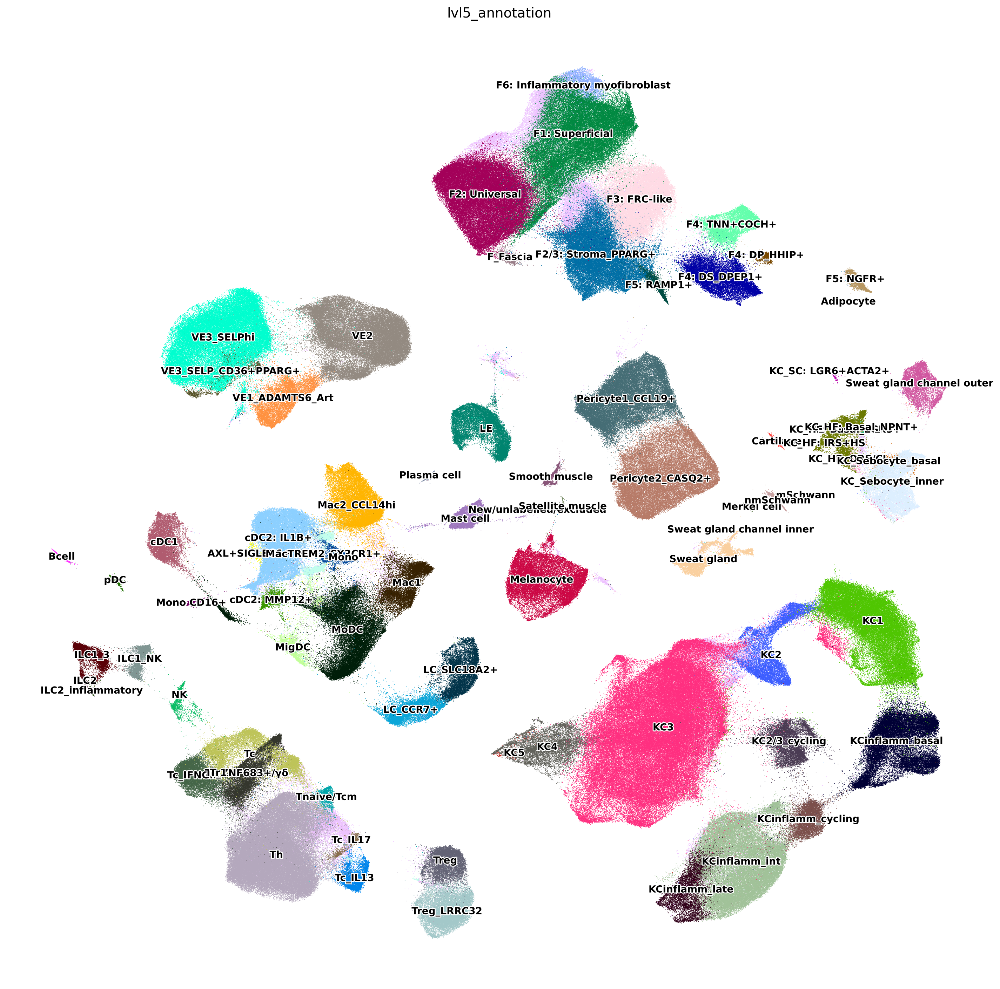

In [3]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl5_annotation" ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
# sc.pl.umap(adata,  
#        color = [  "leiden_res1"],
#       s=2, vmax=5, vmin=-10, legend_fontoutline=2,
#       legend_loc="on data",
#       legend_fontsize=10)

In [4]:
adata[adata.obs["lvl5_annotation"]=="Merkel cell"].shape

(2, 36601)

In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
adata[adata.obs["Patient_status"]=="Eczema"].obs.dataset_id.value_counts()

In [ ]:
7

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation" ],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", legend_fontoutline=2,
      legend_fontsize=10)
  

In [ ]:
import scanpy as sc
import os
import numpy as np
"""
reintegrated healthy
"""
adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/mrvi/model_scvi5_all_SCANVIversion_6614_new2_clustered/adata.h5ad')

In [ ]:
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation", "leiden_res0.2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata.obs["leiden_res0.2"].value_counts()

In [ ]:
adata.obs.lvl3_annotation.value_counts()

In [ ]:
adata=adata[~adata.obs['dataset_id'].str.startswith("Psoriasis_Kim")]

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

# Resident memory T cells

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_ALL_5762/adata_all_scvi5.h5ad.countsonly')
adata

In [ ]:
adata[adata.obs['Mapping_status']=="Disease"].obs.Patient_status.value_counts()

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = ["lvl5_annotation",  "leiden_res0.2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata_i=adata[adata.obs["leiden_res0.2"].isin(["0","9", "10", "12"])]

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["lvl5_annotation",  "Mapping_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["Patient_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata_i.write('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_ALL_5762/adata_all_scvi5.h5ad.countsonly.lymphoidonly')
adata_i

In [ ]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scvi")


In [ ]:
sc.tl.umap(adata, min_dist=0.1) #neighbor_key=)


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["lvl5_annotation",  "Mapping_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["Patient_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)
adata_i.obs["test"] = [x if x =="Vitiligo" else "Other" for x in adata_i.obs["Patient_status"]

sc.pl.umap(adata_i,  
       color = ["test"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
import scanpy as sc
adata_path = '/nfs/team298/ls34/new_disease_atlas/model_scanvi5_all_6377_genebatch/adata_all_scvi6.h5ad.countsonly.annotated2counts.clean2_nohs'
    #adata_path = '/nfs/team298/ls34/new_disease_atlas/model_scanvi5_all_6377_genebatch/adata_all_scvi6.h5ad.countsonly.annotated2counts'
adata=sc.read_h5ad(adata_path)

# resident memory

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_ALL_CLEAN_5935/adata_all_scvi5.h5ad')
adata


In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_ALL_CLEAN_5935/adata_all_scvi5.h5ad.countsonly')
adata


In [ ]:
adata[adata.obs['Mapping_status']=="Disease"].obs.Patient_status.value_counts()


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = ["lvl5_annotation",  "leiden_res0.2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata_i=adata[adata.obs["leiden_res0.2"].isin(["0","9", "10", "12"])]
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["lvl5_annotation",  "Mapping_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["Patient_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
        
      legend_fontsize=10)

In [ ]:






adata_i.write('/nfs/team298/ls34/new_disease_atlas/model_scanvi5_ALL_5762/adata_all_scvi5.h5ad.countsonly.lymphoidonly')
adata_i
sc.pp.neighbors(adata_i, n_neighbors=20, use_rep="X_scvi")
sc.tl.umap(adata, min_dist=0.1) #neighbor_key=)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["lvl5_annotation",  "Mapping_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata_i,  
       color = ["Patient_status"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)
adata_i.obs["test"] = [x if x =="Vitiligo" else "Other" for x in adata_i.obs["Patient_status"]

sc.pl.umap(adata_i,  
       color = ["test"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
import scanpy as sc
import os
import numpy as np
adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/mrvi/model_scvi5_all_SCANVIversion_6614_new2_clustered/adata.h5ad')
'/nfs/team298/ls34/new_disease_atlas/adata_scvi4_removedjunk_LC_MigDC_only.h5ad.clustered'

In [ ]:
import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
#[x for x in os.listdir(base_dir) if x.startswith('scvi4_all_SCVI')]
#adata_filename = 'adata_all_scvi5.h5ad'
#adata_filename = 'adata_all_scvi5.h5ad.countsonly'
adata_filename='adata_all_scvi5_healthy.h5ad.countsonly'
adata=sc.read_h5ad(base_dir + adata_filename)
adata


In [ ]:
adata_filename='/nfs/team298/ls34/disease_atlas/mrvi/adata_mrvi_all_scvi4_v4_healthyonlyusingallembeddings.h5ad.counts'
adata=sc.read_h5ad(adata_filename)
adata

In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
# adata = adata[~adata.obs["dataset_id"].isin(["Psoriasis_Kim2",
#                                            "Psoriasis_Kim0",
#                                             "Nail_Kim"
#                                            ])]
# adata.shape


In [ ]:
adata

In [ ]:
"""
EMBEDDINGS FROM ALL
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
"""
EMBEDDINGS FROM ALL
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "leiden_res2"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
adata = adata[~adata.obs.dataset_id.str.startswith("Psoriasis_Kim")]

In [ ]:
subset_cluster = ["10"]
sc.tl.leiden(adata, restrict_to=('leiden_res0.2',subset_cluster), resolution=0.1, random_state=1, key_added='core', neighbors_key='neighbor_30')


In [ ]:
"""
HEALTHY ONLY
"""
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color = [ "lvl3_annotation"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
sc.pl.dotplot(
    adata,
    "SLC7A5",
    groupby="Patient_status",
   standard_scale="var",
    dendrogram=False)

In [ ]:

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
sc.pl.umap(adata,  
       color ="Site_status_binary",
      s=2, vmax=5, vmin=-10,
      legend_loc="on data",
      legend_fontsize=10)

In [ ]:
1

In [ ]:
adata

In [ ]:
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(20, 20))

sc.pl.umap(adata,  
           color=["lvl3_annotation"],
           s=1,
           legend_loc="on data",
           legend_fontsize=20)


sc.pl.umap(adata,  
           color=['leiden_res0.2'],
           s=1,
           legend_loc="on data",
           legend_fontsize=20)

In [ ]:
adata_ilc = adata[adata.obs['leiden_res0.2']=="10"]#.obs.dataset_id.value_counts()

In [ ]:
adata_ilc.obs.Patient_status.value_counts()

In [ ]:

sc.pl.umap(adata_ilc,  
           color=["dataset_id"],
           s=1,
           #legend_loc="on data",
           legend_fontsize=20)



# scvi healthy

In [ ]:
### 
cd /nfs/team298/ls34/new_disease_atlas/

bsub -G team298 -q gpu-normal -n1 -M 640000 -gpu "mode=exclusive_process:num=1"  -o ./1_scvi5_all.%J.bsub.out -e ./1_scvi5_all.%J.bsub.err -R"select[mem>640000] rusage[mem=640000]"  bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_scvi5_all_healthy.sh



# scvi5

In [ ]:
import scanpy as sc
base_dir = '/nfs/team298/ls34/disease_atlas/mrvi/'
file_name = 'adata_all_scvi5.h5ad.countsonly'
adata=sc.read_h5ad(base_dir+file_name)

In [ ]:
adata

In [ ]:

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16, 16))
sc.pl.umap(adata,  
           color=["leiden_res2"],
           s=1,
           legend_loc="on data",
           legend_fontsize=12)



In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16, 16))
sc.pl.umap(adata,  
           color=["lvl3_annotation"],
           s=1,
           legend_loc="on data",
           legend_fontsize=12)



In [ ]:
adata = adata[adata.obs['leiden_res2'].isin(["25", "37", "16"])]


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16, 16))
sc.pl.umap(adata,  
           color=["lvl3_annotation"],
           s=1,
           legend_loc="on data",
           legend_fontsize=12)



In [ ]:
base_dir = '/nfs/team298/ls34/disease_atlas/mrvi/'
file_name = 'adata_BASAL_KC.h5ad'
adata.write(base_dir+file_name)
base_dir+file_name

In [ ]:
(base_dir+file_name)

In [ ]:
# sc.pp.subsample(adata, 0.1 )

In [ ]:
# Get value counts for each group in 'leiden_res2'
group_counts = adata.obs['leiden_res2'].value_counts()

# Identify groups with at least 2 counts
valid_groups = group_counts[group_counts >= 2].index

# Filter the adata object to keep only cells in valid groups
adata = adata[adata.obs['leiden_res2'].isin(valid_groups)].copy()

 

In [ ]:

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16, 16))
sc.pl.umap(adata,  
           color=["leiden_res2", "lvl3_annotation"],
           s=1,
           legend_loc="on data",
           legend_fontsize=12)



In [ ]:
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
#sc.tl.rank_genes_groups(adata, 'leiden_res2', method='t-test', key_added="de_leiden");
#df2 = pd.DataFrame(adata.uns['de_leiden']['names'])
for i, x in enumerate(df2.columns):
    print(i,x)


In [ ]:
select_pop = list(df2.columns)[73]

genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata,
    genes0,
    groupby="leiden_res2",
   standard_scale="var",
    dendrogram=False)

sc.pl.dotplot(
    adata,
    genes2,
    groupby="leiden_res2",
   standard_scale="var",
    dendrogram=False)

sc.pl.dotplot(
    adata,
    genes3,
    groupby="leiden_res2",
   standard_scale="var",
    dendrogram=False)

In [ ]:
adata

In [ ]:
adata.obs.Patient_status.value_counts()

In [ ]:
list(genes0)

In [ ]:
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(16, 16))
sc.pl.umap(adata,  
           color=["leiden_res0.2"],
           s=1,
           legend_loc="on data",
           legend_fontsize=12)



In [ ]:
adata_i=adata[adata.obs["leiden_res0.2"]=="7"]
adata_i

In [ ]:
adata_i.write('/nfs/team298/ls34/disease_atlas/mrvi/adata_melanocytes_schwann_cartilage.h5ad')

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/mrvi/adata_melanocytes_schwann_cartilage.h5ad')

In [ ]:
for x in ['ITGA1', 'IL12B', 'TGFB1', 'ITGB7', 'ITGB8', 'CCL10', 'CXCR6', 'CXCR3']:
    if not x in adata.var_names:
        print(x)

In [ ]:
[x for x in adata.var_names if x.startswith("CXCR")]

In [ ]:
FB_MARKERS = {"+ve": ["DCN", "PDGFRA", "LUM", "COL3A1", "FBLN1"],
              "-ve": ["PDGFRB", "PTPRC", "CD68"]}
sc.pl.dotplot(
    adata,
    FB_MARKERS,
    groupby="leiden_res0.2",
   standard_scale="var",
    dendrogram=False)

In [ ]:
adata=adata[adata.obs["leiden_res0.2"].isin(["2","8","22"])]
adata.shape

In [ ]:
adata=adata[adata.obs["Site_status_binary"]=="Lesional"]
adata.shape

In [ ]:
adata.obs.dataset_id.value_counts()

In [ ]:
adata = adata[~adata.obs["dataset_id"].isin(["Psoriasis_Kim2",
                                           "Psoriasis_Kim0",
                                            "Nail_Kim"
                                           ])]
adata.shape

In [ ]:
adata.obs["corefb_names"]="Lesional"
adata.obs["corefb_names_simple"]="Lesional"
adata.obs["test_ordered3"]="Lesional"
adata.obs["test_ordered4"]="Lesional"

In [ ]:
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
adata_filename = 'adata_scvi5_lesionalfbsonly.h5ad'
adata.write(base_dir+adata_filename)

In [ ]:
base_dir+adata_filename

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/mrvi/adata_scvi5_lesionalfbsonly.h5ad'
                  )

In [ ]:
adata.shape

In [ ]:
adata.obs["DonorID"]=adata.obs["sample_id"]

In [ ]:
# Calculate the value counts of DonorID
donor_counts = adata.obs['DonorID'].value_counts()

# Identify DonorID values that occur at least 50 times
valid_donors = donor_counts[donor_counts >= 50].index

# Filter adata to keep only the valid DonorID entries
adata = adata[adata.obs['DonorID'].isin(valid_donors)].copy()

# Remove categories with less than 50 occurrences from the DonorID column
adata.obs['DonorID'] = adata.obs['DonorID'].cat.remove_categories(
    [donor for donor in adata.obs['DonorID'].cat.categories if donor not in valid_donors]
)

adata.shape

##### import scanpy as sc
adata.write('/nfs/team298/ls34/disease_atlas/mrvi/adata_scvi5_lesionalfbsonly.h5ad'
                  )

In [ ]:
"""
go to jhub -. /fibroblast_atlas/1_fig1_ALLCELLS.ipynb to combine with nonlesional
"""

In [ ]:
STOP

# Plot fig 1

In [ ]:
import scanpy as sc
import os
import numpy as np
base_dir='/nfs/team298/ls34/disease_atlas/mrvi/'
[x for x in os.listdir(base_dir) if x.startswith('scvi4_all_SCVI')]
adata_filename = 'adata_scvi4_removedjunk.h5ad'
adata=sc.read_h5ad(base_dir + adata_filename)


In [ ]:
adata.obas["fb_vs_other"]=["Fibroblast" if x == "0" else "Other" for x in adata.obs["leiden_res0.2"]]
adata.obs["fb_vs_other"].value_counts()

In [ ]:
custom_colors = {
    "Fibroblast": "#b0e0f0", #"#36acca",  # Light blue
    "Other": "#D3D3D3"        # Light grey
}
adata.obs["fb_vs_other"] = adata.obs["fb_vs_other"].astype("category")
adata.uns['fb_vs_other_colors'] = [custom_colors[category] for category in adata.obs['fb_vs_other'].cat.categories]

# color_map = {
#     "Control_eczema": 
#     "Control_psoriasis": "#36acca",
#     "Eczema": "#fad09f",
#     "Psoriasis": "#f33033",
#     "Atlas": 
# }

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12,12))
# Plotting
sc.pl.umap(adata,  
           color="fb_vs_other",
           s=1,
           #legend_loc="on data",
           legend_fontsize=20)

In [ ]:
import numpy as np

# Create the new column based on the conditions
adata.obs["fb_vs_other2"] = np.where(
    (adata.obs["leiden_res0.2"] == "0") & (adata.obs["Site_status_binary"] == "Lesional"), "Fibroblast_lesional",
    np.where(
        (adata.obs["leiden_res0.2"] == "0") & (adata.obs["Site_status_binary"] == "Nonlesional"), "Fibroblast_nonlesional",
        "Other"
    )
)

# Define custom colors
custom_colors = {
    "Fibroblast_nonlesional": "#b0e0f0",  # Light blue
    "Fibroblast_lesional": "#B22222",  #FFB6C1",  # Light red
    "Other": "#D3D3D3"  # Light grey
}

# Ensure 'fb_vs_other2' is a categorical column
adata.obs["fb_vs_other2"] = adata.obs["fb_vs_other2"].astype("category")

# Map colors to the categories in 'fb_vs_other2'
adata.uns['fb_vs_other2_colors'] = [custom_colors[category] for category in adata.obs['fb_vs_other2'].cat.categories]

# Plotting
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="fb_vs_other2",
           s=1,
           legend_fontsize=20)


In [ ]:
adata.obs["fb_vs_other2"] = np.where(
    (adata.obs["leiden_res0.2"] == "0") & (adata.obs["Site_status_binary"] == "Lesional"), "Fibroblast_lesional",
    np.where(
        (adata.obs["leiden_res0.2"] == "0") & (adata.obs["Site_status_binary"] == "Nonlesional"), "Fibroblast_nonlesional",
        "Other"
    )
)

# Define custom colors
custom_colors = {
    "Fibroblast_nonlesional": "#b0e0f0",  # Light blue
    "Fibroblast_lesional":  "#FFB6C1",   #FFB6C1",  # Light red
    "Other": "#D3D3D3"  # Light grey
}

# Ensure 'fb_vs_other2' is a categorical column
adata.obs["fb_vs_other2"] = adata.obs["fb_vs_other2"].astype("category")

# Map colors to the categories in 'fb_vs_other2'
adata.uns['fb_vs_other2_colors'] = [custom_colors[category] for category in adata.obs['fb_vs_other2'].cat.categories]

# Plotting
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="fb_vs_other2",
           s=1,
           legend_fontsize=20)


In [ ]:
subset_cluster = ["10"]
sc.tl.leiden(adata, restrict_to=('leiden_res0.2',subset_cluster), resolution=0.1, random_state=1, key_added='core', neighbors_key='neighbor_30')


In [ ]:
rename_dict = {"0": "Fibroblasts",
               "6": "Pericytes",
               "10,2": "Schwann",
               "10,6": "Schwann",
              "2": "Keratinocyte",
                   "8": "Keratinocyte",
                "5": "Keratinocyte",
                   "9": "Keratinocyte",
                  "15": "Keratinocyte",
                "16": "Muscle",
                "13": "Endothelium",
               "4": "Endothelium",
                 "1": "Lymphoid",
               "12": "Lymphoid",
                 "11": "Lymphoid",
               "14": "Mast cell",
               "7": "Junk"
              
              }

adata.obs["all"] = adata.obs["core"].map(rename_dict).fillna("Other")
               


In [ ]:
sc.pl.umap(adata,  
           color=["all"],
           s=1,
           legend_loc="on data",
           legend_fontsize=6)

In [ ]:
adata = adata[adata.obs["all"]!="Junk"]

In [ ]:
rename_dict = {"0": "Fibroblasts",
               "6": "Pericytes",
               "10,2": "Schwann",
               "10,6": "Schwann"}

adata.obs["fbs_pericytes_other"] = adata.obs["core"].map(rename_dict).fillna("Other")
               


In [ ]:
sc.pl.umap(adata,  
           color=["fbs_pericytes_other"],
           s=1,
           legend_loc="on data",
           legend_fontsize=6)

In [ ]:
# Define custom colors
custom_colors = {
    "Pericytes": "#b0e0f0",  # Light blue
    "Fibroblasts":"#b0e0f0",   #FFB6C1",  # Light red
    "Schwann": "#b0e0f0",  
    "Other":    "#D3D3D3"  # Light grey
}

# Ensure 'fb_vs_other2' is a categorical column
adata.obs["fbs_pericytes_other"] = adata.obs["fbs_pericytes_other"].astype("category")

# Map colors to the categories in 'fb_vs_other2'
adata.uns['fbs_pericytes_other_colors'] = [custom_colors[category] for category in adata.obs['fbs_pericytes_other'].cat.categories]

# Plotting
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="fbs_pericytes_other",
           s=1,
           legend_fontsize=20)


In [ ]:
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, 'fbs_pericytes_other', method='t-test', key_added="de_leiden");
df2 = pd.DataFrame(adata.uns['de_leiden']['names'])
df2.iloc[:, ].head(40)

In [ ]:

select_pop = list(df2.columns)[0]
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata,
    genes0,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)

In [ ]:
sc.pl.dotplot(
    adata,
    genes1,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)
    
sc.pl.dotplot(
    adata,
    genes2,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)

In [ ]:
sc.pl.dotplot(
    adata,
    genes3,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)
    
sc.pl.dotplot(
    adata,
    genes4,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)

In [ ]:
sc.pl.dotplot(
    adata,
    genes5,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)
    
sc.pl.dotplot(
    adata,
    genes6,
    groupby="fbs_pericytes_other",
   standard_scale="var",
    dendrogram=False)

In [ ]:
adata_filename

In [ ]:
adata_filename="/nfs/team298/ls34/disease_atlas/mrvi/adata_mrvi_all_scvi4_clustered_ANNOTATED.h5ad"
adata.write(adata_filename)

In [ ]:
import pandas as pd
#adata_subset.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, 'all', method='t-test', key_added="de_leiden");
df2 = pd.DataFrame(adata.uns['de_leiden']['names'])
df2.iloc[:, ].head(40)

In [ ]:
select_pop = "Fibroblasts"
genes0= df2[select_pop][:100]
genes1= df2[select_pop][100:200]
genes2= df2[select_pop][200:300]
genes3= df2[select_pop][300:400]
genes4= df2[select_pop][400:500]
genes5= df2[select_pop][500:600]

genes6= df2[select_pop][600:700]
genes7= df2[select_pop][700:800]
genes8= df2[select_pop][800:900]
genes9= df2[select_pop][900:1000]
genes10= df2[select_pop][1000:1100]
genes11= df2[select_pop][1100:1200]
    #values = df_truncated[column][df_truncated[column].str.startswith("HOX", na=False)].tolist()
    #result_dict[column] = values

# Display the resulting dictionary
#print(result_dict)
sc.pl.dotplot(
    adata,
    genes0,
    groupby="all",
   standard_scale="var",
    dendrogram=False)

sc.pl.dotplot(
    adata,
    genes1,
    groupby="all",
   standard_scale="var",
    dendrogram=False)
    
sc.pl.dotplot(
    adata,
    genes2,
    groupby="all",
   standard_scale="var",
    dendrogram=False)

In [ ]:
sc.pl.dotplot(
    adata,
    genes3,
    groupby="all",
   standard_scale="var",
    dendrogram=False)

sc.pl.dotplot(
    adata,
    genes4,
    groupby="all",
   standard_scale="var",
    dendrogram=False)
    
sc.pl.dotplot(
    adata,
    genes5,
    groupby="all",
   standard_scale="var",
    dendrogram=False)

In [ ]:
, CFD,PDGFRA, LUM, COL1A1, COL1A2

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(5,5))
sc.pl.dotplot(
    adata,
     ["COL1A1", "COL1A2","COL3A1", "DCN", "LUM" ,"PDGFRA", "FBLN1"],
    groupby="all",# vmax=10, vmin=3,
   standard_scale="var",
    dendrogram=False)



In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(5,5))
sc.pl.umap(adata,  
       color = ["COL1A1", "LUM", "DCN", "COL3A1", "PDGFRA", "VIM"],
      s=2, vmax=20, vmin=0,
      legend_loc="on data", cmap="RdYlBu_r",
      legend_fontsize=10, ncols=3)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(5,5))
sc.pl.umap(adata,  
       color = ["COL1A1", "LUM", "DCN", "COL3A1", "PDGFRA", "VIM"],
      s=2, vmax=5, vmin=-10,
      legend_loc="on data", cmap="RdYlBu_r",
      legend_fontsize=10, ncols=3)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(5,5))
sc.pl.umap(adata,  
       color = ["PDGFRB"],
      s=2, vmax=5,
      legend_loc="on data", cmap="RdYlBu_r",
      legend_fontsize=10, ncols=3)

In [ ]:
STOP

In [ ]:
# adata.write(adata_filename, compression="gzip")



In [ ]:
adata



# Save nonlesional

In [ ]:
STOP

In [ ]:
adata_i = adata[adata.obs["leiden_res0.2"]=="0"]
adata_i = adata_i[adata_i.obs["Site_status_binary"]=="Nonlesional"]
donor_counts = adata_i.obs["DonorID"].value_counts()
donors_to_keep = donor_counts[donor_counts >= 100].index
adata_i = adata_i[adata_i.obs["DonorID"].isin(donors_to_keep)].copy()
adata_i.obs["DonorID"] = adata_i.obs["DonorID"].cat.remove_unused_categories()
adata_i.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbsonly_nonlesional.h5ad')


In [ ]:
how can i set rows where adata.obs.dataset_id=="Dermalsheath_Ahlers" to have adata.obs["Sex"]="Female"adata_i = adata[adata.obs["fbs_pericytes_other"]!="Other"]
# donor_counts = adata_i.obs["DonorID"].value_counts()
# donors_to_keep = donor_counts[donor_counts >= 100].index
# adata_i = adata_i[adata_i.obs["DonorID"].isin(donors_to_keep)].copy()
# adata_i.obs["DonorID"] = adata_i.obs["DonorID"].cat.remove_unused_categories()
# adata_i.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericyteschwann_only.h5ad')
adata_i = adata_i[adata_i.obs["Site_status_binary"]=="Nonlesional"]
donor_counts = adata_i.obs["DonorID"].value_counts()
donors_to_keep = donor_counts[donor_counts >= 100].index
adata_i = adata_i[adata_i.obs["DonorID"].isin(donors_to_keep)].copy()
adata_i.obs["DonorID"] = adata_i.obs["DonorID"].cat.remove_unused_categories()
adata_i.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericyteschwann_nonlesional.h5ad')

In [ ]:
stop

In [ ]:
adata_i = adata[adata.obs["leiden_res0.2"]=="0"]
adata_i = adata_i[adata_i.obs["Site_status_binary"]=="Lesional"]
donor_counts = adata_i.obs["DonorID"].value_counts()
donors_to_keep = donor_counts[donor_counts >= 100].index
adata_i = adata_i[adata_i.obs["DonorID"].isin(donors_to_keep)].copy()
adata_i.obs["DonorID"] = adata_i.obs["DonorID"].cat.remove_unused_categories()
adata_i.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbsonly_lesional.h5ad')


In [ ]:
adata_i = adata[adata.obs["fbs_pericytes_other"]!="Other"]
# donor_counts = adata_i.obs["DonorID"].value_counts()
# donors_to_keep = donor_counts[donor_counts >= 100].index
# adata_i = adata_i[adata_i.obs["DonorID"].isin(donors_to_keep)].copy()
# adata_i.obs["DonorID"] = adata_i.obs["DonorID"].cat.remove_unused_categories()
# adata_i.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericyteschwann_only.h5ad')
adata_i = adata_i[adata_i.obs["Site_status_binary"]=="Lesional"]
donor_counts = adata_i.obs["DonorID"].value_counts()
donors_to_keep = donor_counts[donor_counts >= 100].index
adata_i = adata_i[adata_i.obs["DonorID"].isin(donors_to_keep)].copy()
adata_i.obs["DonorID"] = adata_i.obs["DonorID"].cat.remove_unused_categories()
adata_i.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericyteschwann_lesional.h5ad')

# Integrate non-lesional

In [ ]:
## NL only
### putputs here /nfs/team298/ls34/disease_atlas/data2/

In [ ]:
### 1 gpu
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scvi222_pericytes.bsub.err
rm ./2_scvi222_pericytes.bsub.out
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scvi222_pericytes.bsub.out -e ./2_scvi222_pericytes.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_nl.sh

In [ ]:
### 3 gpus
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scvi222_pericytes.bsub.err
rm ./2_scvi222_pericytes.bsub.out
bsub -G team298 -q gpu-normal -n3 -M 100000 -gpu "mode=exclusive_process:num=3"  -o ./2_scvi222_pericytes.bsub.out -e ./2_scvi222_pericytes.bsub.err -R"select[mem>100000] rusage[mem=100000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_nl.sh

In [ ]:
### 2 gpus
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scvi222_pericytes.bsub.err
rm ./2_scvi222_pericytes.bsub.out
bsub -G team298 -q gpu-normal -n2 -M 100000 -gpu "mode=exclusive_process:num=2"  -o ./2_scvi222_pericytes.bsub.out -e ./2_scvi222_pericytes.bsub.err -R"select[mem>100000] rusage[mem=100000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_nl.sh

In [ ]:
### # change neighbor k
cd /nfs/team298/ls34/disease_atlas/mrvi/
#rm 0_load_all_data.bsub.out
#rm 0_load_all_data.bsub.err
bsub -G team298 -q normal -n10 -M 80000 -o ./neighbors.bsub.out -e ./neighbors.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_neighbors.sh

## max was 311_000 but might add more data

# Label nonlesional

In [ ]:
"""
go to jhub notebook: "/fibroblast_atlas/prep_fig1.ipynb"
output below
"""


# Merge nonlesional and lesional

In [ ]:
import scanpy as sc
import os
import numpy as np
### core fbs
#adata_nonlesional = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesnonlesional_SCVI_3526_new_neighbor50_ANNOTATED_umap30_leiden_paga3_FINALcoreonly.h5ad')
#adata_nonlesional.X[:5, :5].A
## normalised data currently


###
#adata_nonlesional = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesnonlesional_SCVI_3526_new_neighbor50_ANNOTATED_umap30_leiden_paga_allNOfascia_nogdf10.h5ad')
#adata_nonlesional.X[:5, :5].A

adata_nonlesional = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_nonlesional_fbsplusmural.h5ad')
adata_nonlesional.X[:5, :5].A


In [ ]:
adata.X[:5,:5].A

In [ ]:
## if ALREADY normalised
adata_nonlesional.X = adata_nonlesional.layers["counts"].copy()
del(adata_nonlesional.layers)

In [ ]:
import scanpy as sc
import scanpy as sc
import os
import numpy as np
adata_i = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbsonly_lesional.h5ad')

In [ ]:
#adata_i = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericyteschwann_lesional.h5ad')

In [ ]:
adata_i.obs["new_annotation2"] = "Lesional"
adata_i.obs["new_annotation3"] = "Lesional"
adata_i.obs["corefb_names"]= "Lesional"
adata_i.obs["corefb_names_simple"]= "Lesional"
adata_i.obs["fb_status_figs"]= "Lesional"

In [ ]:
adata_lesional_cols = adata_i.obs.columns
adata_nonlesional_cols = adata_nonlesional.obs.columns



In [ ]:
for x in adata_lesional_cols:
    if x not in adata_nonlesional_cols:
        print(x, " not in adata_nonlesional_cols") 

In [ ]:
for x in adata_nonlesional_cols:
    if x not in adata_lesional_cols:
        print(x, " not in adata_lesional_cols") 

In [ ]:
adata_i.var.index = adata_i.var["ensg_id"]
adata_nonlesional.var.index = adata_nonlesional.var["ensg_id"]

In [ ]:
import anndata as ad
adata = ad.concat([adata_i, adata_nonlesional])
adata.var

# Add CTCL

In [ ]:
# import scanpy as sc
# adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data/adata_fbsonly.h5ad')
# adata


In [ ]:
import scanpy as sc

In [ ]:
adata_cancers = sc.read_h5ad('/nfs/team298/ls34/adult_skin/preintegration_data/core_bcc_ctcl.h5ad')
adata_cancers.obs.Patient_status.value_counts()


In [ ]:
adata_ctcl = adata_cancers[adata_cancers.obs["Patient_status"]=="CTCL"]
adata_ctcl.var


In [ ]:
adata_ctcl.X [:5, :5].A

In [ ]:
adata_ctcl.obs["Site_status_binary"] = "Lesional"
adata_ctcl.obs["lvl0_annotation"] = "Lesional"
adata_ctcl.obs["lvl1_annotation"] = "Lesional"
adata_ctcl.obs["lvl2_annotation"] = "Lesional"
adata_ctcl.obs["lvl3_annotation"] = "Lesional"
adata_ctcl.obs["new_annotation2"] = "Lesional"
adata_ctcl.obs["new_annotation3"] = "Lesional"
adata_ctcl.obs["corefb_names"] = "Lesional"
adata_ctcl.obs["corefb_names_simple"] = "Lesional"




In [ ]:
adata_ctcl.obs["Patient_status"].value_counts()


In [ ]:
adata_ctcl_cols = adata_ctcl.obs.columns
adata_fbs_cols = adata.obs.columns
for x in adata_ctcl_cols:
    if x not in adata_fbs_cols:
        print(x, " not in adata_fbs") 

In [ ]:
for x in adata_fbs_cols:
    if x not in adata_ctcl_cols:
        print(x, " not in adata_ctcl") 

In [ ]:
import anndata as ad
adata = ad.concat([adata, adata_ctcl])
adata.var

In [ ]:
adata=adata_ctcl

In [ ]:
import pickle
with open('/lustre/scratch126/cellgen/team298/ls34/gene_ensgids_dictionaries.pkl', 'rb') as file:
    dictionaries = pickle.load(file)
    gene_dict = dictionaries['gene_dict']
    del(dictionaries)
adata.var["ensg_id"] = adata.var.index
adata.var["gene_symbol"] = adata.var.index.map(gene_dict)
adata.var_names = adata.var["gene_symbol"] 
del(adata.var["gene_symbol"] )
adata.var

In [ ]:
adata_i = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbsonly_lesional.h5ad')

In [ ]:
# Step 1: Convert var_names to sets
set_adata_i_var_names = set(adata_i.var_names)
set_adata_var_names = set(adata.var_names)

# Step 2: Find the genes in adata_i that are not in adata
genes_not_in_adata = list(set_adata_i_var_names - set_adata_var_names)

# Step 3: Count the number of such genes
count_genes_not_in_adata = len(genes_not_in_adata)

# Now, `genes_not_in_adata` is a list of genes in adata_i but not in adata,
# and `count_genes_not_in_adata` is the number of such genes.\


In [ ]:
# genes_not_in_adata

In [ ]:
genes_not_in_adata2 = [x for x in genes_not_in_adata if not x.startswith("AC0")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AC1")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AL1")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AL3")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AP0")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AL4")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AL6")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AL0")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AL5")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AC2")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AF0")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("AF5")]

genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not x.startswith("LINC")]
genes_not_in_adata2 = [x for x in genes_not_in_adata2 if not "-AS" in x]

len(genes_not_in_adata2)


In [ ]:
len(genes_not_in_adata2)#[2000:3000]

In [ ]:
import csv

filename = 'genes_not_in_adata2.csv'

# Write the list to a CSV file
with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    for gene in genes_not_in_adata2:
        writer.writerow([gene])

print(f"List saved to {filename}")

In [ ]:
count_genes_not_in_adata

# If want to add pericytes+schwann ?lesional

In [ ]:
# adata_pericytes = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_pericyteandschwannONLY.h5ad')
# adata_pericytes.var
# adata_pericytes.X [:5, :5].A

In [ ]:
# adata_pericyte_cols = adata_pericytes.obs.columns
# for x in adata_pericyte_cols:
#     if x not in adata_fbs_cols:
#         print(x, " not in adata_fbs") 

In [ ]:
# adata_pericytes.obs

In [ ]:
# adata_pericytes.obs["corefb_names"]=adata_pericytes.obs["new_annotation2"]
# adata_pericytes.obs["corefb_names_simple"]=adata_pericytes.obs["new_annotation1"]

In [ ]:
# for x in adata_fbs_cols:
#     if x not in adata_pericyte_cols:
#         print(x, " not in adata_pericyte_cols") 

In [ ]:
# adata.write('/nfs/team298/ls34/disease_atlas/data/adata_fbspericytesschwann_ctcladded.h5ad',compression="gzip")


In [ ]:
import numpy as np

conditions = [
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] != "Eczema") & (adata.obs["Patient_status"] != "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] == "Reynolds"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] != "Reynolds"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] != "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Psoriasis") & (adata.obs["dataset_id"] != "Reynolds"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Eczema") & (adata.obs["dataset_id"] != "Reynolds")
]

choices = [
    "Nonlesional atlas",
    "Eczema_nonlesional",
    "Psoriasis_nonlesional",
    "Psoriasis_lesional",
    "Eczema_lesional",
    "Eczema_nonlesional_other",
    "Psoriasis_nonlesional_other",
    "Psoriasis_lesional_other",
    "Eczema_lesional_other"
]

adata.obs["atlas_status_reynolds"] = np.select(conditions, choices, default=np.nan)


import numpy as np

conditions = [
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] != "Eczema") & (adata.obs["Patient_status"] != "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Eczema"),
    (adata.obs["Site_status_binary"] == "Nonlesional") & (adata.obs["Patient_status"] == "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Psoriasis"),
    (adata.obs["Site_status_binary"] == "Lesional") & (adata.obs["Patient_status"] == "Eczema")
]

choices = [
    "Nonlesional atlas",
    "Eczema_nonlesional",
    "Psoriasis_nonlesional",
    "Psoriasis_lesional",
    "Eczema_lesional"
]

adata.obs["atlas_status"] = np.select(conditions, choices, default=np.nan)

adata.obs["Site_status_binary"] = ["Nonlesional" if x=="Nonlesional" else "Lesional" for x in adata.obs["Site_status"]]
import numpy as np
adata.obs["Site_status2"] = np.where(
    adata.obs["Patient_status"] == "Healthy", "Healthy", 
    np.where(
        adata.obs["Site_status_binary"] == "Nonlesional", "Nonlesional", 
        "Lesional"
    )
)

import numpy as np

# Create the new column based on the specified conditions
adata.obs["Patient_status2"] = np.where(adata.obs["Site_status_binary"] == "Nonlesional", 
                                        "Nonlesional", 
                                        adata.obs["Patient_status"])

# Verify the new column
adata.obs["Patient_status2"].value_counts()

In [ ]:
for x in list(adata.obs["Patient_status2"].unique()):
    if x == "Nonlesional":
        a=1 # do nothing
    elif x in ["SCC", "Primary acral melanoma", "Melanoma", "BCC", "CTCL", "Merkel"]:
        a=1 #do nothing
    elif x in ["SSc", "Keloid", "Non-keloid scar", "Dupuytren’s Disease", "Neurofibroma"]:
        a=1#do nothing
    elif x in ["DLE", "Granuloma annulare", "SCLE", "HS", "Acne", "Sarcoidosis",  "AA", "Lyme_disease/Erythema migrans", "Eczema", "Psoriasis", "Prurigo nodularis" ]:
        a=1#do nothing
    else:
        print(x)

In [ ]:
adata.obs["Patient_status2"].value_counts()

In [ ]:
# Define the categories
CAF_conditions = ["SCC", "Primary acral melanoma", "Melanoma", "BCC", "CTCL", "Merkel"]
Scar_conditions = ["SSc", "Keloid", "Non-keloid scar", "Dupuytren’s Disease", "Neurofibroma"]
Inflamm_conditions = ["DLE", "Granuloma annulare", "SCLE", "HS", "Acne", "Sarcoidosis", 
                      "AA", "Lyme_disease/Erythema migrans", "Eczema", "Psoriasis", "Prurigo nodularis"]
Other = ["Polydactyly"]

# Create the new column with default value
adata.obs["Disease_status"] = adata.obs["Patient_status2"]

# Add the new categories
adata.obs["Disease_status"] = adata.obs["Disease_status"].astype("category")
new_categories = ["CAF",  "Scarring/fibrotic", "Inflammatory", "Other"]
adata.obs["Disease_status"] = adata.obs["Disease_status"].cat.add_categories(new_categories)

# Assign values based on conditions
adata.obs.loc[adata.obs["Disease_status"].isin(CAF_conditions), "Disease_status"] = "CAF"
adata.obs.loc[adata.obs["Disease_status"].isin(Scar_conditions), "Disease_status"] = "Scarring/fibrotic"
adata.obs.loc[adata.obs["Disease_status"].isin(Inflamm_conditions), "Disease_status"] = "Inflammatory"
adata.obs.loc[adata.obs["Disease_status"].isin(Other), "Disease_status"] = "Polydactyly"


#adata = adata[adata.obs["Disease_status"]!="Polydactyly"]
adata.obs["Disease_status"] = adata.obs["Disease_status"].cat.remove_unused_categories()

# Confirm the new column
print(adata.obs["Disease_status"].value_counts())


In [ ]:
adata = adata[adata.obs['Patient_status']!="Polydactyly"]


In [ ]:
adata.shape

In [ ]:
# adata.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_lesional.h5ad')

In [ ]:
adata.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs_mural_fstar_core.h5ad')

In [ ]:
adata.var.head(4)

In [ ]:
adata_pericytes.var

In [ ]:
# import scanpy as sc
# adata=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs.h5ad')





In [ ]:
adata.obs.Patient_status.value_counts()



In [ ]:
adata.obs.Site_status_binary.value_counts()

In [ ]:
adata.obs.Disease_status.value_counts()

In [ ]:
adata2 = adata[adata.obs["Disease_status"].isin(["Nonlesional", "Scarring/fibrotic"])]
adata2.obs["Disease_status"] = adata2.obs["Disease_status"].cat.remove_unused_categories()
print(adata2.obs["Disease_status"].value_counts())



In [ ]:
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_scar.h5ad',compression="gzip")
adata2.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar.h5ad')

In [ ]:
#adata2=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar.h5ad')

In [ ]:
adata_pericytes.obs["Disease_status"]="Nonlesional"
adata_pericytes.obs["Site_status_binary"]="Nonlesional"
adata_pericytes.obs["Patient_status2"]="Nonlesional"
adata_pericytes.obs["atlas_status_reynolds"]="Nonlesional"


 


In [ ]:
import anndata as ad
adata3 = ad.concat([adata2, adata_pericytes])
print(adata3.obs["Disease_status"].value_counts())


In [ ]:
adata3.var

In [ ]:
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_scar.h5ad',compression="gzip")
adata3.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar_pluspericytesschwann.h5ad')
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_scar.h5ad',compression="gzip")
#adata3.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar_pluspericytesschwann_PLUSLESIONALSCHWANN.h5ad')

In [ ]:
print(adata3.obs["Patient_status2"].value_counts())
adata3 = adata3[adata3.obs["Patient_status2"].isin(["Nonlesional", "Neurofibroma"])]

In [ ]:
print(adata3.obs["Patient_status2"].value_counts())


In [ ]:
adata3.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar_pluspericytesschwann_NEUROFIBonly.h5ad')


In [ ]:
adata2 = adata[adata.obs["Disease_status"].isin(["Nonlesional", "CAF"])]
adata2.obs["Disease_status"] = adata2.obs["Disease_status"].cat.remove_unused_categories()
print(adata2.obs["Disease_status"].value_counts())


In [ ]:
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_CAF.h5ad',compression="gzip")
adata2.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_CAF.h5ad')


In [ ]:
adata2 = adata[adata.obs["Disease_status"].isin(["Nonlesional", "Inflammatory"])]
adata2.obs["Disease_status"] = adata2.obs["Disease_status"].cat.remove_unused_categories()
print(adata2.obs["Disease_status"].value_counts())


In [ ]:
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_inflamm.h5ad',compression="gzip")
adata2.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_inflamm.h5ad')


# Add fetal to lesional+nonlesional

In [ ]:
# import pickle
# with open('/lustre/scratch126/cellgen/team298/ls34/gene_ensgids_dictionaries.pkl', 'rb') as file:
#     dictionaries = pickle.load(file)
#     gene_dict = dictionaries['gene_dict']
#     del(dictionaries)
# adata.var["ensg_id"] = adata.var.index
# adata.var["gene_symbol"] = adata.var.index.map(gene_dict)
# adata.var_names = adata.var["gene_symbol"] 
# del(adata.var["gene_symbol"] )
# adata.var

In [ ]:
adata_final.obs["Patient_status2"].value_counts()

In [ ]:
stop

# 2 scanvi lesional

In [ ]:
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_inflamm.h5ad',compression="gzip")
'/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_inflamm.h5ad'
#adata2.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_CAF.h5ad',compression="gzip")
'/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_CAF.h5ad'
 '/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar.h5ad'
'/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs.h5ad'


In [ ]:
adata = sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_inflamm.h5ad')
adata
#adata2.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_CAF.h5ad')
#adata2.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_scar.h5ad')
#adata.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs.h5ad')


In [ ]:
adata.obs["new_annotation2"].value_counts()

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_inflamm.bsub.out -e ./2_scanvi222_lesional_inflamm.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_scar.bsub.out -e ./2_scanvi222_lesional_scar.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_scar_peri.bsub.out -e ./2_scanvi222_lesional_scar_peri.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_caf.bsub.out -e ./2_scanvi222_lesional_caf.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_all.bsub.out -e ./2_scanvi222_lesional_all.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_only.bsub.out -e ./2_scanvi222_lesional_only.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/p
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional_scar.bsub.out -e ./2_scanvi222_lesional_scar.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_neurofb.bsub.out -e ./2_neurofb.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
import os
[x for x in os.listdir('/nfs/team298/ls34/disease_atlas/data2/') if x.startswith("adata_fbspericytesschwann_plus")]

In [ ]:
import scanpy as sc
adata=sc.read_h5ad( '/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_plus_CAF_SCANVIintegrated_7292.h5ad')
adata

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(5,5))
sc.pl.umap(adata,  
       color = ["new_annotation2"],
      s=2, vmax=5,
      legend_loc="on data", 
           cmap="RdYlBu_r",
      legend_fontsize=10, ncols=3)

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(5,5))
sc.pl.umap(adata,  
       color = ["Site_status2"],
      s=2, vmax=5,
      #legend_loc="on data", 
           cmap="RdYlBu_r",
      legend_fontsize=10, ncols=3)

In [ ]:
"""
outputs to 
/nfs/team298/ls34/fibroblast_atlas/fig1/
"""

# 3 scpoli - individual diseases

In [ ]:
cd /lustre/scratch126/cellgen/team298/adult_skin_visium/
rm scpoli.bsub.out 
rm scpoli.bsub.err
bsub -G team298 -q gpu-normal -n2 -M 150000 -gpu "mode=exclusive_process:num=2"  -o ./scpoli.bsub.out -e ./scpoli.bsub.err -R"select[mem>150000] rusage[mem=150000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/run_scpoli_individual.sh

In [ ]:
### gpu-hugre as only did some images
cd /lustre/scratch126/cellgen/team298/adult_skin_visium/
rm scpoli_individualdisease.bsub*
bsub -G team298 -q gpu-huge -n2 -M 150000 -gpu "mode=exclusive_process:num=2"  -m farm22-gpu0203 -o ./scpoli_individualdisease.bsub.out -e ./scpoli_individualdisease.bsub.err -R"select[mem>150000] rusage[mem=150000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/run_scpoli_individual.sh

In [ ]:
### gpu-nroemal  
cd /lustre/scratch126/cellgen/team298/adult_skin_visium/
rm scpoli_individualdisease.bsub*
bsub -G team298 -q gpu-normal -n2 -M 150000 -gpu "mode=exclusive_process:num=2"  -m farm22-gpu0203 -o ./scpoli_individualdisease.bsub.out -e ./scpoli_individualdisease.bsub.err -R"select[mem>150000] rusage[mem=150000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/run_scpoli_individual.sh

In [ ]:
cd /lustre/scratch126/cellgen/team298/adult_skin_visium/
bsub -G team298 -q gpu-normal -n2 -M 150000 -gpu "mode=exclusive_process:num=1"  -o ./SAMEREF.bsub.out -e ./SAMEREF.bsub.err -R"select[mem>150000] rusage[mem=150000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/run_scpoli_SAMEREF.sh

In [ ]:
"""
outputs to
/lustre/scratch126/cellgen/team298/adult_skin_visium

/lustre/scratch126/cellgen/team298/adult_skin_visium/
"""

In [ ]:
import fitz  # PyMuPDF
import matplotlib.pyplot as plt
import os

# Directory containing the PDF files
pdf_dir = '/lustre/scratch126/cellgen/team298/adult_skin_visium/'
pdf_files = [f for f in os.listdir(pdf_dir) if f.endswith('METHOD1.pdf')]

# Number of columns for display
n_cols = 3

# Calculate number of rows needed
n_rows = (len(pdf_files) + n_cols - 1) // n_cols

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Flatten the axs array for easy indexing if there's more than one row
if n_rows > 1:
    axs = axs.flatten()
else:
    axs = [axs]

for ax in axs[len(pdf_files):]:
    ax.axis('off')

for idx, pdf_file in enumerate(pdf_files):
    # Open the PDF file
    pdf_path = os.path.join(pdf_dir, pdf_file)
    document = fitz.open(pdf_path)
    
    # Get the first page
    page = document.load_page(0)
    
    # Render page to an image
    pix = page.get_pixmap()
    
    # Convert to a numpy array and plot
    img = pix.pil_tobytes("png")  # Convert to image bytes
    img = plt.imread(io.BytesIO(img))  # Read as an image array

    axs[idx].imshow(img)
    axs[idx].set_title(pdf_file)
    axs[idx].axis('off')

plt.tight_layout()
plt.show()


# 1 load

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm 1_load_scvi222.bsub.out
rm 1_load_scvi222.bsub.err
bsub -G team298 -q normal -n4 -M 300000 -o ./1_load_scvi222.bsub.out -e ./1_load_scvi222.bsub.err -R"select[mem>300000] rusage[mem=300000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/1_load_scvi222.sh

# 2 run scvi

In [ ]:
## NL only
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scvi222.bsub.err
rm ./2_scvi222.bsub.out
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scvi222.bsub.out -e ./2_scvi222.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222_nl.sh

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scvi222.bsub.err
rm ./2_scvi222.bsub.out
 
bsub -G team298 -q gpu-normal -n2 -M 160000 -gpu "mode=exclusive_process:num=2"  -o ./2_scvi222_new.bsub.out -e ./2_scvi222_new.bsub.err -R"select[mem>160000] rusage[mem=160000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scvi222.sh



# 2 SCANVI

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scanvi222.bsub.err
rm ./2_scanvi222.bsub.out
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222.bsub.out -e ./2_scanvi222.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_nl.sh

# lesional scanvi

In [ ]:
### outputs here
cd /nfs/team298/ls34/fibroblast_atlas/fig1/

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scanvi222.bsub.err
rm ./2_scanvi222.bsub.out
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_lesional.bsub.out -e ./2_scanvi222_lesional.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_lesional.sh

In [ ]:
### nonlesional scanvi
cd /nfs/team298/ls34/disease_atlas/mrvi/
rm ./2_scanvi222_nl.bsub.err
rm ./2_scanvi222_nl.bsub.out
bsub -G team298 -q gpu-normal -n1 -M 80000 -gpu "mode=exclusive_process:num=1"  -o ./2_scanvi222_nl.bsub.out -e ./2_scanvi222_nl.bsub.err -R"select[mem>80000] rusage[mem=80000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/2_scanvi222_nl.sh

# 3 scrublet and tidy

# regress out

In [ ]:
cd /nfs/team298/ls34/disease_atlas/mrvi/
bsub -G team298 -q normal -n4 -M 300000 -o ~/fibroblast_atlas/regressout.bsub.out -e ~/fibroblast_atlas/regressout.bsub.err -R"select[mem>300000] rusage[mem=300000]" bash /nfs/users/nfs_l/ls34/fibroblast_atlas/run_regressout.sh

# 4 All lesional and nonlesional

In [ ]:
"""
In notebook: fibroblast_atlas/1b_scpoli_TRAINALL.ipynb
"""

In [ ]:
import os
os.listdir('/nfs/team298/ls34/fibroblast_atlas/fig1/model_scpoli_allfibroblasts')

In [ ]:
# del(adata_latent_full.uns['lvl3_annotation_pred_colors'])
# # adata_latent_full.write("/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs_mural_fstar_core_SCPOLIadata_latent_full.h5ad")
# scpoli_query.save("/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs_mural_fstar_core_SCPOLImodel", save_anndata=True)


In [ ]:
import scanpy as sc
adata=sc.read_h5ad("/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs_mural_fstar_core_SCPOLImodel/adata.h5ad")
adata

In [ ]:
sc.tl.umap(adata_latent_full, mindist=0.2)

In [ ]:
adata=sc.read_h5ad("/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs_mural_fstar_core_SCPOLIadata_latent_full.h5ad")
adata

In [ ]:
adata_latent_full=adata.copy()

In [ ]:

sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="corefb_names",
           s=1,legend_loc="on data",
           legend_fontsize=20)
sc.pl.umap(adata,  
           color="lvl3_annotation_pred",
           s=1,legend_loc="on data",
           legend_fontsize=20)


In [ ]:
adata_path='/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs_mural_fstar_core.h5ad'
adata=sc.read_h5ad(adata_path)
adata.shape()

# Ref-query lesional fibroblasts

In [ ]:
import scanpy as sc
adata=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/model_scpoli_allfibroblasts/target_adata.h5ad')
adata

In [ ]:
# sc.pp.neighbors(adata, n_neighbors=100, use_rep="X_scpoli")
#sc.tl.umap(adata, min_dist=0.4) #neighbor_key=)


In [ ]:
#adata_latent_full.obs["lvl3_annotation_pred"].value_counts()

In [ ]:
# # Assuming adata is your AnnData object

# # Create the dictionary using zip
# barcode_to_annotation_pred = dict(zip(adata_latent_full.obs["barcode"], adata_latent_full.obs["lvl3_annotation_pred"]))



In [ ]:
#adata.obs["lvl3_annotation_pred"]=adata.obs["barcode"].map(barcode_to_annotation_pred).fillna("Missing")

In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="test_ordered3",
           s=1,legend_loc="on data",
           legend_fontsize=8)


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color=["PRSS23", "SFRP4", "ACTA2"],
           s=20,legend_loc="on data",
           legend_fontsize=8)


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="Site_status_binary",
           s=10,
           legend_fontsize=20)


In [ ]:
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
sc.pl.umap(adata,  
           color="Disease_status",
           s=3,
           legend_fontsize=20)


In [ ]:
# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(12, 12))
# sc.pl.umap(adata_latent_full,  
#            color="WNT5A",
#            s=3,
#            legend_fontsize=20)


# Add fetal to lesional+nonlesional

In [ ]:
# for x in adata_fetal_cols:
#     if x not in adata_cols:
#         print(x, " not in adata_fbs") 

adata = sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_and_lesional_fbs.h5ad')
adata.obs["Site_status_binary"].value_counts()
import anndata as ad
adata_final = ad.concat([adata, adata_fetal], label="Age_status", keys=['adult', 'fetal'])
adata_final.var

In [ ]:
import scanpy as sc
#adata_fetal = sc.read_h5ad ('/nfs/team298/ls34/disease_atlas/mrvi/adata_fetal_fbs.h5ad')
adata_fetal=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_fetalfbs_correctedccl19.h5ad')

adata_fetal.obs
adata_fetal.obs = adata_fetal.obs.rename(columns={"index": "barcode"})
#adata_fetal.obs = adata_fetal.obs.rename(columns={"donor": "DonorID"})
#adata_fetal.obs = adata_fetal.obs.rename(columns={"sample": "sample_id"})

adata_fetal.obs["dataset_id"]="fetal_haniffa"
adata_fetal.obs["GSE"]="fetal_haniffa"
adata_fetal.obs["Location"]="fetal_haniffa"
adata_fetal.obs["Age"]="fetal_haniffa"
adata_fetal.obs = adata_fetal.obs.rename(columns={"gender": "Sex"})
adata_fetal.obs["OriginalAnnotation"]=adata_fetal.obs["annotation_fine"]
adata_fetal.obs["lvl0_annotation"]=adata_fetal.obs["annotation_broad"]
adata_fetal.obs["lvl1_annotation"]=adata_fetal.obs["annotation_broad"]
adata_fetal.obs["lvl3_annotation"]=adata_fetal.obs["annotation_fine"]
adata_fetal.obs["lvl2_annotation"]=adata_fetal.obs["annotation_fine"]
adata_fetal.obs["Patient_status2"]="fetal"
adata_fetal.obs["Site_status2"]="fetal"

adata_fetal.obs["new_annotation3"]="fetal"
adata_fetal.obs["new_annotation2"]="fetal"

adata_fetal.obs["Site_status_binary"]="fetal"
adata_fetal.var
adata_fetal.obs["atlas_status_reynolds"]="fetal"
adata_fetal.obs["Disease_status"]="fetal"
adata_fetal.obs["Age"] = [float(x)/52 for x in adata_fetal.obs["pcw"] ]
adata_fetal.obs["Age"].value_counts()
adata_fetal_cols = adata_fetal.obs.columns

In [ ]:
adata_cols = adata.obs.columns
for x in adata_cols:
    if x not in adata_fetal_cols:
        print(x, " not in adata_fetal") 
        

In [ ]:
#adata_fetal.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_fetalfbs.h5ad')
adata_fetal.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_fetalfbs_correctedccl19.h5ad')


In [ ]:
print("done")

In [ ]:
adata_final = ad.concat([adata_nonlesional, adata_fetal], label="Age_status", keys=['adult', 'fetal'])


In [ ]:
donor_counts = adata_final.obs["DonorID"].value_counts()
valid_donors = donor_counts[donor_counts >= 50].index
adata_final = adata_final[adata_final.obs["DonorID"].isin(valid_donors)].copy()
adata_final.obs["DonorID"] = adata_final.obs["DonorID"].cat.remove_unused_categories()
adata_final.obs["Age"] = adata_final.obs["Age"].astype(str)
#adata_final.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_ctcladded_fetaladded_nonlesionalonly.h5ad',compression="gzip")


In [ ]:
adata_final.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_ALL_plus_fetal.h5ad')

# ADD fetal to nonlesional 

In [ ]:
import scanpy as sc
import anndata as ad
import os
import numpy as np
adata_nonlesional=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesnonlesional_SCVI_3526_new_neighbor50_ANNOTATED_umap30_leiden_paga3_FINALcoreonly.h5ad')
adata_nonlesional.X = adata_nonlesional.layers["counts"].copy()

adata_nonlesional = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_nonlesional_fbsplusmural.h5ad')
adata_nonlesional.X[:5, :5].A

In [ ]:
del(adata_nonlesional.layers)
#adata_fetal=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_fetalfbs.h5ad')
try:
    adata_fetal 
except:
    adata_fetal=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_fetalfbs_correctedccl19.h5ad')
adata_final = ad.concat([adata_nonlesional, adata_fetal], label="Age_status", keys=['adult', 'fetal'])
adata_final.var
donor_counts = adata_final.obs["DonorID"].value_counts()
valid_donors = donor_counts[donor_counts >= 50].index
adata_final = adata_final[adata_final.obs["DonorID"].isin(valid_donors)].copy()
adata_final.obs["DonorID"] = adata_final.obs["DonorID"].cat.remove_unused_categories()
adata_final.var
adata_final.obs["Age"] = adata_final.obs["Age"].astype(str)
#adata_final.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesschwann_ctcladded_fetaladded_lesional.h5ad',compression="gzip")


In [ ]:
adata_final.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_nonlesional_plus_fetal.h5ad')



# Merged labelled all(Lesional+nonlesional with fetal

In [ ]:
import scanpy as sc
import anndata as ad
#adata=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/model_scpoli_allfibroblasts10000/adata_clustered_annotated_nofstar.h5ad')
#adata_nofstar.write('/nfs/team298/ls34/fibroblast_atlas/fig1/model_scpoli_allfibroblasts10000/.h5ad')
#adata=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/model_scpoli_allfibroblasts10000/adata_clustered_annotated_nofstar.h5ad')
adata=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/model_scpoli_allfibroblasts10000/adata_clustered_annotated_nofstar2.h5ad')
adata.X[:5, :5].A

In [ ]:
adata

In [ ]:
adata.X = adata.layers["counts"]

In [ ]:
adata.obs["new_annotation3"]=adata.obs['test_ordered3']
adata.obs["new_annotation2"]=adata.obs['test_ordered3_simple']
adata.obs["lvl3_annotation"]=adata.obs['test_ordered3']
adata.obs["lvl2_annotation"]=adata.obs['test_ordered3_simple']

In [ ]:
#adata_fetal=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_fetalfbs.h5ad')
adata_final = ad.concat([adata, adata_fetal], label="Age_status", keys=['adult', 'fetal'])


In [ ]:
del(adata_final.obs["Age"])

In [ ]:
adata_final.write('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_ALLlabelled_plus_fetal.h5ad')


# merge nonlesional and lesional labelled

In [ ]:
import scanpy as sc
import anndata as ad
lesional_adata=sc.read_h5ad('/nfs/team298/ls34/fibroblast_atlas/fig1/adata_lesional.h5ad')

adata_nonlesional = sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/adata_fbspericytesnonlesional_SCVI_3526_new_neighbor50_ANNOTATED_umap30.h5ad',)
#lesional_adata.write('/nfs/team298/ls34/disease_atlas/data2/lesional_adata_labelled.h5ad')
adata_nonlesional = adata_nonlesional[~adata_nonlesional.obs['corefb_names2'].isin([ "mSchwann", "nmSchwann", "Adipocyte", #"Pericyte",
                                                          "Satellite muscle"])]
#lesional_adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/data2/lesional_adata_labelled.h5ad')


In [ ]:
adata_lesional_cols = lesional_adata.obs.columns
adata_nonlesional_cols = adata_nonlesional.obs.columns
for x in adata_nonlesional_cols :
    if x not in adata_lesional_cols:
        print(x, " not in LESIONAL_cols") 


In [ ]:
lesional_adata.obs["corefb_names2"] = "Lesional_unlabelled"




In [ ]:
adata_all=ad.concat([adata_nonlesional, lesional_adata])

In [ ]:
print(adata_all.shape)

# sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(14, 14))
# sc.pl.umap(adata_all, 
#                      color=["corefb_names2"],
#                      s=15,legend_loc="on data",
#                      show=False,  # Don't show the plot yet
#                      title='')

In [ ]:
adata_all.write('/nfs/team298/ls34/disease_atlas/data2/adata_fbs_fstar_vascmural_fascia_PLUSLESIONAL.h5ad',
               compression="gzip")


# run dis2p

In [ ]:
nonlesional = 5d_sko_disp2 maybe? or 5a/b

lesional+ nonlesional = 5c_sko_dis2p_simple_v3_LESIONAL

# Integrate external

In [ ]:
7_external if alone

map to skin: /fibroblast_atlas/2_scpoli_allREFQUERY_INCPERICYTESnONLES_EXTERNAL.

# current lesional integration

In [ ]:
https://jupyter.internal.sanger.ac.uk/user/ls34/lab/workspaces/auto-2/tree/fibroblast_atlas/2_scpoli_allREFQUERY_INCPERICYTESnonlesionalonly_shortversion.ipynb
need to remove polydactyl